In [1]:
import pandas as pd

# Chargement des données (le fichier .csv est supposé disponible localement)
data = pd.read_csv('UCI_Credit_Card.csv')
print(data.shape)  

(30000, 25)


In [2]:
# Regroupement des modalités rares avec une logique métier
data['EDUCATION'] = data['EDUCATION'].replace({5: 'Autres', 6: 'Autres', 0: 'Autres', 4: 'Autres'})

# Regroupement des statuts matrimoniaux
data['MARRIAGE'] = data['MARRIAGE'].replace({3: 'Autres', 0: 'Autres'})

# Regroupement des statuts de paiement
pay_columns = ['PAY_0', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6']
for col in pay_columns:
    data[col] = data[col].replace({-2: 'Paiement à temps', -1: 'Paiement à temps', 0: 'Paiement à temps',
                                    1: 'Retard', 2: 'Retard',
                                    3: 'Retard', 4: 'Retard', 5: 'Retard',
                                    6: 'Retard', 7: 'Retard', 8: 'Retard'})

In [3]:
# Regroupement des modalités rares avec une logique métier
data['EDUCATION'] = data['EDUCATION'].replace({5: 'Autres', 6: 'Autres', 0: 'Autres', 4: 'Autres'})

# Regroupement des statuts matrimoniaux
data['MARRIAGE'] = data['MARRIAGE'].replace({3: 'Autres', 0: 'Autres'})

# Regroupement des statuts de paiement
pay_columns = ['PAY_0', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6']
for col in pay_columns:
    data[col] = data[col].replace({-2: 'Paiement à temps', -1: 'Paiement à temps', 0: 'Paiement à temps',
                                    1: 'Retard', 2: 'Retard',
                                    3: 'Retard', 4: 'Retard', 5: 'Retard',
                                    6: 'Retard', 7: 'Retard', 8: 'Retard'})

In [4]:
# Transformation des données
categorical_columns = ['SEX', 'EDUCATION', 'MARRIAGE', 'PAY_0', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'default.payment.next.month']

for col in categorical_columns:
    data[col] = data[col].astype('category')

## Feature Engineering
### Analyse de Corrélation et Visualisation des Relations entre Variables




In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import itertools

def correlation_analysis(data):
    """
    Génère les heatmaps de corrélation (Pearson, Spearman, Kendall) et les nuages de points
    entre toutes les variables quantitatives d'un jeu de données.
    """
    # Sélection des variables quantitatives
    numeric_vars = data.select_dtypes(include=['number'])

    # Création des heatmaps pour chaque type de corrélation
    correlation_methods = ['pearson', 'spearman', 'kendall']
    for method in correlation_methods:
        plt.figure(figsize=(10, 8))
        sns.heatmap(numeric_vars.corr(method=method), annot=True, cmap='coolwarm', linewidths=0.5)
        plt.title(f"Heatmap de Corrélation - {method.capitalize()} Method")
        plt.show()

    # Génération des scatterplots pour chaque paire de variables
    variables = list(numeric_vars.columns)
    pairs = list(itertools.combinations(variables, 2))

    for x, y in pairs:
        plt.figure(figsize=(6, 4))
        sns.scatterplot(x=data[x], y=data[y], alpha=0.5)
        plt.title(f"Nuage de points entre {x} et {y}")
        plt.xlabel(x)
        plt.ylabel(y)
        plt.show()

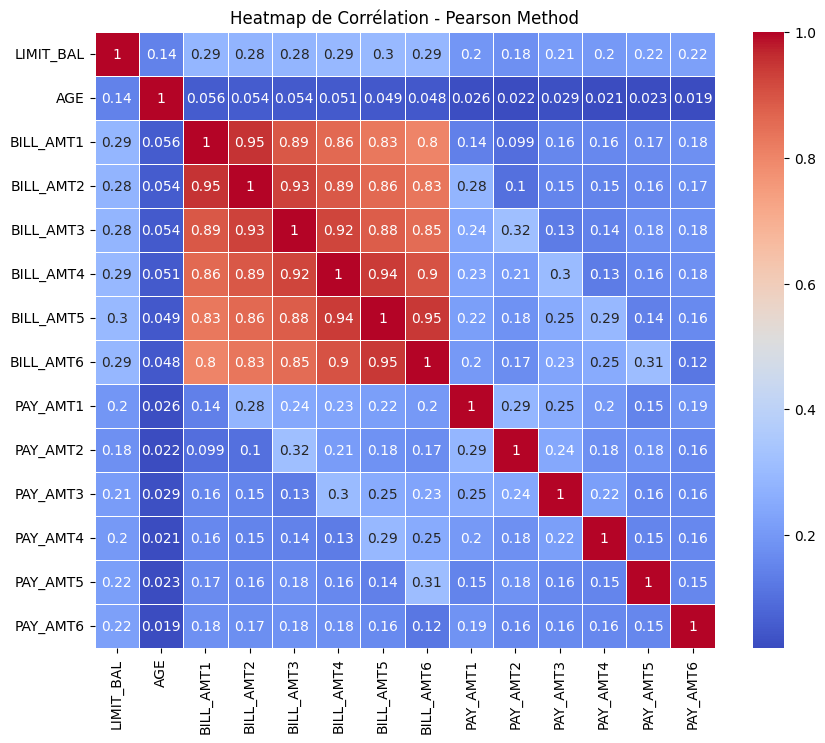

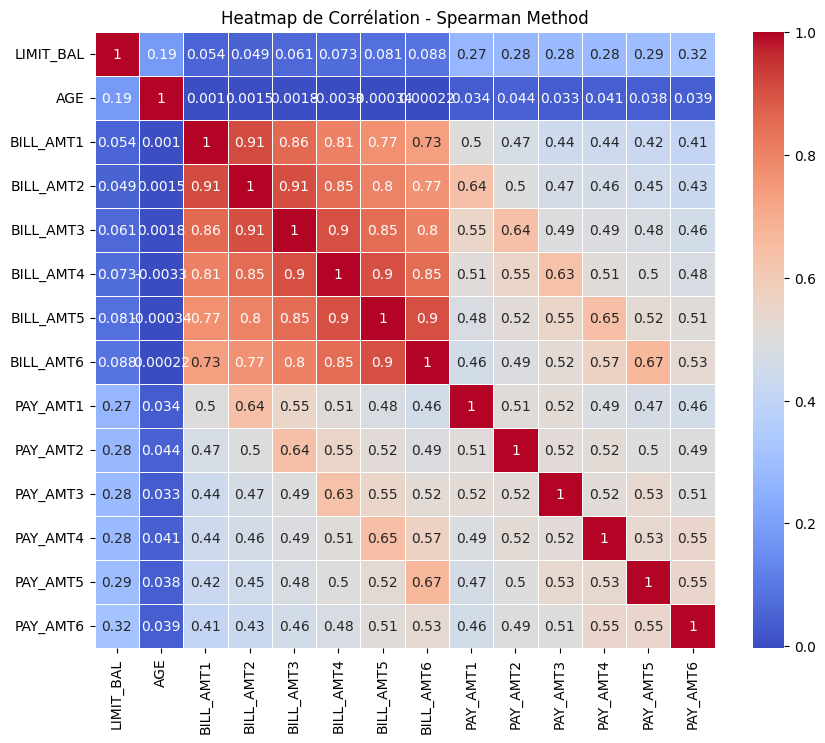

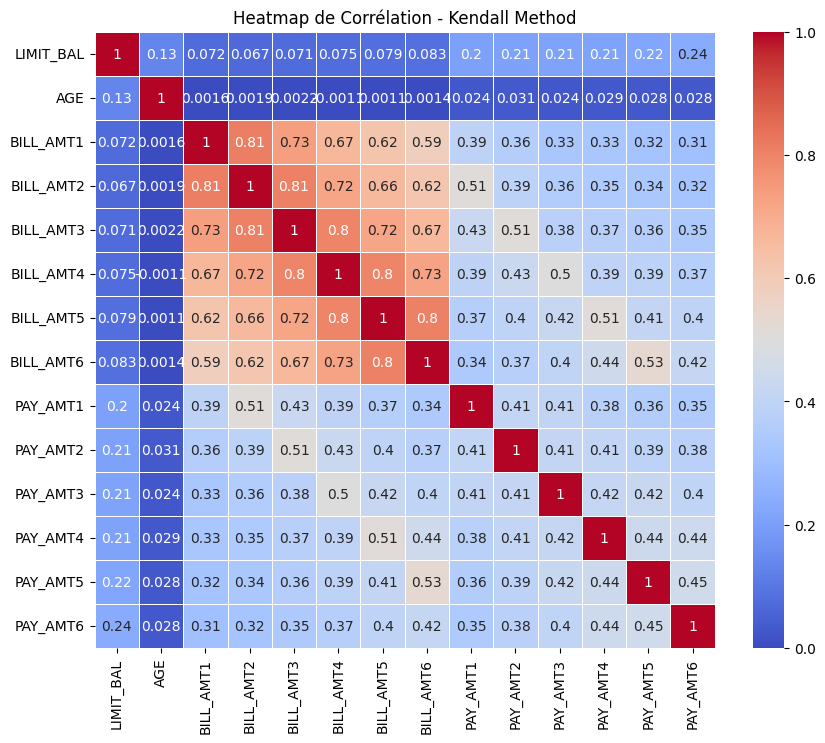

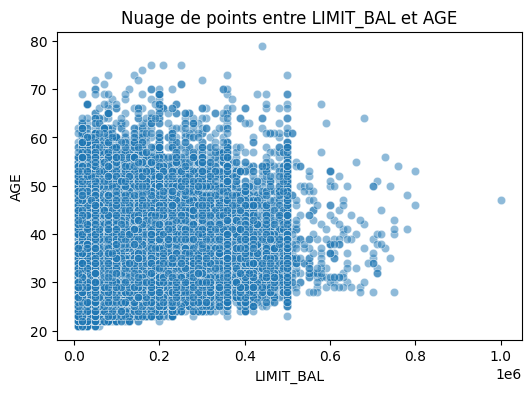

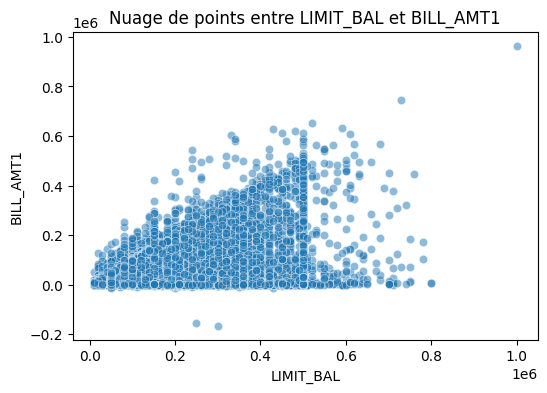

...

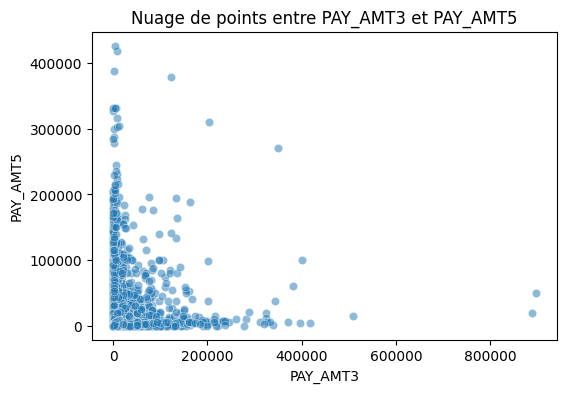

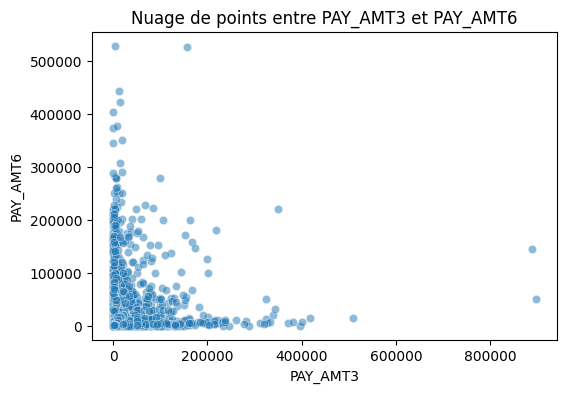

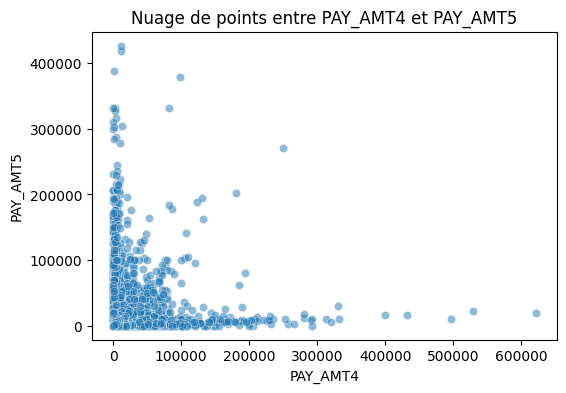

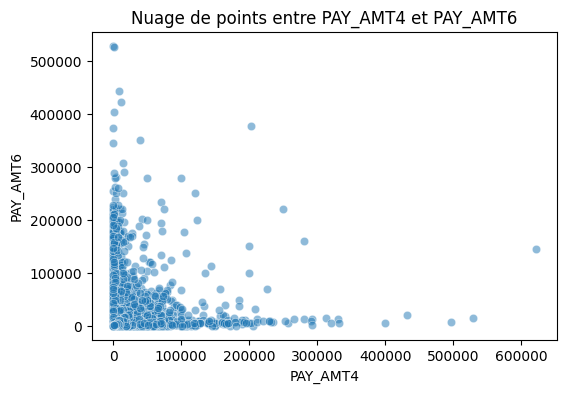

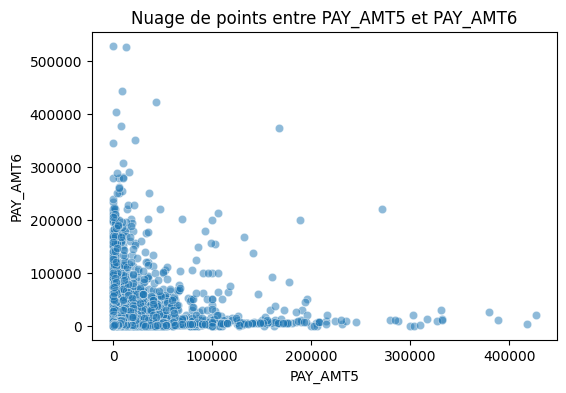

In [6]:
 # Suppression de la variable ID si présente
if 'ID' in data.columns:
    data = data.drop(columns=['ID'])

correlation_analysis(data)

- La **Heatmap de Corrélation** permet d'identifier les relations fortes entre variables et d'éviter la multicolinéarité.
- Les **nuages de points** permettent de visualiser les tendances et les dépendances entre variables quantitatives.
- L'utilisation des différentes méthodes (**Pearson, Spearman, Kendall**) permet d'analyser les relations sous différents angles (linéaire, monotone, ordinal).

##  Analyse des relations entre variables qualitatives
Dans une analyse exploratoire des données (EDA), l’étude des relations entre variables qualitatives est essentielle. Contrairement aux variables numériques où l'on peut utiliser des coefficients de corrélation classiques (Pearson, Spearman), ici on utilise des tests statistiques spécifiques comme le test du Khi-deux, le V de Cramer, et le T de Tschuprow.

## 2. Interprétation des tests
- **Tableau de contingence (fréquence bivariée)** : Permet de voir comment les modalités de deux variables qualitatives sont associées.
- **Test du Khi-deux** : Vérifie si deux variables qualitatives sont indépendantes statistiquement. Une p-valeur faible (< 0.05) indique une relation significative entre les variables.
- **V de Cramer** : Mesure l’intensité de l’association entre deux variables qualitatives (varie entre 0 et 1, où 1 indique une forte association).
- **T de Tschuprow** : Variante du V de Cramer qui fonctionne mieux pour des tableaux de contingence rectangulaires.



# Interprétation des résultats
## 1. Barplots et test du Khi-deux
- Chaque barplot permet de visualiser les répartitions entre deux variables qualitatives.
- Une **p-valeur inférieure à 0.05** dans le test du Khi-deux indique une relation significative entre les deux variables.
- Une **p-valeur supérieure à 0.05** indique que les variables sont probablement indépendantes.

## 2. Heatmaps de V de Cramer et T de Tschuprow
- **V de Cramer** : Plus la valeur est proche de 1, plus l’association est forte.
- **T de Tschuprow** : Variante du V de Cramer qui fonctionne mieux pour des tableaux de contingence non carrés.

# Conclusion
Cette analyse permet de :

✅ Identifier les relations entre variables qualitatives et leur intensité.

✅ Détecter les associations fortes ou faibles grâce aux tests statistiques.

✅ Visualiser les relations de manière claire avec les heatmaps de corrélation.

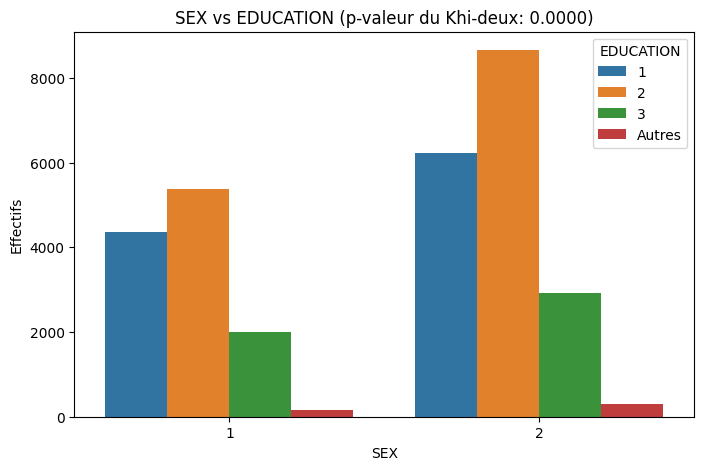

Relation significative entre SEX et EDUCATION (p = 0.0000) -> Variables associées


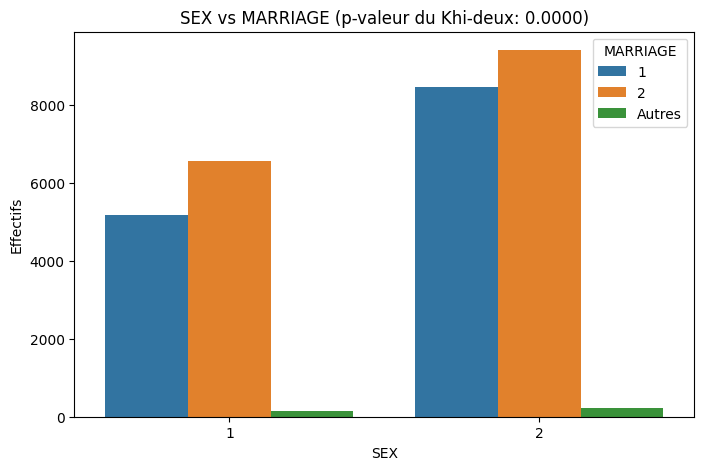

Relation significative entre SEX et MARRIAGE (p = 0.0000) -> Variables associées


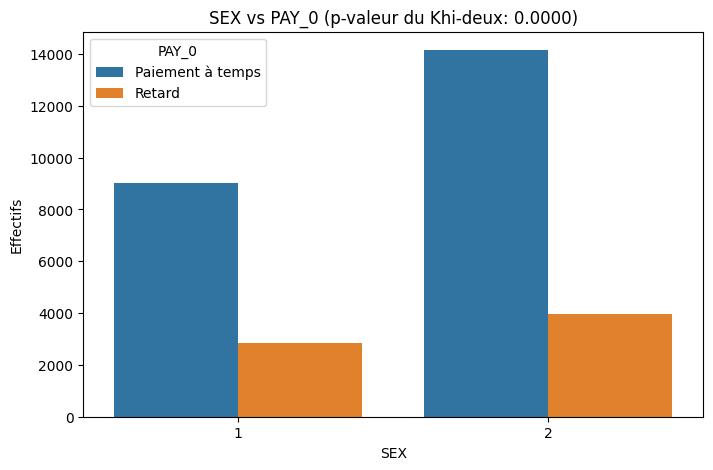

Relation significative entre SEX et PAY_0 (p = 0.0000) -> Variables associées


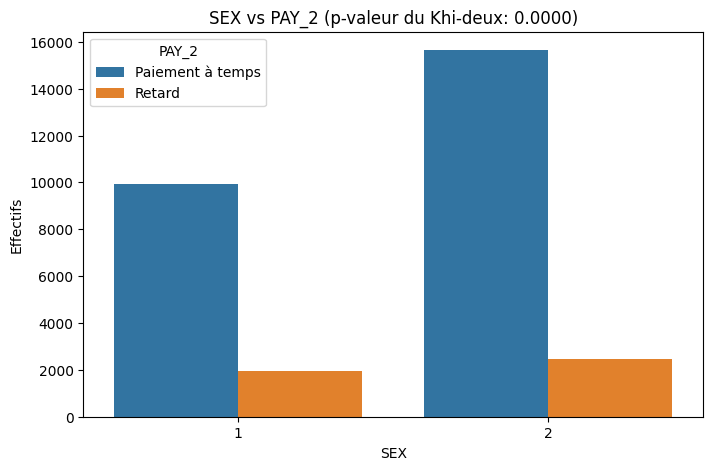

Relation significative entre SEX et PAY_2 (p = 0.0000) -> Variables associées


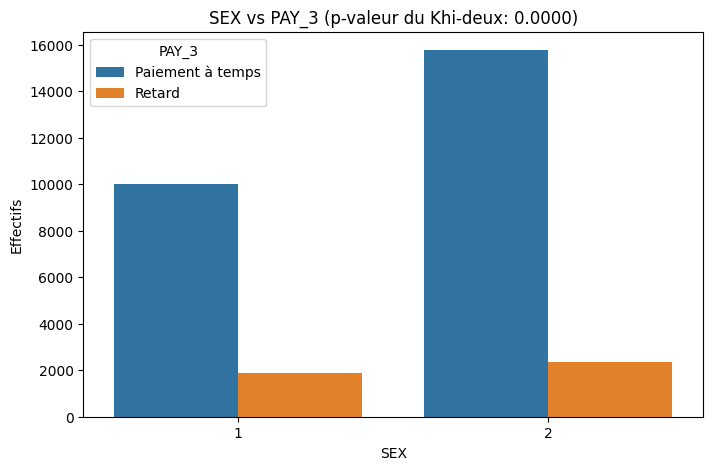

Relation significative entre SEX et PAY_3 (p = 0.0000) -> Variables associées


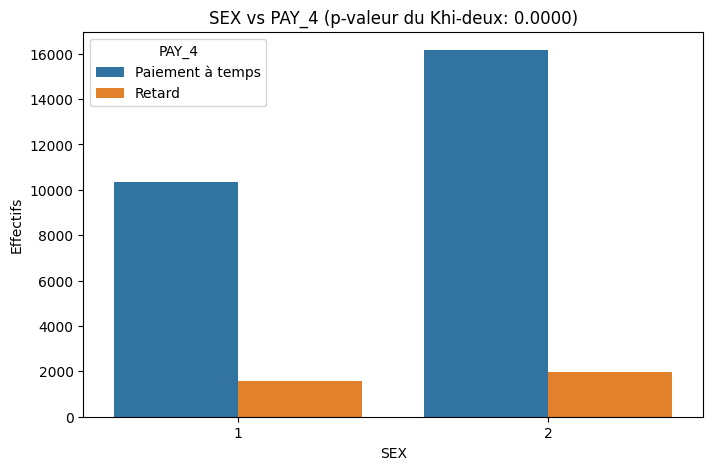

Relation significative entre SEX et PAY_4 (p = 0.0000) -> Variables associées


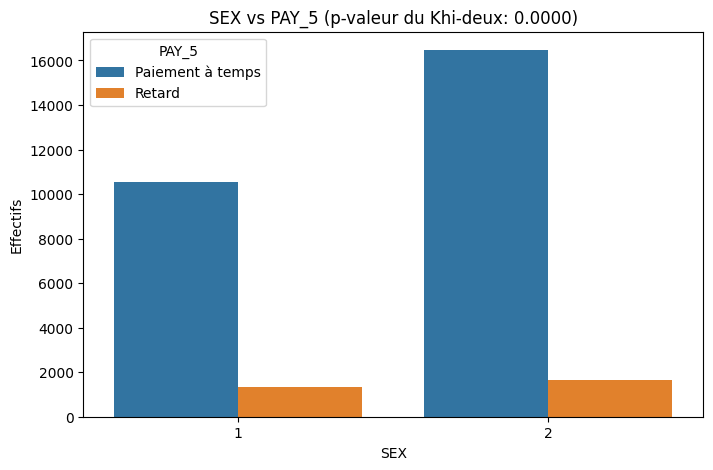

Relation significative entre SEX et PAY_5 (p = 0.0000) -> Variables associées


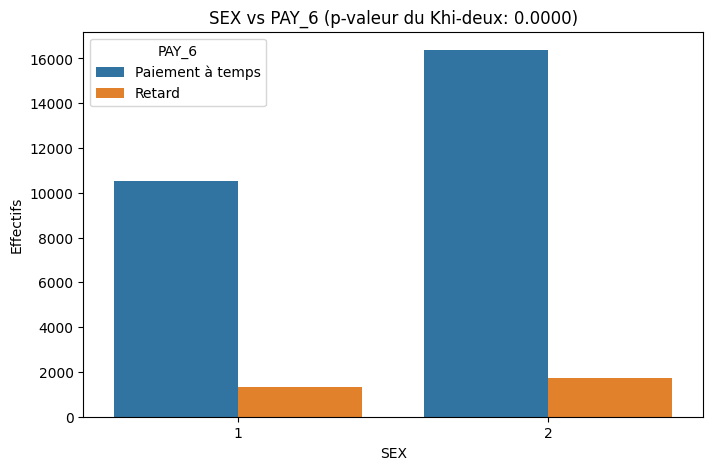

Relation significative entre SEX et PAY_6 (p = 0.0000) -> Variables associées


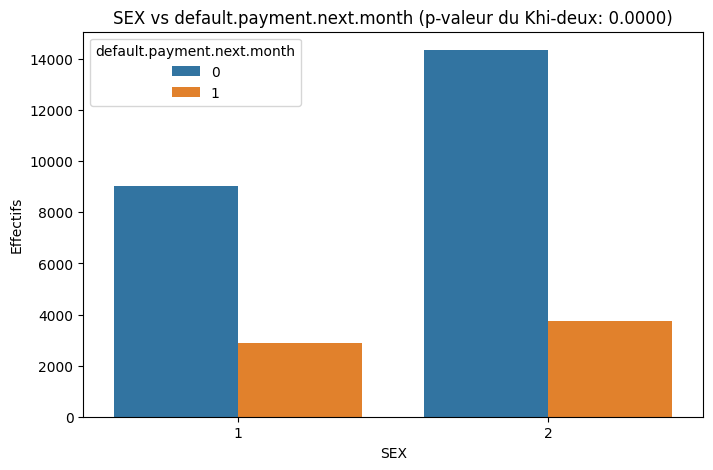

Relation significative entre SEX et default.payment.next.month (p = 0.0000) -> Variables associées


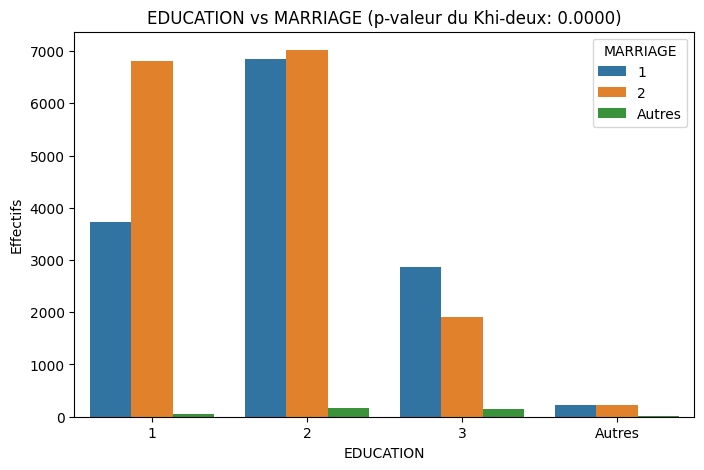

Relation significative entre EDUCATION et MARRIAGE (p = 0.0000) -> Variables associées


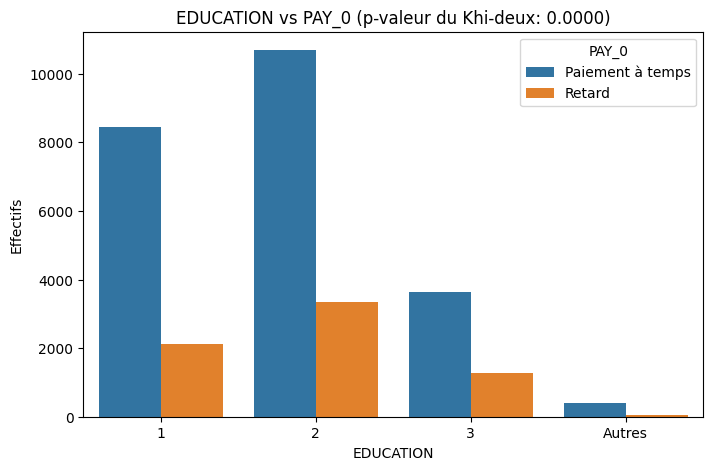

Relation significative entre EDUCATION et PAY_0 (p = 0.0000) -> Variables associées


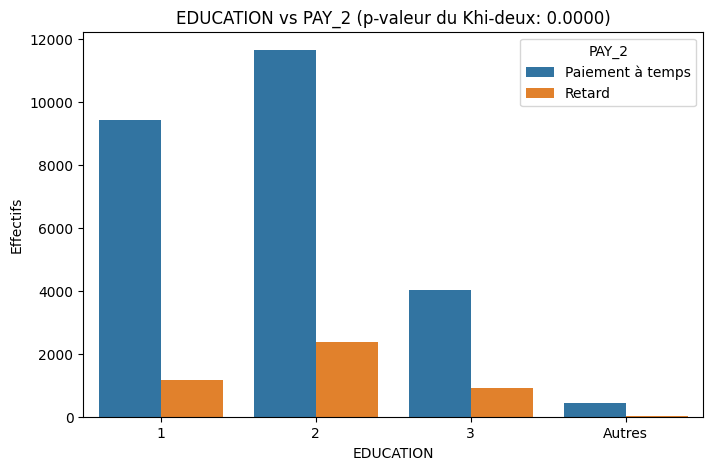

Relation significative entre EDUCATION et PAY_2 (p = 0.0000) -> Variables associées


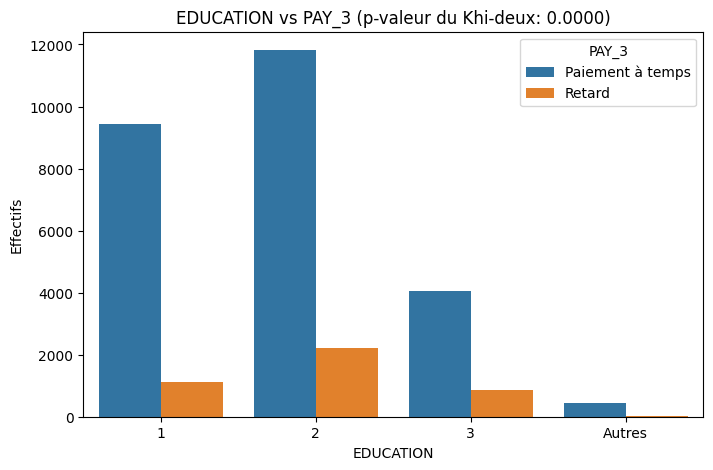

Relation significative entre EDUCATION et PAY_3 (p = 0.0000) -> Variables associées


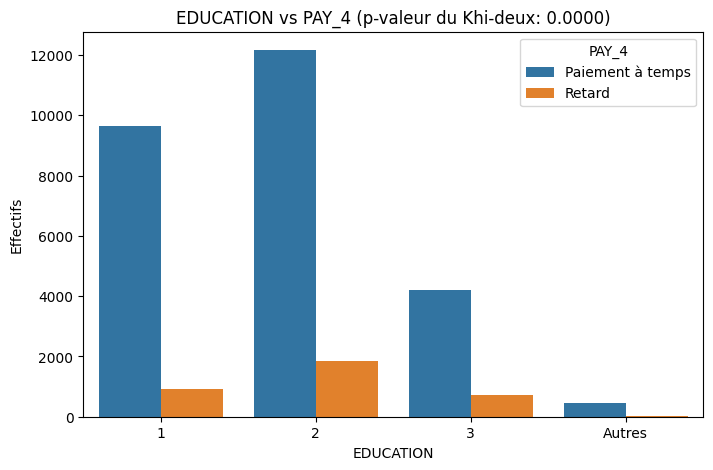

Relation significative entre EDUCATION et PAY_4 (p = 0.0000) -> Variables associées


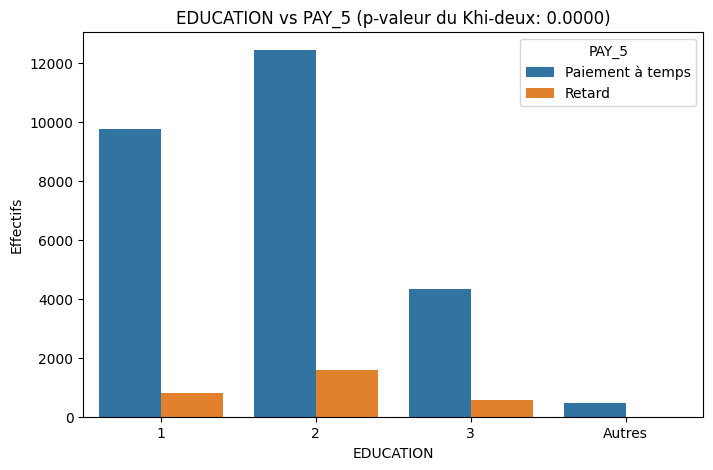

Relation significative entre EDUCATION et PAY_5 (p = 0.0000) -> Variables associées


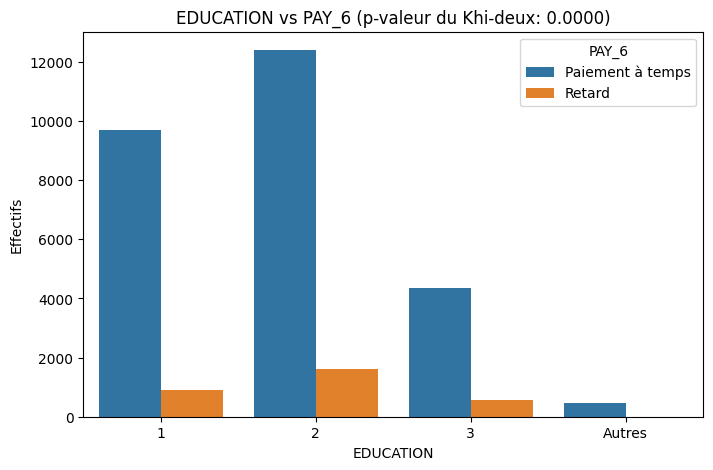

Relation significative entre EDUCATION et PAY_6 (p = 0.0000) -> Variables associées


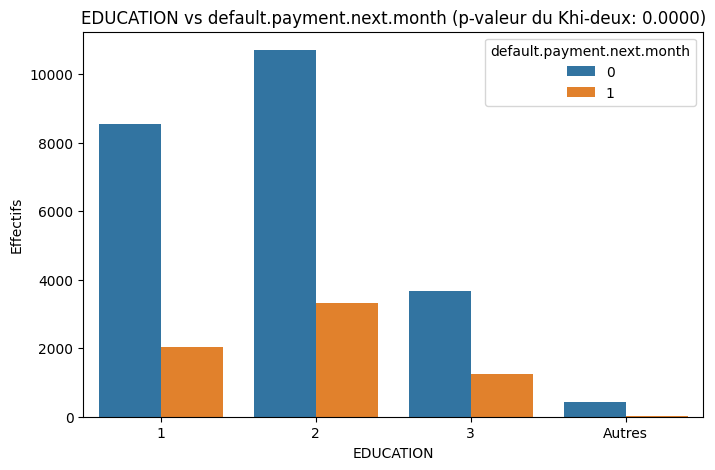

Relation significative entre EDUCATION et default.payment.next.month (p = 0.0000) -> Variables associées


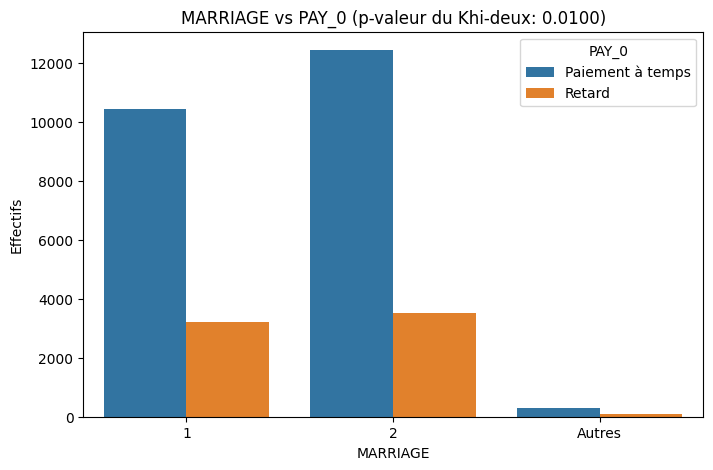

Relation significative entre MARRIAGE et PAY_0 (p = 0.0100) -> Variables associées


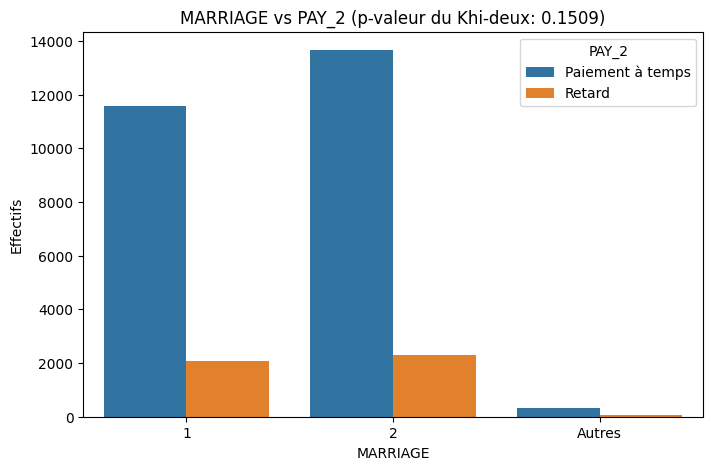

Pas de relation significative entre MARRIAGE et PAY_2 (p = 0.1509) -> Variables indépendantes


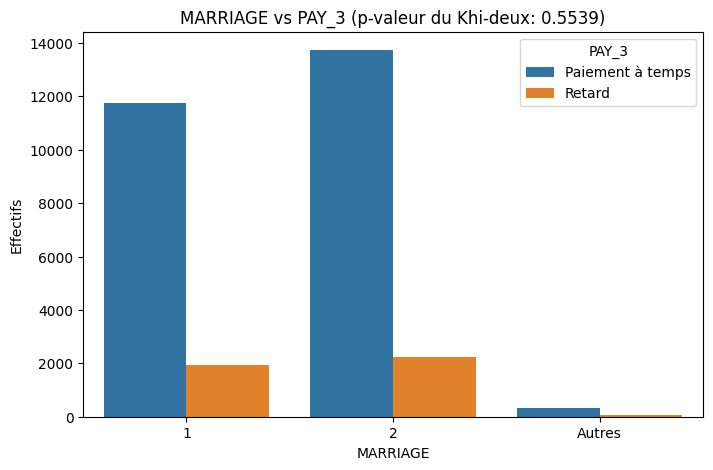

Pas de relation significative entre MARRIAGE et PAY_3 (p = 0.5539) -> Variables indépendantes


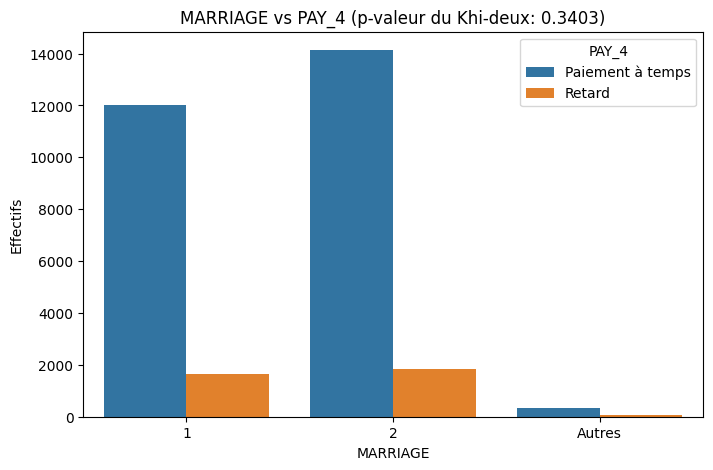

Pas de relation significative entre MARRIAGE et PAY_4 (p = 0.3403) -> Variables indépendantes


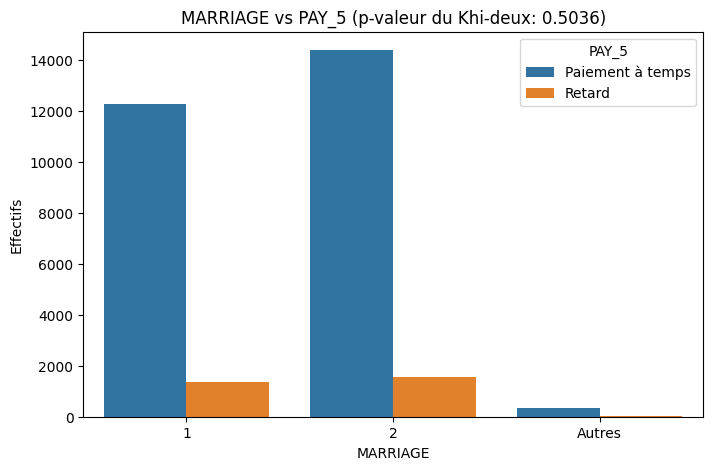

Pas de relation significative entre MARRIAGE et PAY_5 (p = 0.5036) -> Variables indépendantes


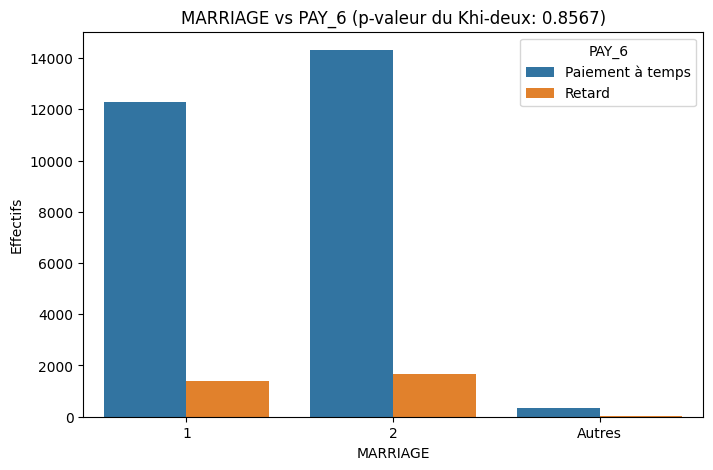

Pas de relation significative entre MARRIAGE et PAY_6 (p = 0.8567) -> Variables indépendantes


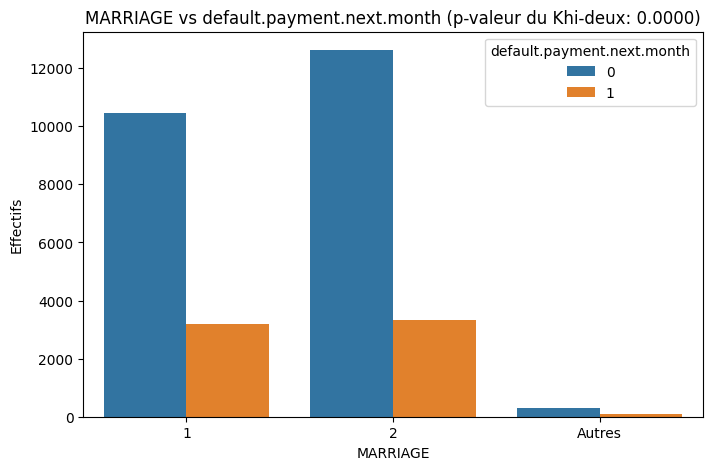

Relation significative entre MARRIAGE et default.payment.next.month (p = 0.0000) -> Variables associées


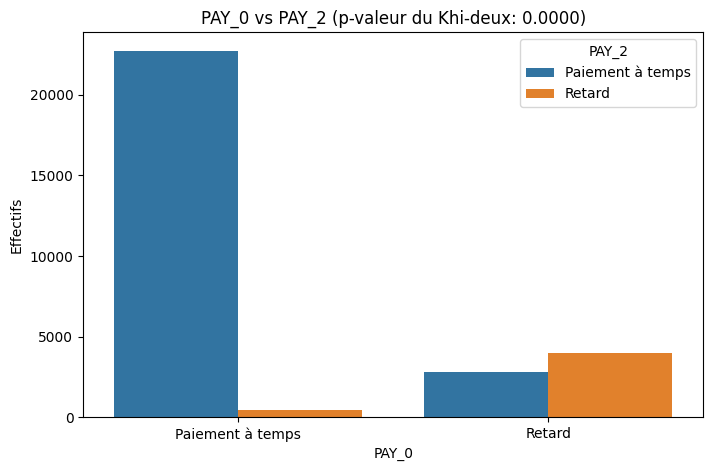

Relation significative entre PAY_0 et PAY_2 (p = 0.0000) -> Variables associées


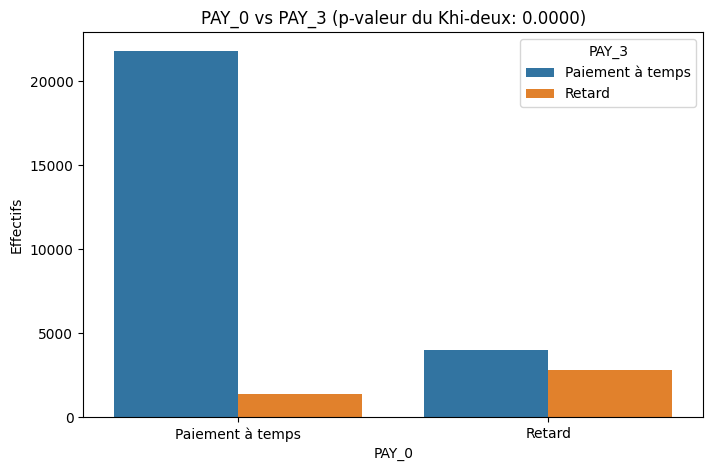

Relation significative entre PAY_0 et PAY_3 (p = 0.0000) -> Variables associées


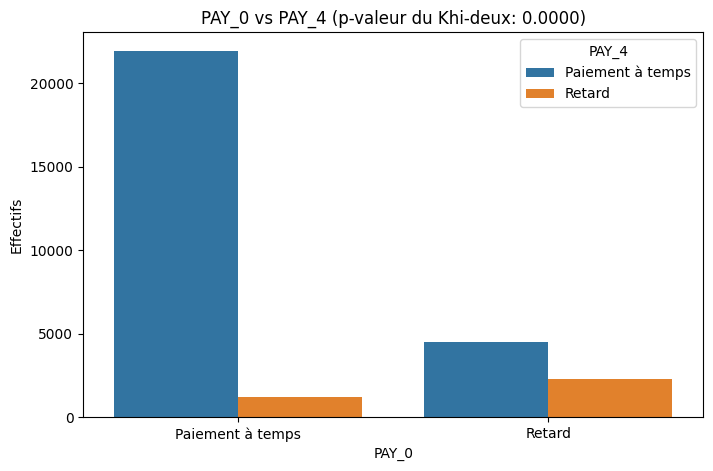

Relation significative entre PAY_0 et PAY_4 (p = 0.0000) -> Variables associées


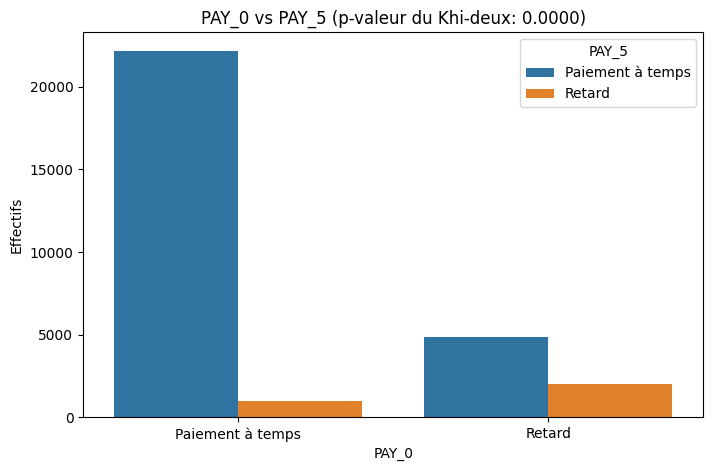

Relation significative entre PAY_0 et PAY_5 (p = 0.0000) -> Variables associées


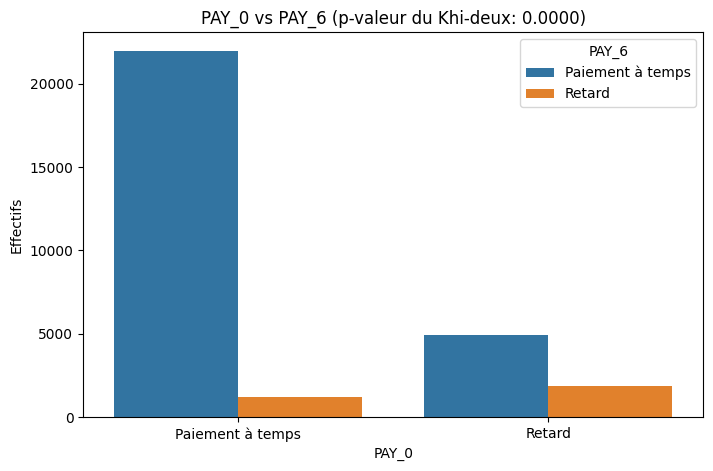

Relation significative entre PAY_0 et PAY_6 (p = 0.0000) -> Variables associées


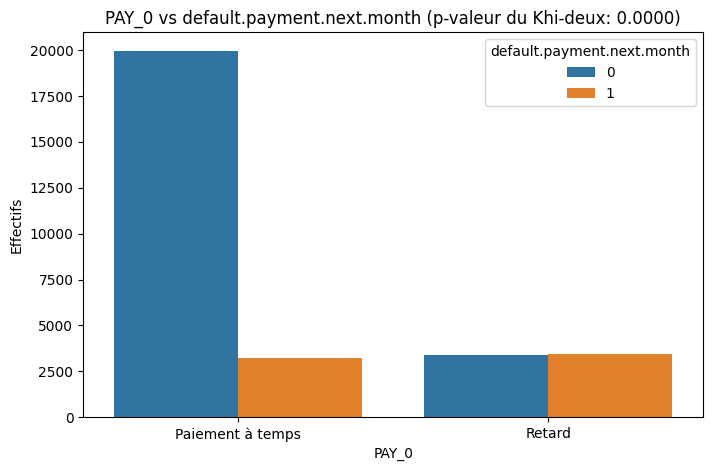

Relation significative entre PAY_0 et default.payment.next.month (p = 0.0000) -> Variables associées


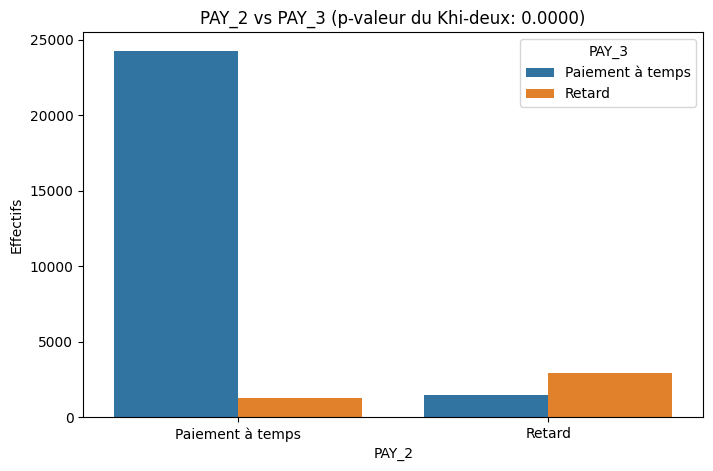

Relation significative entre PAY_2 et PAY_3 (p = 0.0000) -> Variables associées


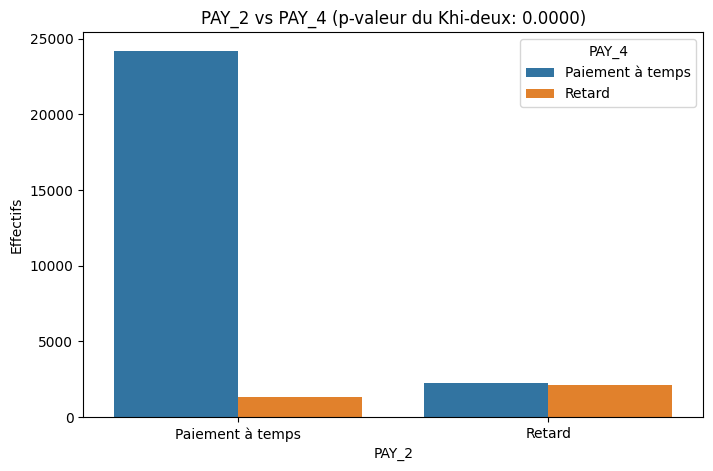

Relation significative entre PAY_2 et PAY_4 (p = 0.0000) -> Variables associées


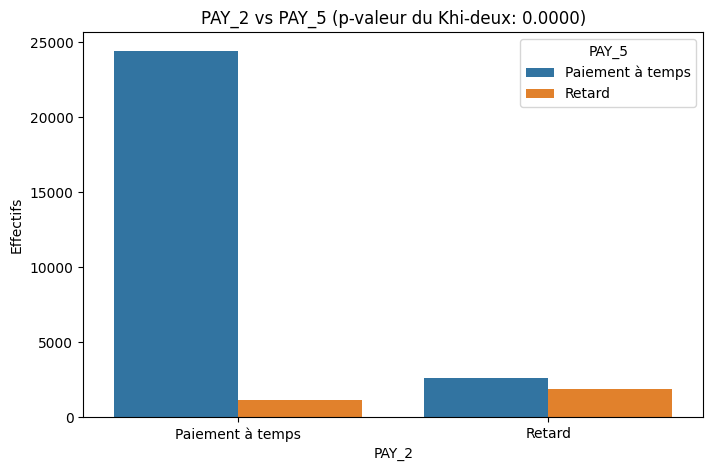

Relation significative entre PAY_2 et PAY_5 (p = 0.0000) -> Variables associées


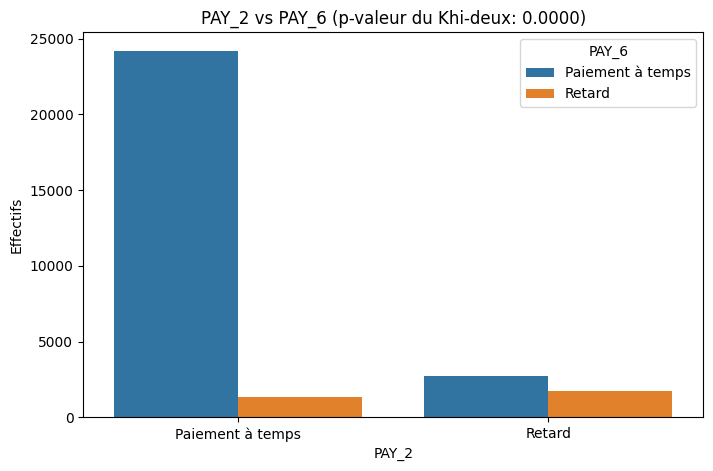

Relation significative entre PAY_2 et PAY_6 (p = 0.0000) -> Variables associées


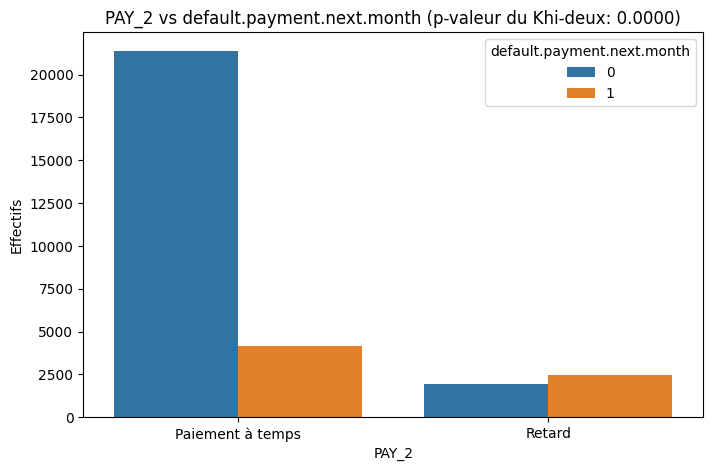

Relation significative entre PAY_2 et default.payment.next.month (p = 0.0000) -> Variables associées


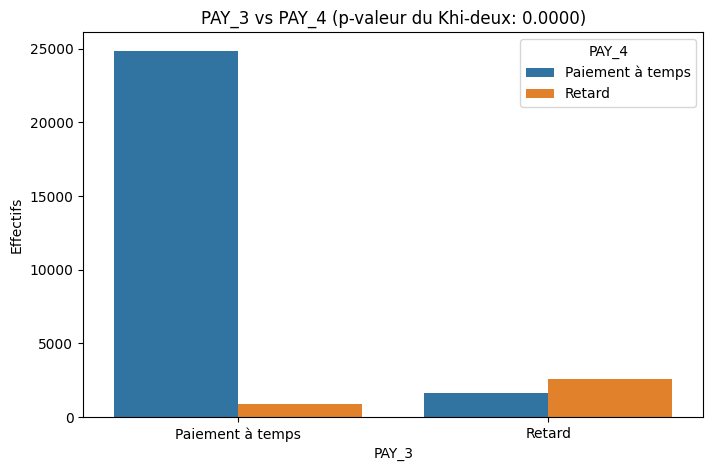

Relation significative entre PAY_3 et PAY_4 (p = 0.0000) -> Variables associées


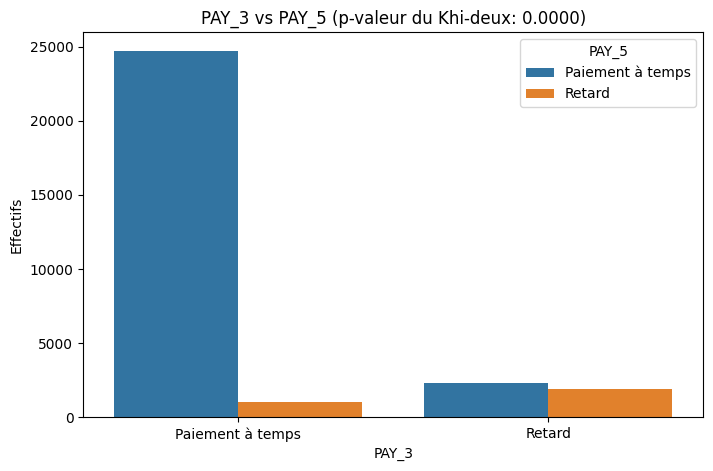

Relation significative entre PAY_3 et PAY_5 (p = 0.0000) -> Variables associées


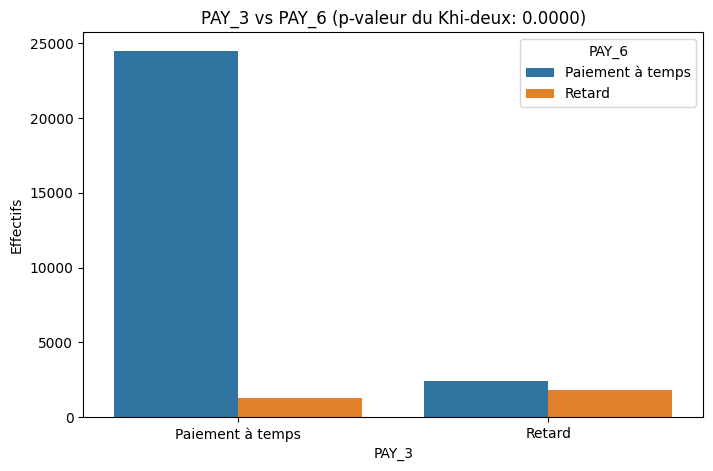

Relation significative entre PAY_3 et PAY_6 (p = 0.0000) -> Variables associées


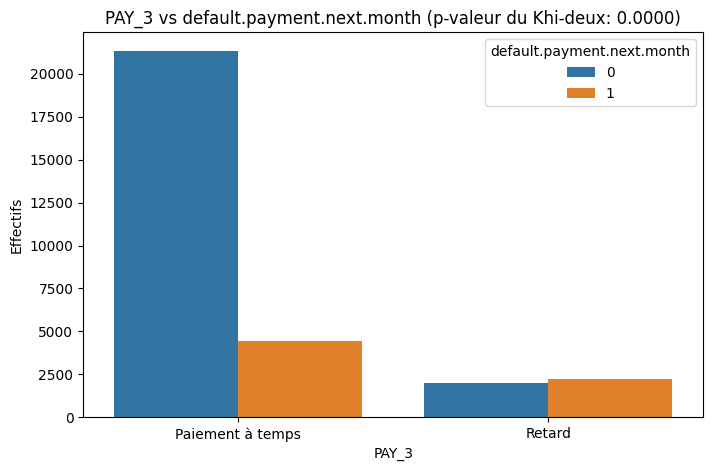

Relation significative entre PAY_3 et default.payment.next.month (p = 0.0000) -> Variables associées


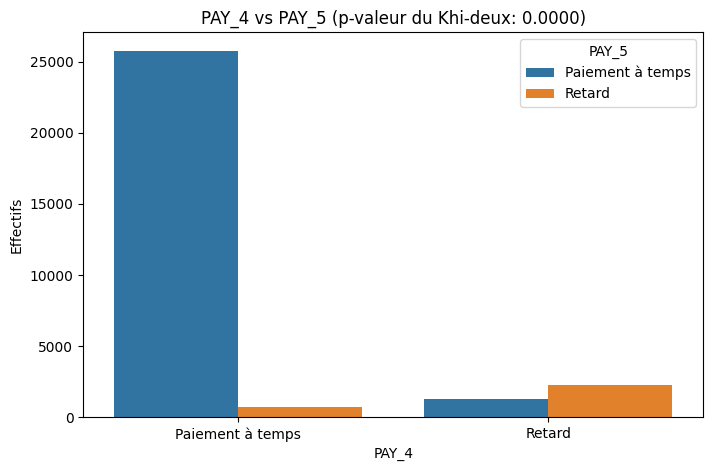

Relation significative entre PAY_4 et PAY_5 (p = 0.0000) -> Variables associées


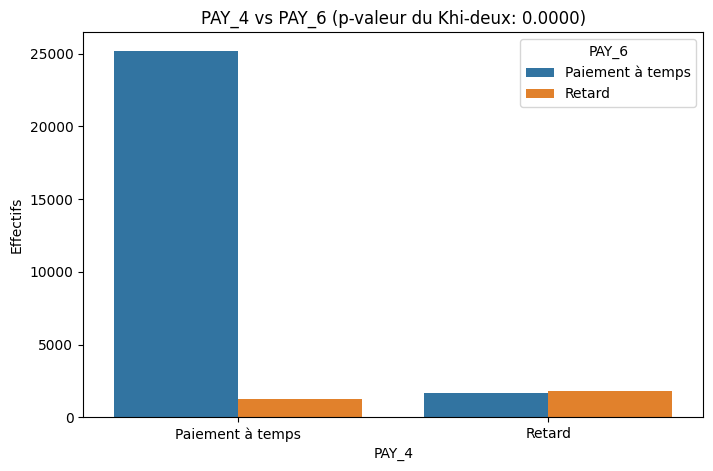

Relation significative entre PAY_4 et PAY_6 (p = 0.0000) -> Variables associées


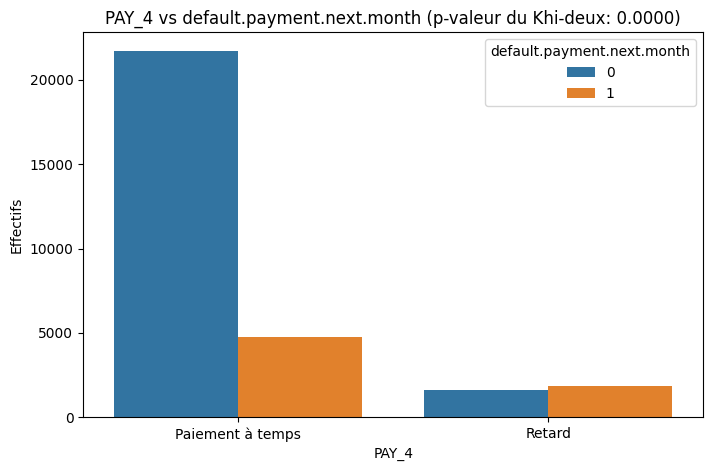

Relation significative entre PAY_4 et default.payment.next.month (p = 0.0000) -> Variables associées


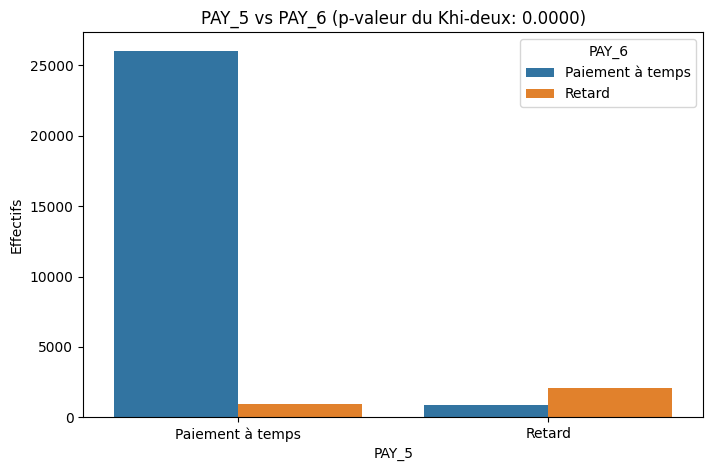

Relation significative entre PAY_5 et PAY_6 (p = 0.0000) -> Variables associées


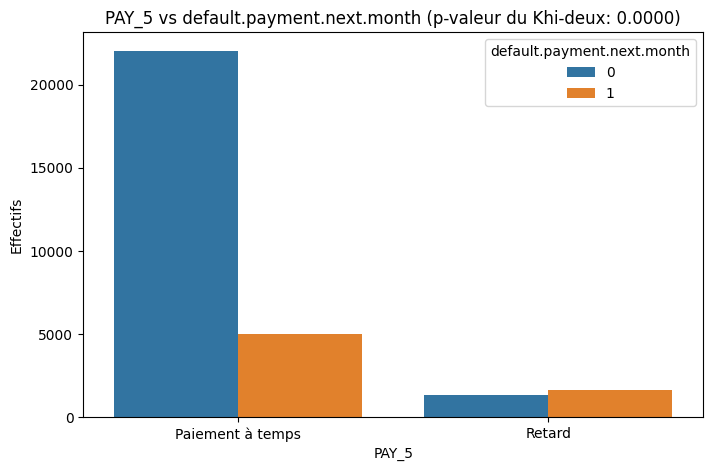

Relation significative entre PAY_5 et default.payment.next.month (p = 0.0000) -> Variables associées


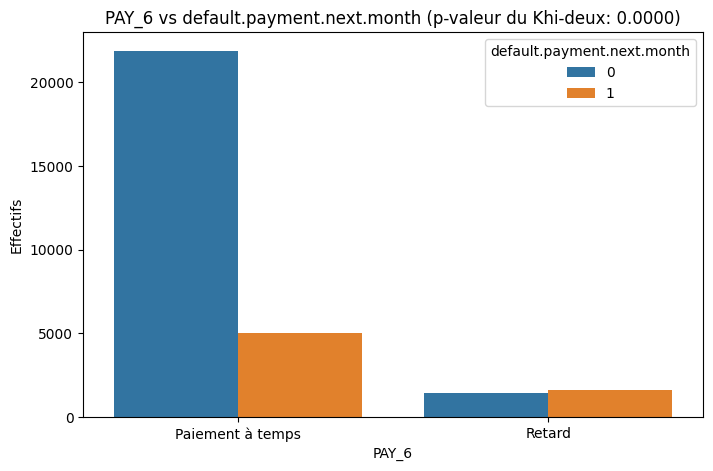

Relation significative entre PAY_6 et default.payment.next.month (p = 0.0000) -> Variables associées


In [7]:

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency
from itertools import combinations


## 2. Définition des fonctions

# Fonction pour calculer le V de Cramer
def cramers_v(conf_matrix):
    """Calcule le V de Cramer à partir d'une matrice de contingence."""
    chi2 = chi2_contingency(conf_matrix)[0]
    n = conf_matrix.sum().sum()
    k = min(conf_matrix.shape) - 1
    return np.sqrt(chi2 / (n * k))

# Fonction pour calculer le T de Tschuprow
def tschuprow_t(conf_matrix):
    """Calcule le T de Tschuprow à partir d'une matrice de contingence."""
    chi2 = chi2_contingency(conf_matrix)[0]
    n = conf_matrix.sum().sum()
    r, c = conf_matrix.shape
    return np.sqrt(chi2 / (n * np.sqrt((r - 1) * (c - 1))))


## 3. Création des heatmaps de corrélation

def categorical_correlation_heatmaps(df, categorical_columns):
    """
    Crée deux heatmaps de corrélation pour les variables catégorielles :
    - Une utilisant le V de Cramer
    - Une utilisant le T de Tschuprow
    """
    n = len(categorical_columns)
    cramers_v_matrix = np.zeros((n, n))
    tschuprow_t_matrix = np.zeros((n, n))

    for i, var1 in enumerate(categorical_columns):
        for j, var2 in enumerate(categorical_columns):
            if i >= j:
                continue
            contingency_table = pd.crosstab(df[var1], df[var2])
            cramers_v_matrix[i, j] = cramers_v(contingency_table)
            tschuprow_t_matrix[i, j] = tschuprow_t(contingency_table)

    # Convertir en DataFrame pour affichage
    cramers_df = pd.DataFrame(cramers_v_matrix, index=categorical_columns, columns=categorical_columns)
    tschuprow_df = pd.DataFrame(tschuprow_t_matrix, index=categorical_columns, columns=categorical_columns)

    plt.figure(figsize=(10, 8))
    sns.heatmap(cramers_df, annot=True, cmap="coolwarm", fmt=".2f")
    plt.title("Matrice de Corrélation des Variables Catégorielles (V de Cramer)")
    plt.show()

    plt.figure(figsize=(10, 8))
    sns.heatmap(tschuprow_df, annot=True, cmap="coolwarm", fmt=".2f")
    plt.title("Matrice de Corrélation des Variables Catégorielles (T de Tschuprow)")
    plt.show()


## 4. Génération des barplots et test du Khi-deux

def plot_categorical_relationships(df, categorical_columns):
    """
    Génère des barplots pour toutes les paires de variables catégorielles et réalise un test du Khi-deux.
    """
    for var1, var2 in combinations(categorical_columns, 2):
        contingency_table = pd.crosstab(df[var1], df[var2])
        chi2, p, dof, expected = chi2_contingency(contingency_table)

        plt.figure(figsize=(8, 5))
        sns.countplot(x=var1, hue=var2, data=df)
        plt.title(f"{var1} vs {var2} (p-valeur du Khi-deux: {p:.4f})")
        plt.xlabel(var1)
        plt.ylabel("Effectifs")
        plt.legend(title=var2)
        plt.show()

        if p < 0.05:
            print(f"Relation significative entre {var1} et {var2} (p = {p:.4f}) -> Variables associées")
        else:
            print(f"Pas de relation significative entre {var1} et {var2} (p = {p:.4f}) -> Variables indépendantes")



# Liste des variables catégorielles du dataset
categorical_vars = data.select_dtypes(include=['category'])

# Affichage des barplots et tests de Khi-deux
plot_categorical_relationships(data, categorical_vars)





### Analyse de la relation entre les variables quantitatives et les variables qualitatives


L'objectif est d'évaluer la relation entre des variables qualitatives et quantitatives. Plusieurs tests statistiques sont utilisés en fonction du nombre de modalités et des conditions d'utilisation.

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import levene, ttest_ind, kruskal, shapiro
import itertools

def quali_quanti_analysis(data, target):
    """
    Génère des boxplots et applique des tests statistiques entre
    variables qualitatives et quantitatives.
    """
    # Suppression de la variable ID si présente
    if 'ID' in data.columns:
        data = data.drop(columns=['ID'])

    # Sélection des variables
    numeric_vars = data.select_dtypes(include=['number'])
    categorical_vars = data.select_dtypes(include=['category'])

    results = []

    for cat in categorical_vars.columns:
        for num in numeric_vars.columns:
            plt.figure(figsize=(8, 5))
            sns.boxplot(x=data[cat], y=data[num], palette='viridis')
            plt.title(f"Boxplot de {num} en fonction de {cat}")
            plt.xlabel(cat)
            plt.ylabel(num)
            plt.xticks(rotation=45)
            plt.show()

            # Test de normalité
            normal_test = shapiro(data[num].dropna())
            normal_pval = normal_test.pvalue

            # Test statistique adapté
            unique_vals = data[cat].nunique()
            if unique_vals == 2:
                test_stat, p_value = ttest_ind(data[num][data[cat] == data[cat].unique()[0]],
                                               data[num][data[cat] == data[cat].unique()[1]],
                                               nan_policy='omit')
                test_used = "T-test"
            elif unique_vals > 2:
                test_stat, p_value = kruskal(*[data[num][data[cat] == val] for val in data[cat].unique()])
                test_used = "Kruskal-Wallis"
            else:
                continue

            results.append([cat, num, test_used, p_value, normal_pval])

    # Tableau des résultats
    results_df = pd.DataFrame(results, columns=["Variable Catégorielle", "Variable Quantitative", "Test Utilisé", "p-valeur", "p-valeur Normalité"])
    return results_df.sort_values(by="p-valeur", ascending=True)



C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


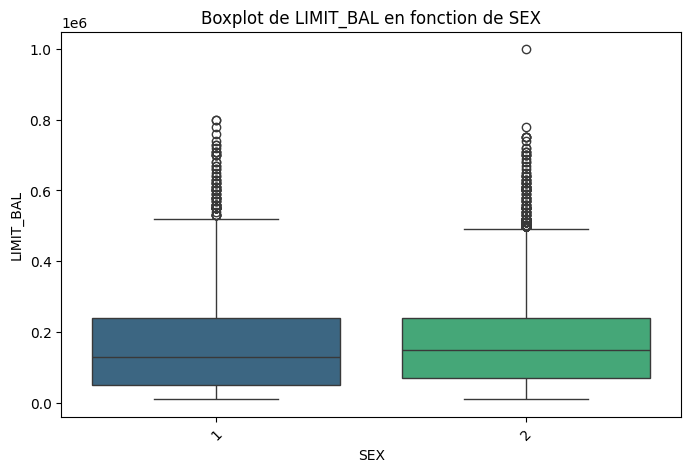

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


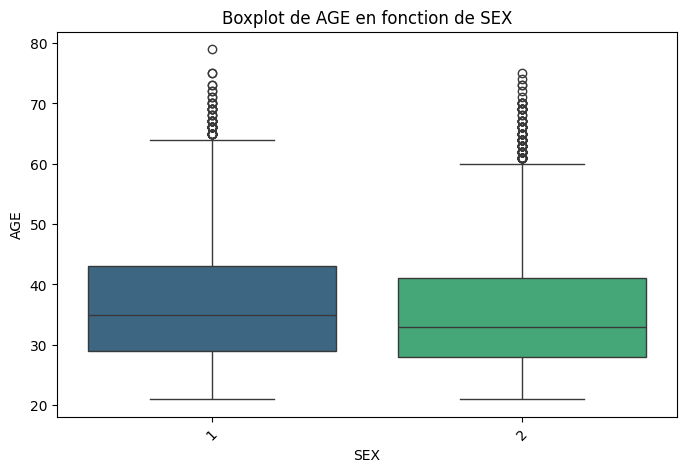

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


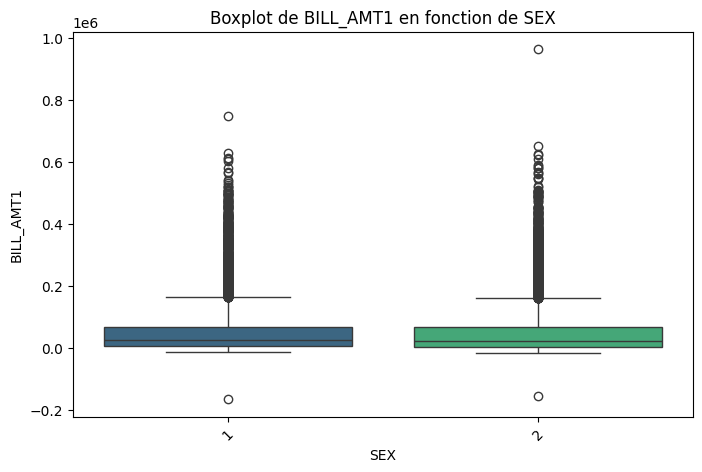

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


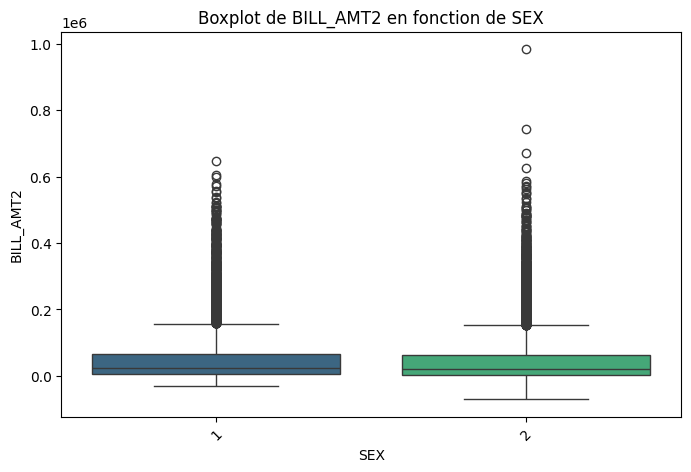

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


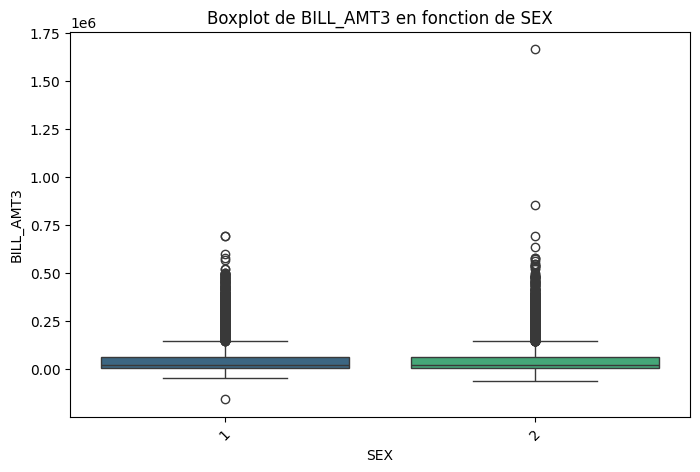

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


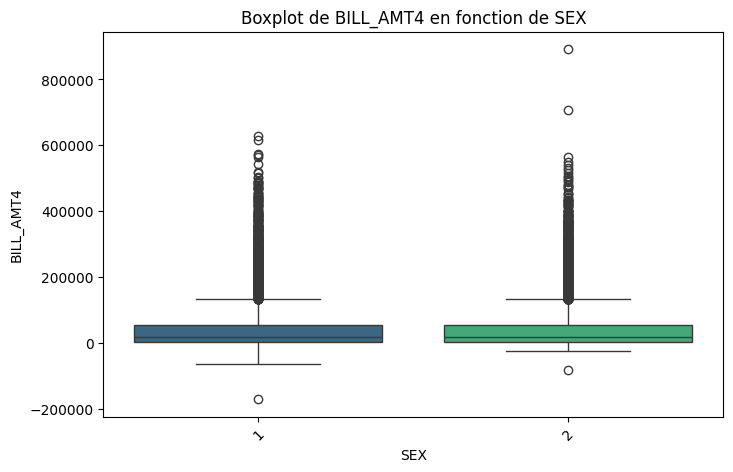

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


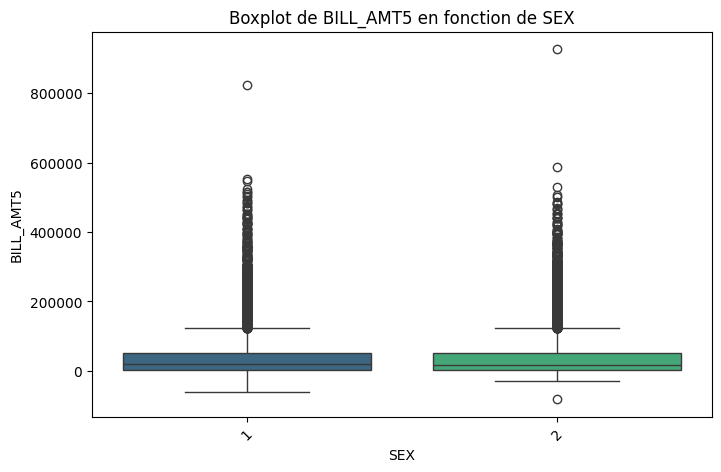

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


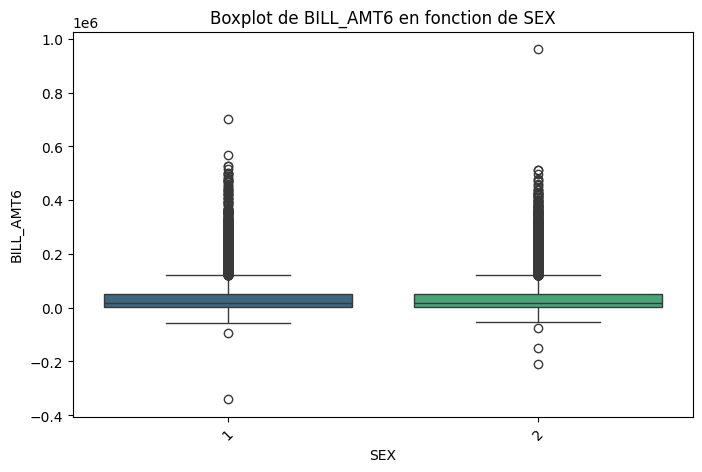

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


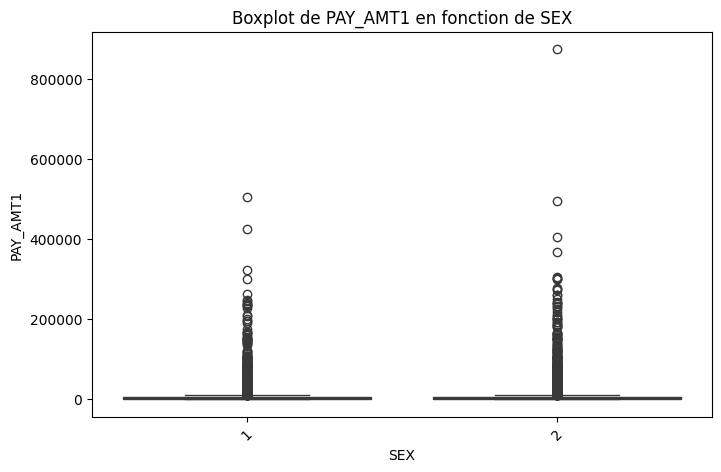

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


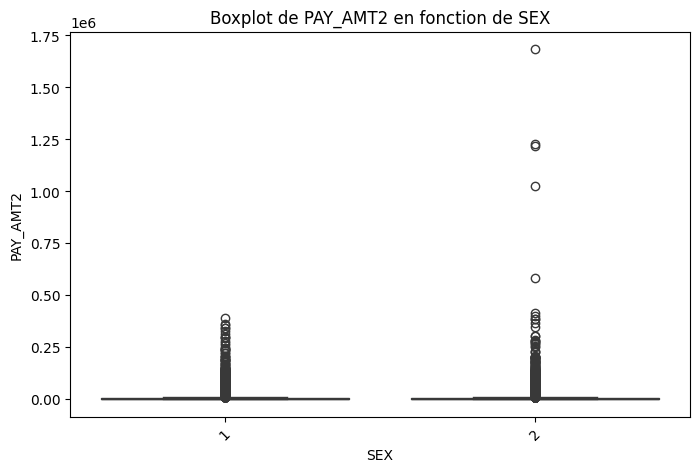

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


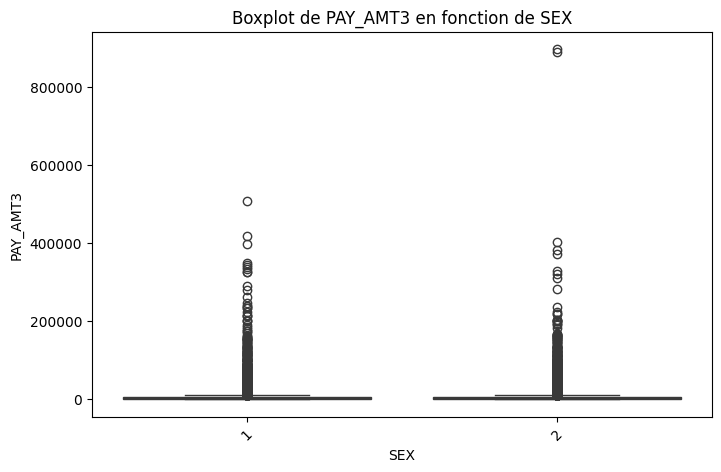

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


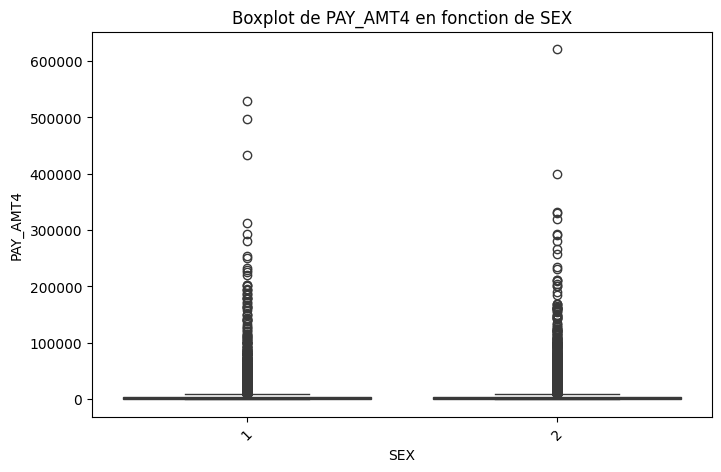

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


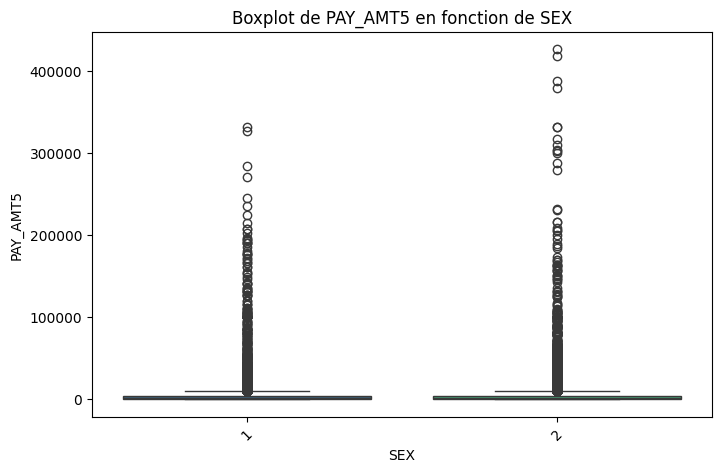

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


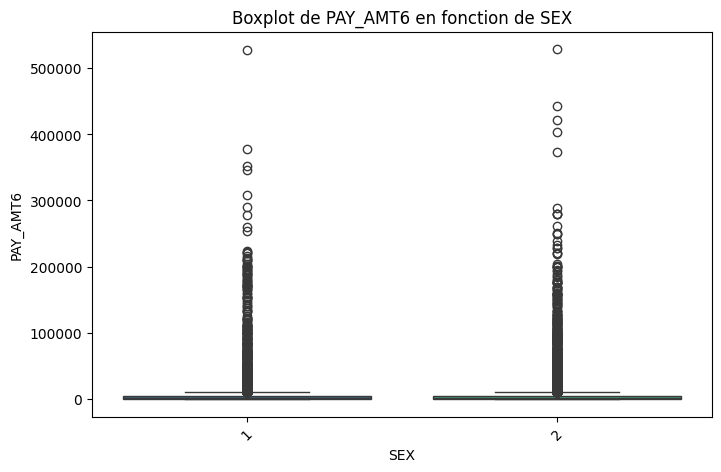

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


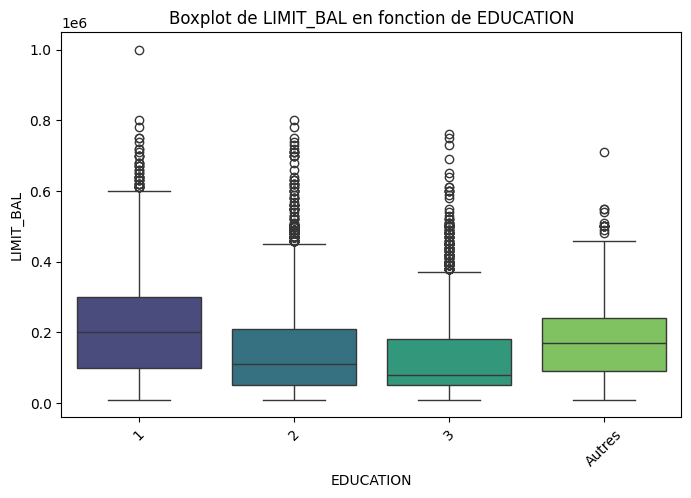

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


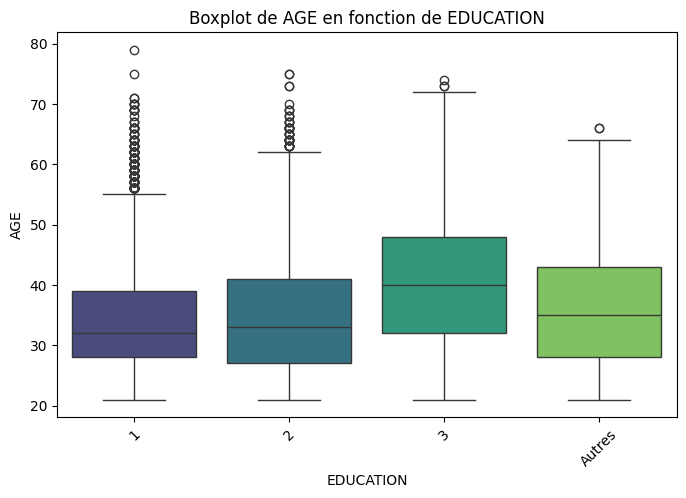

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


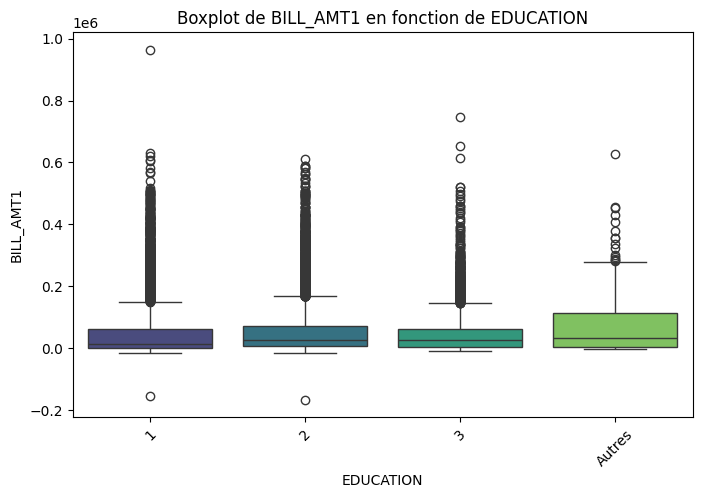

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


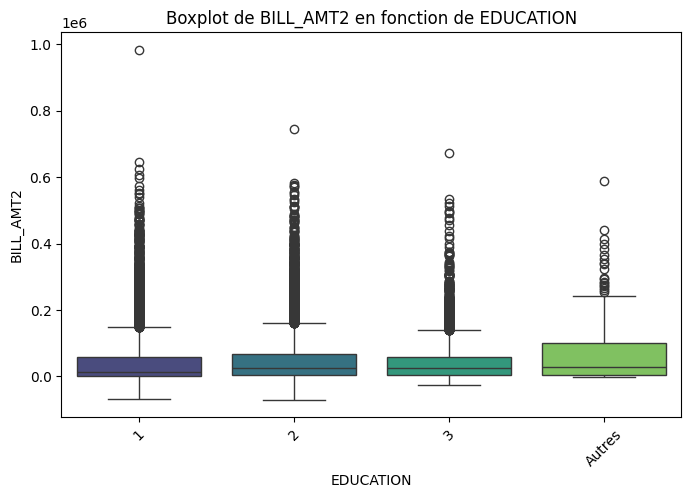

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


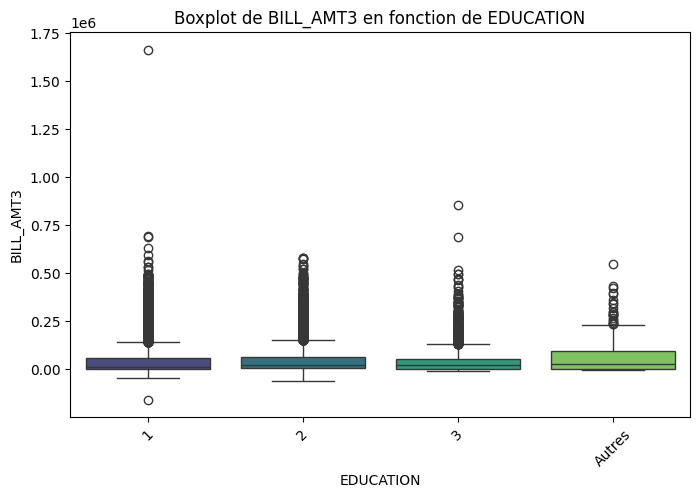

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


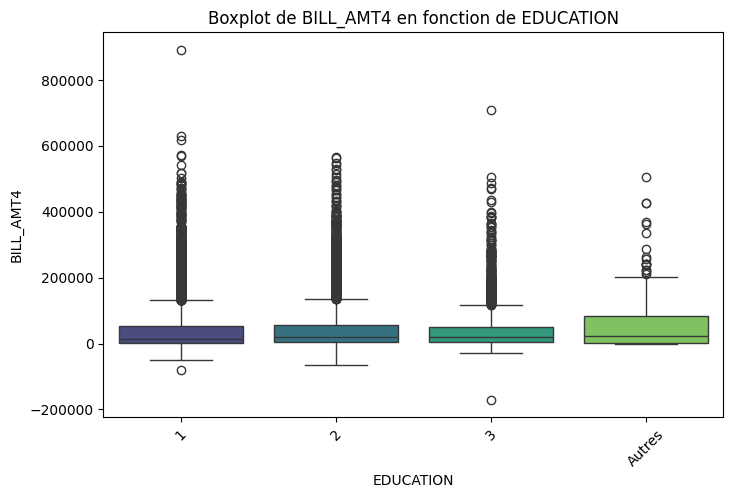

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


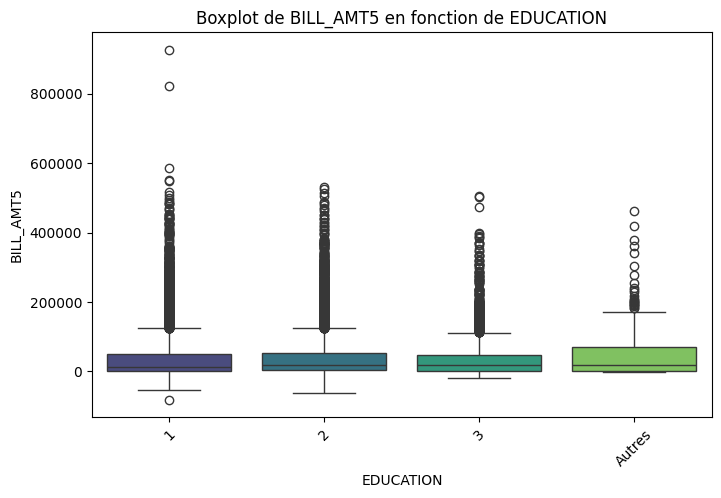

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


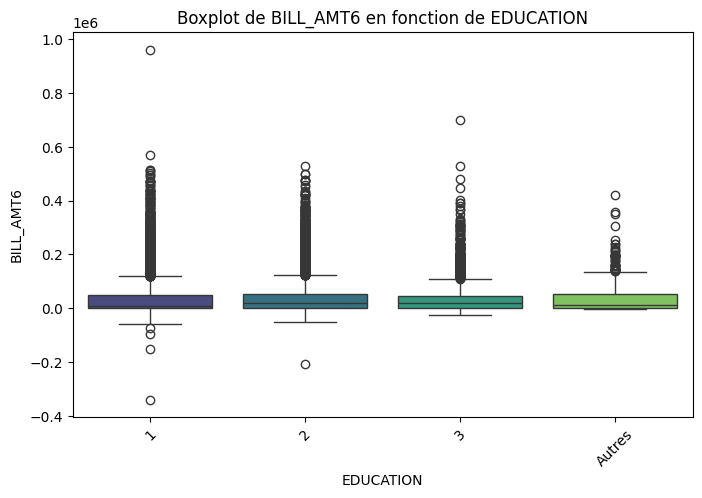

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


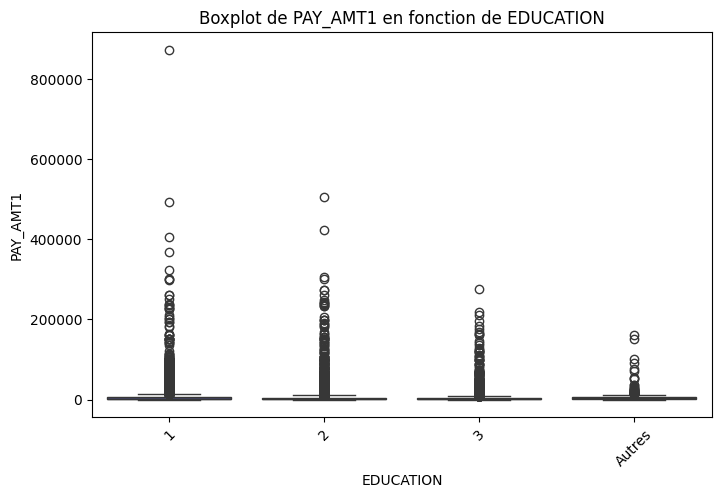

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


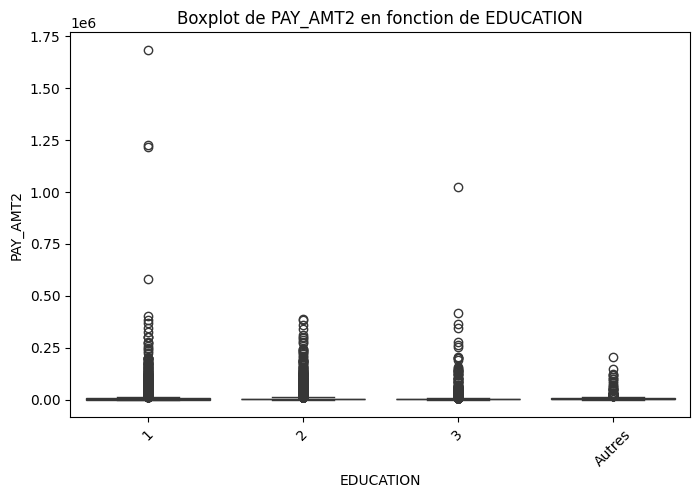

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


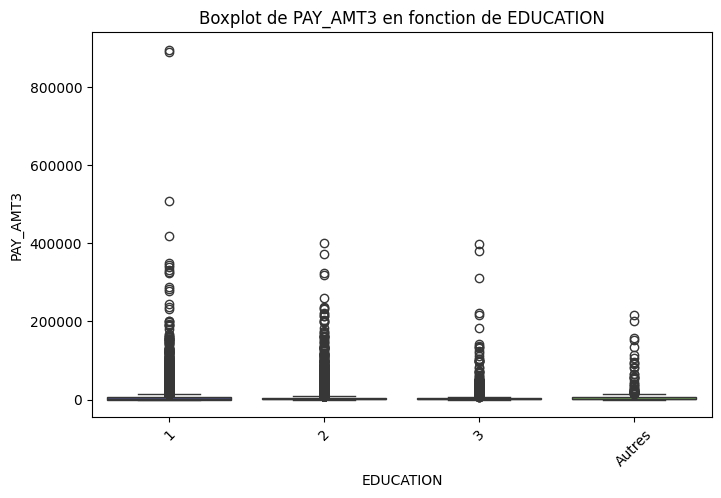

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


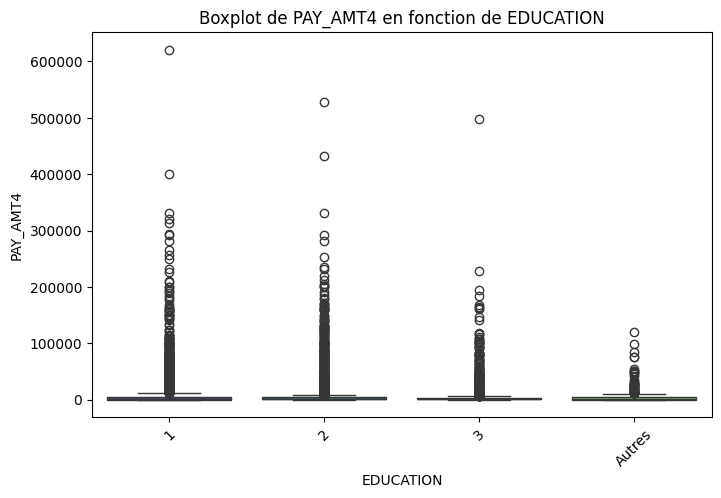

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


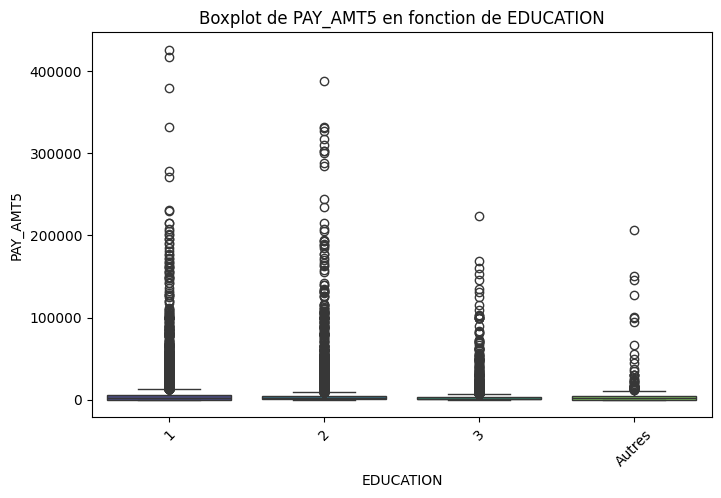

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


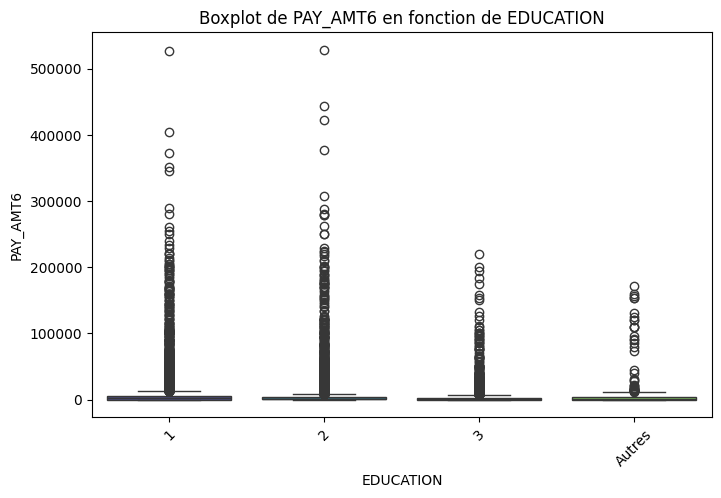

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


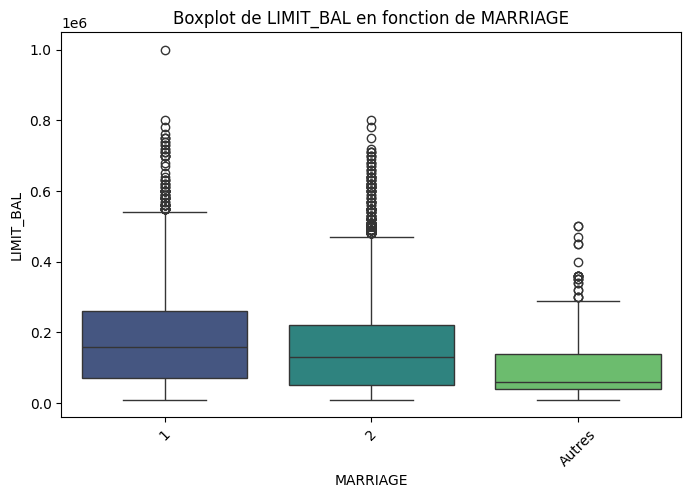

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


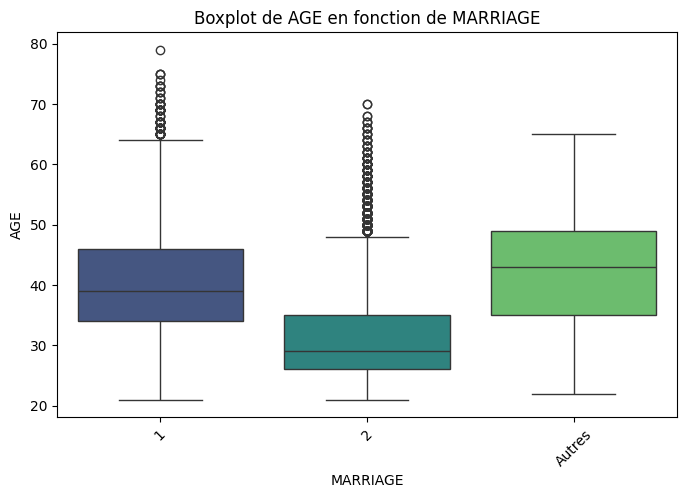

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


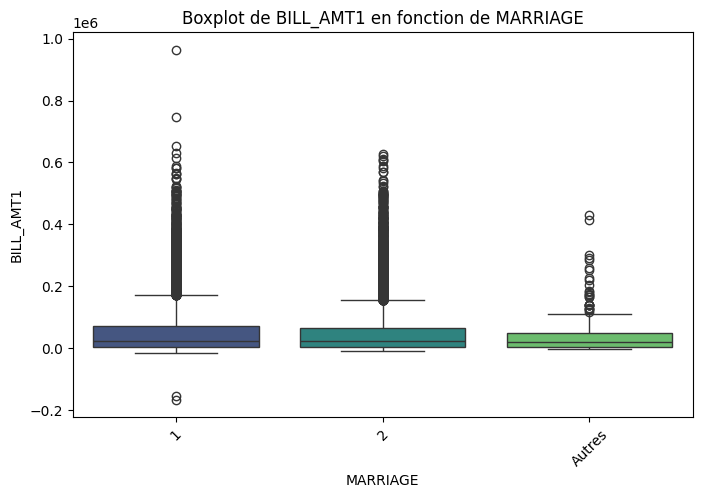

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


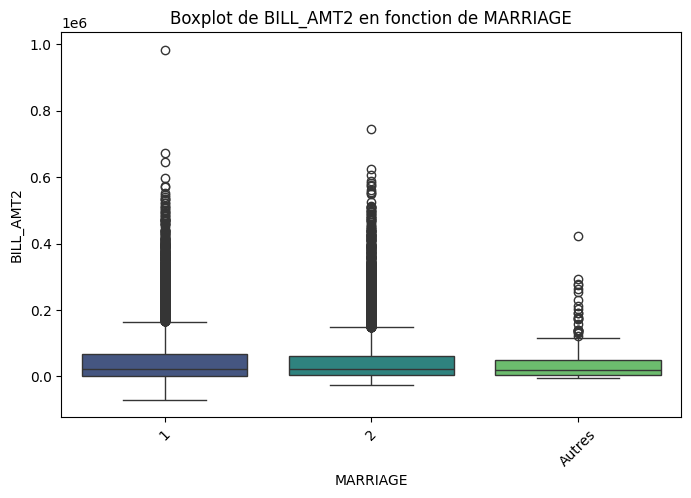

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


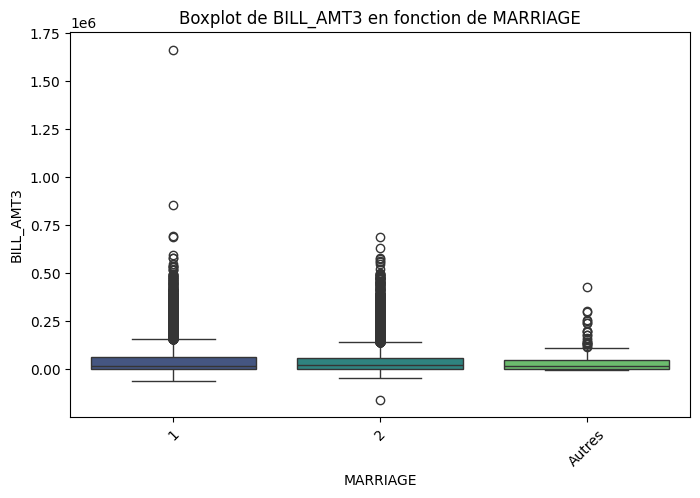

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


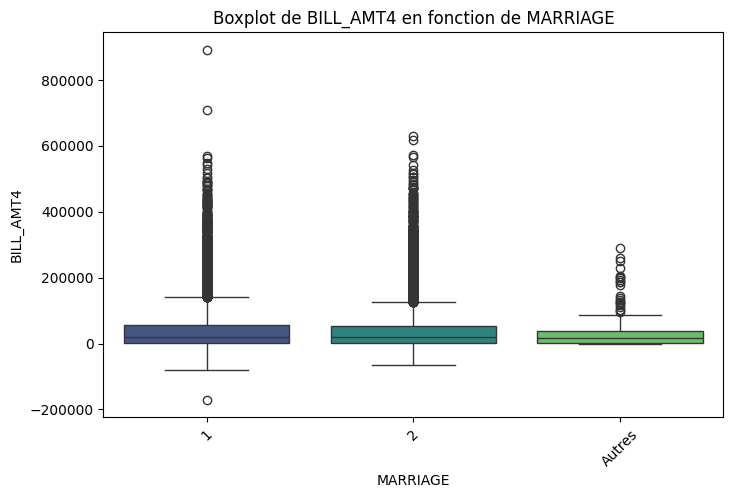

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


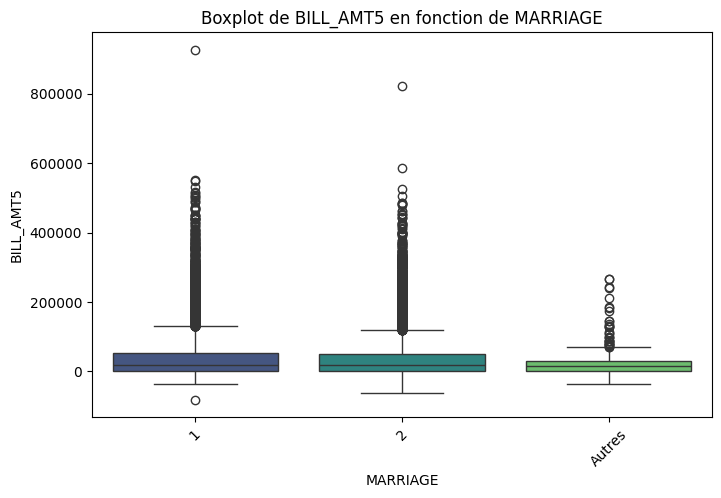

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


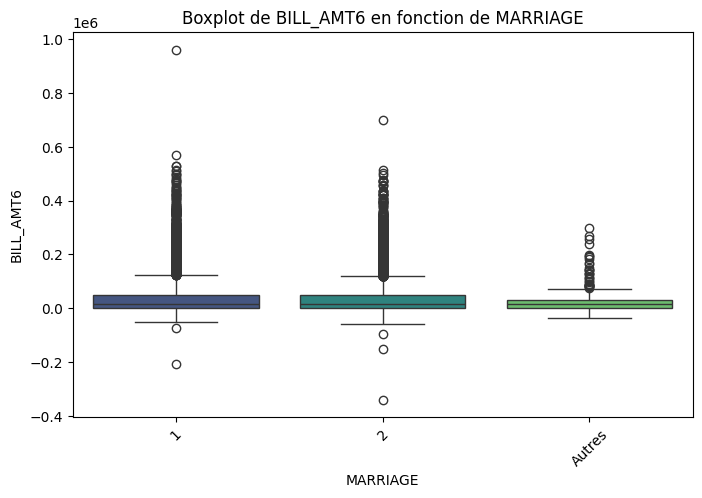

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


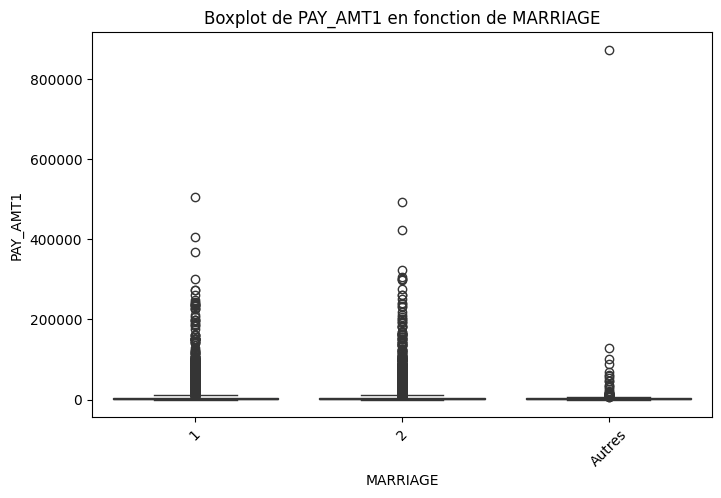

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


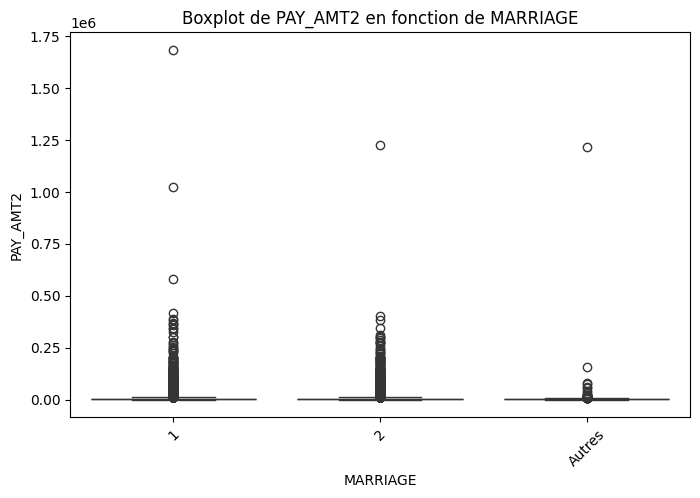

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


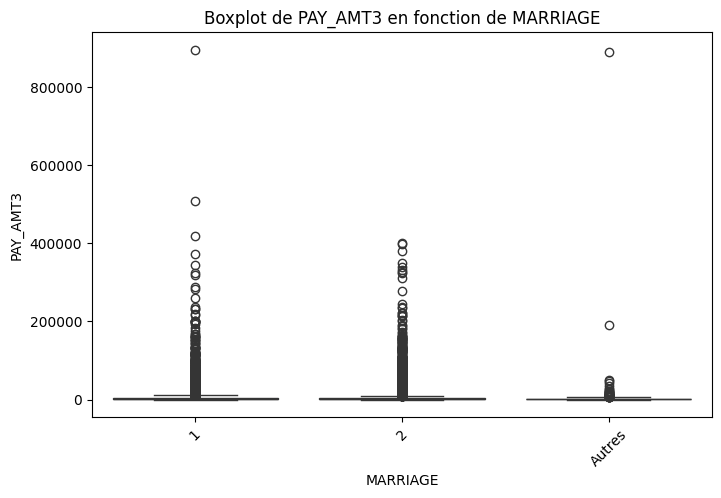

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


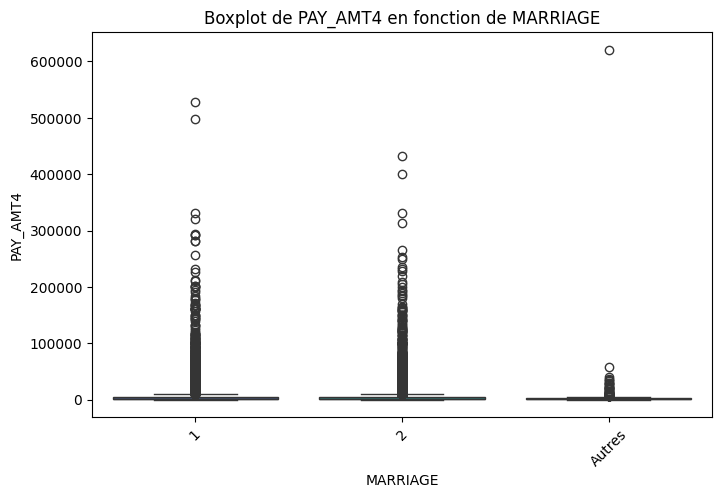

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


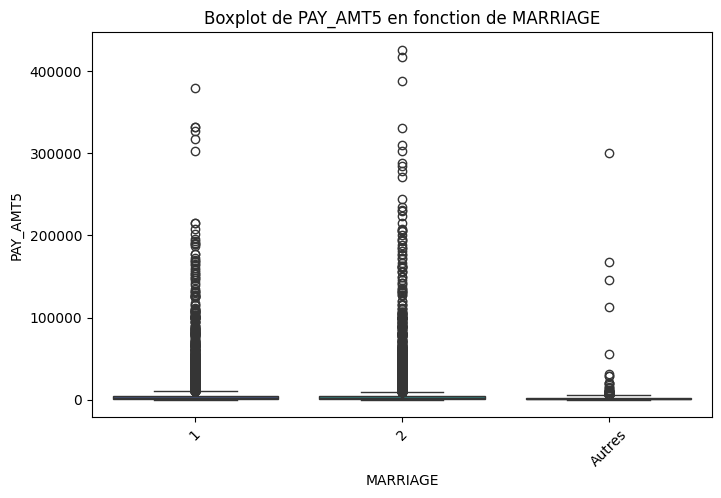

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


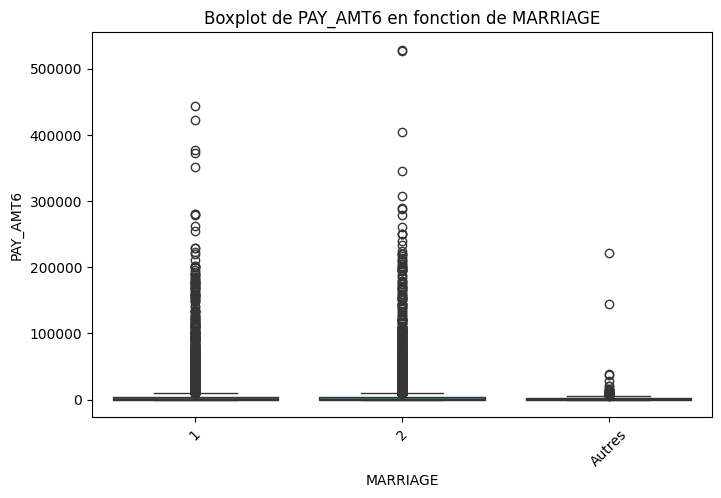

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


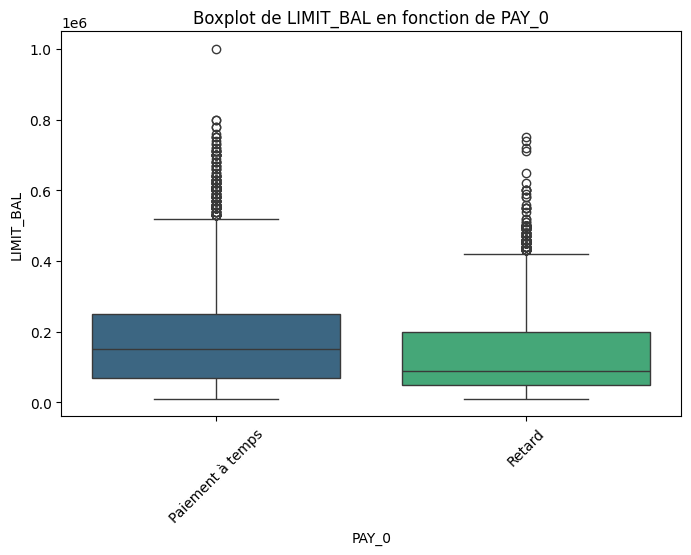

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


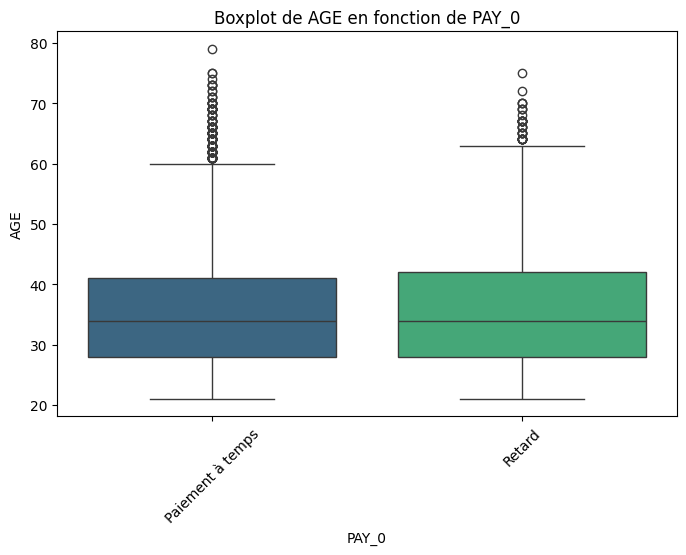

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


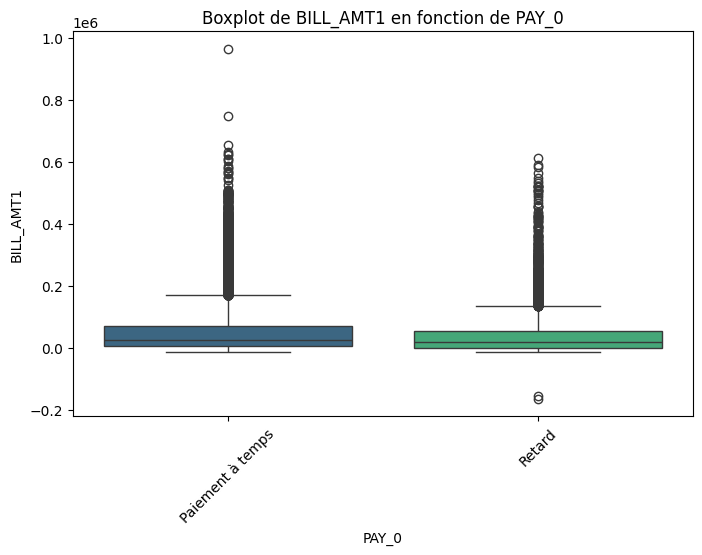

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


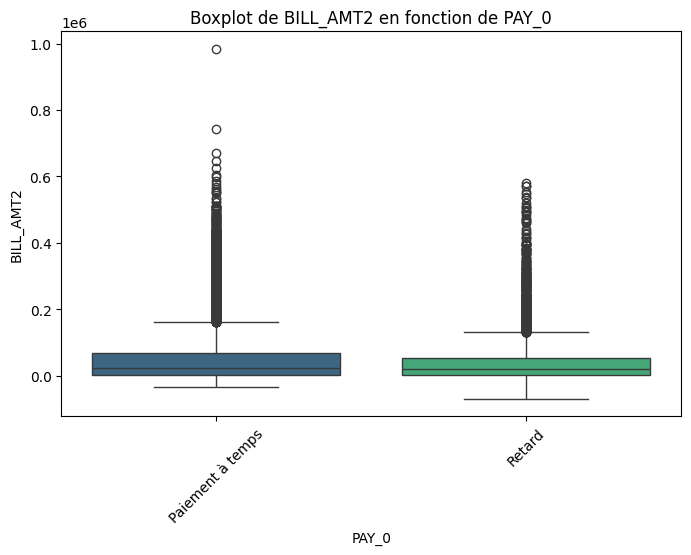

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


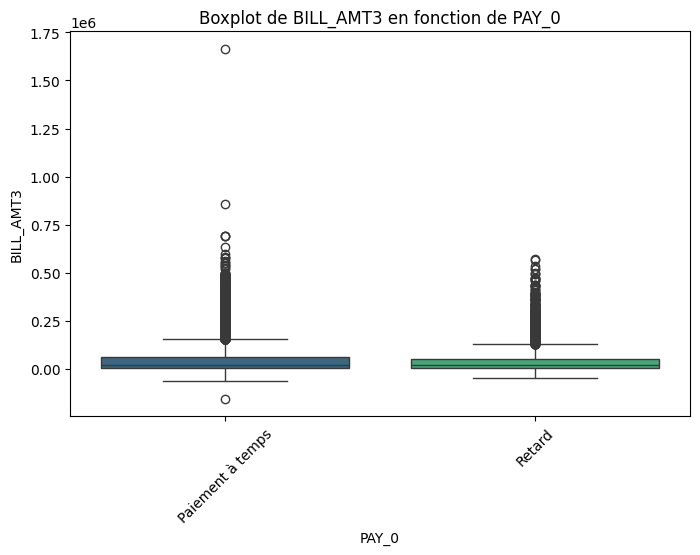

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


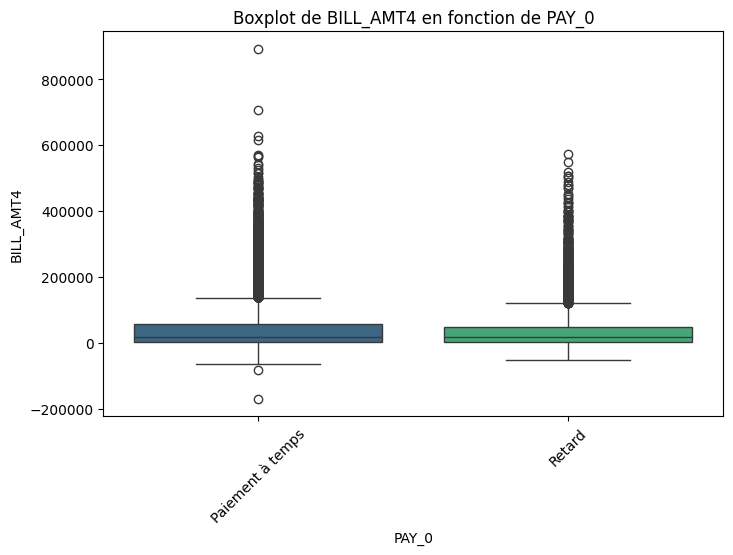

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


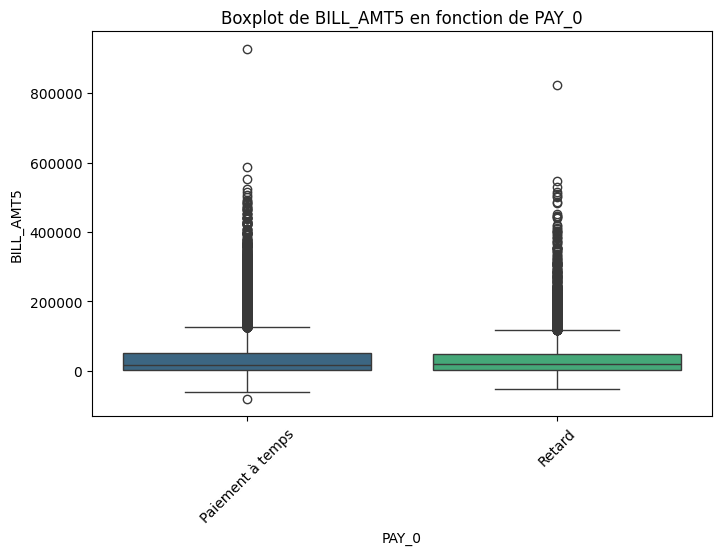

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


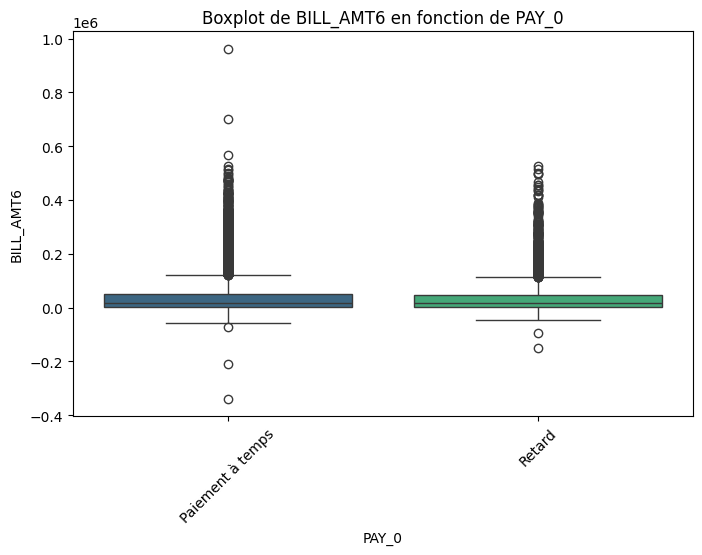

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


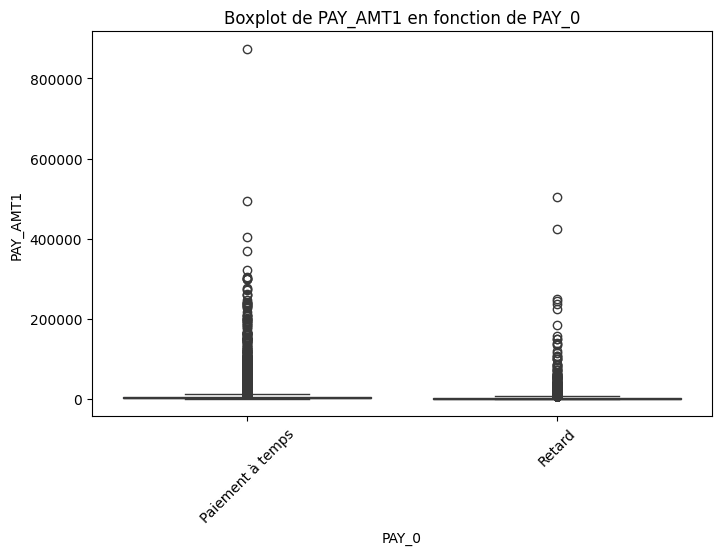

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


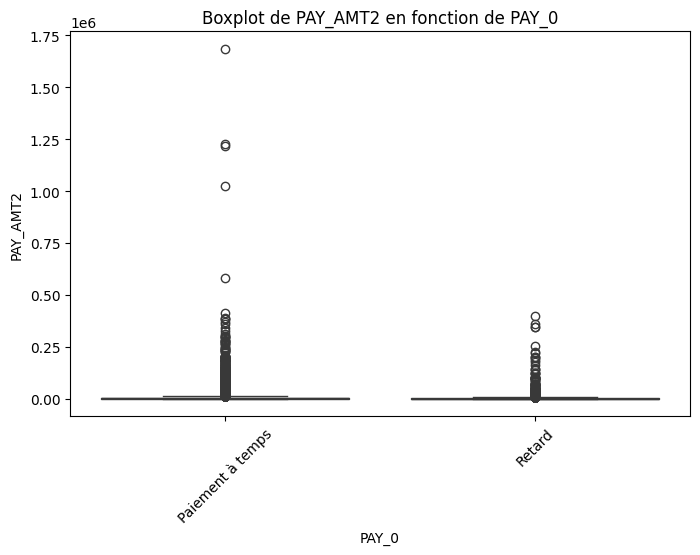

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


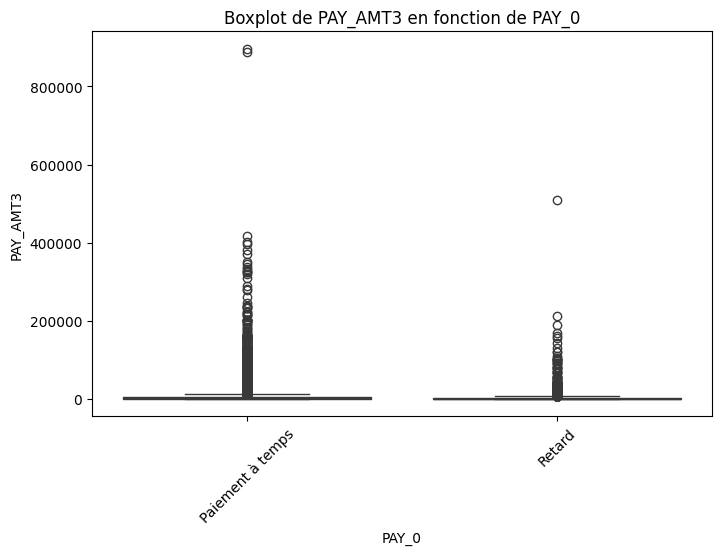

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


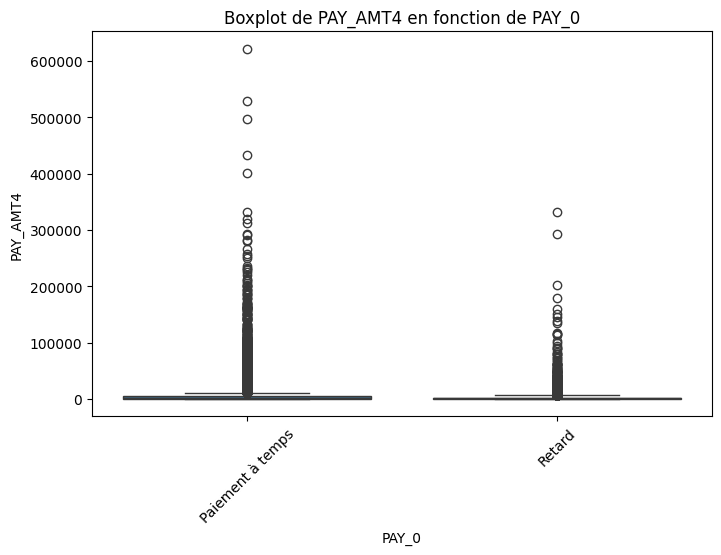

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


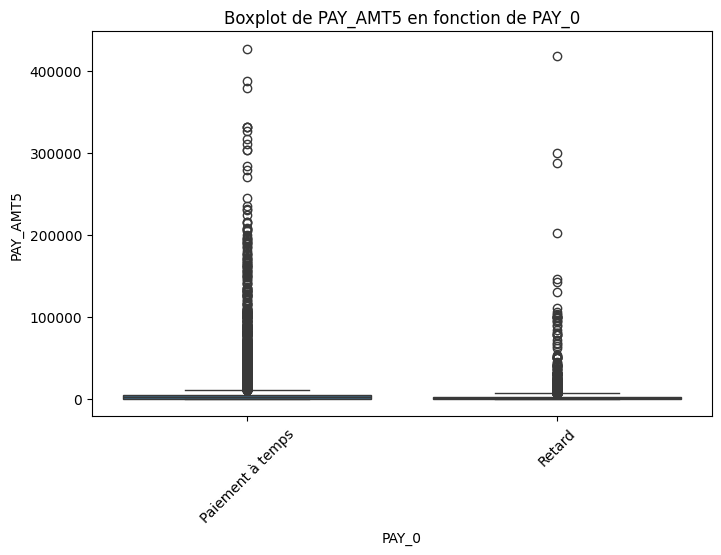

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


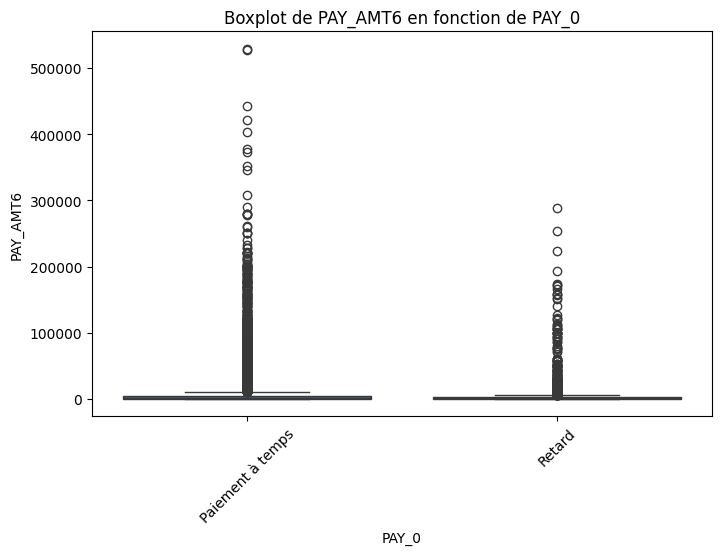

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


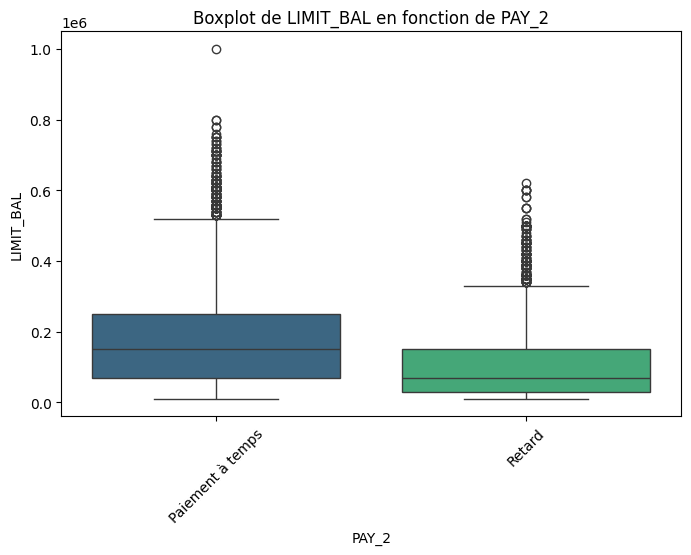

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


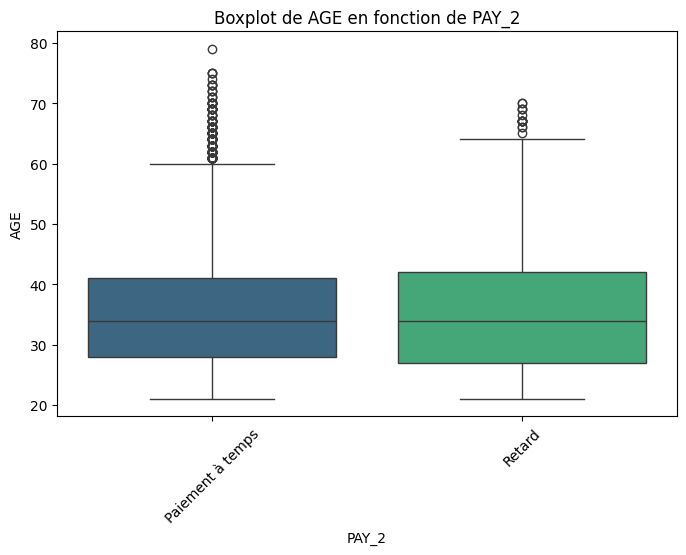

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


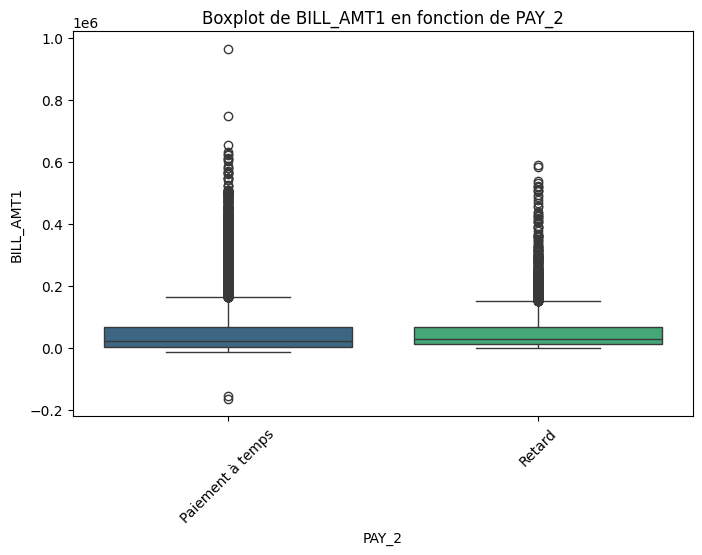

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


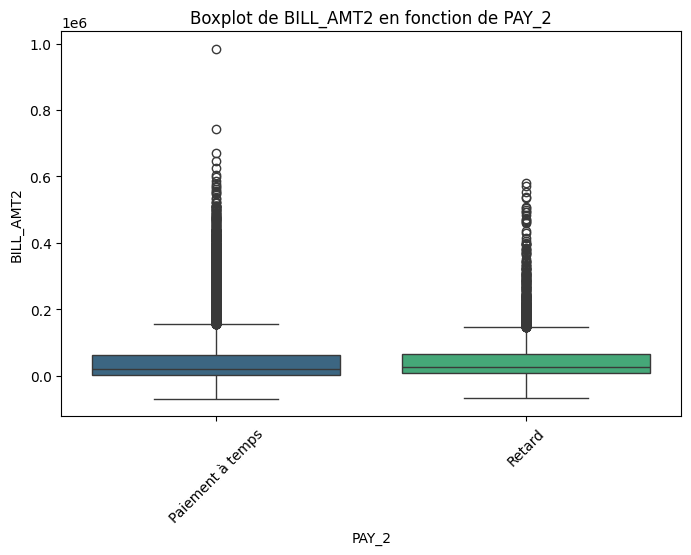

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


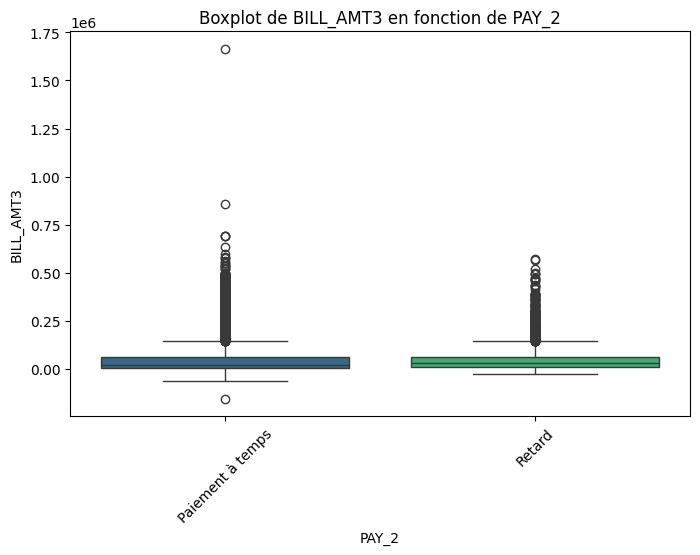

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


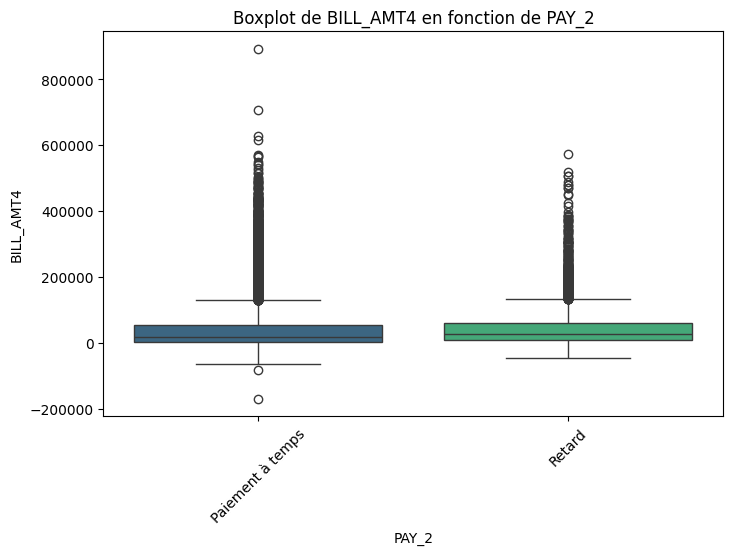

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


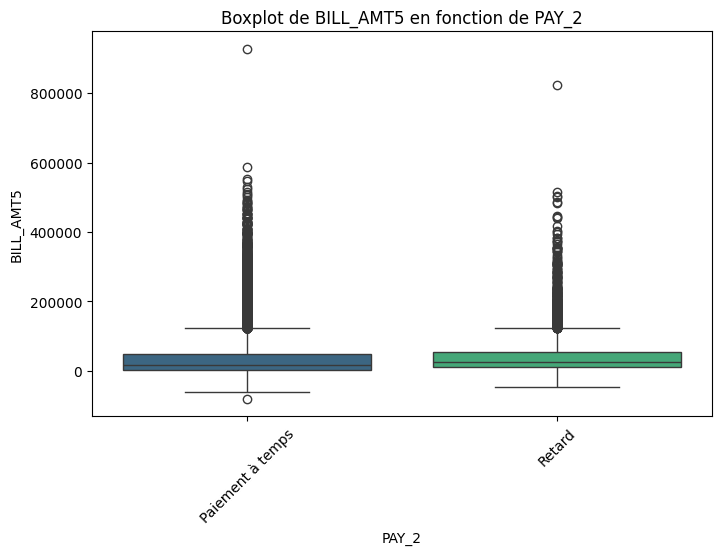

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


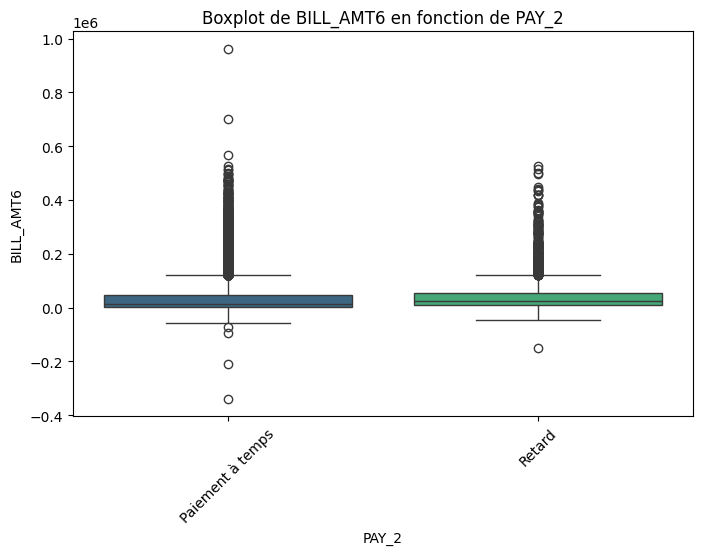

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


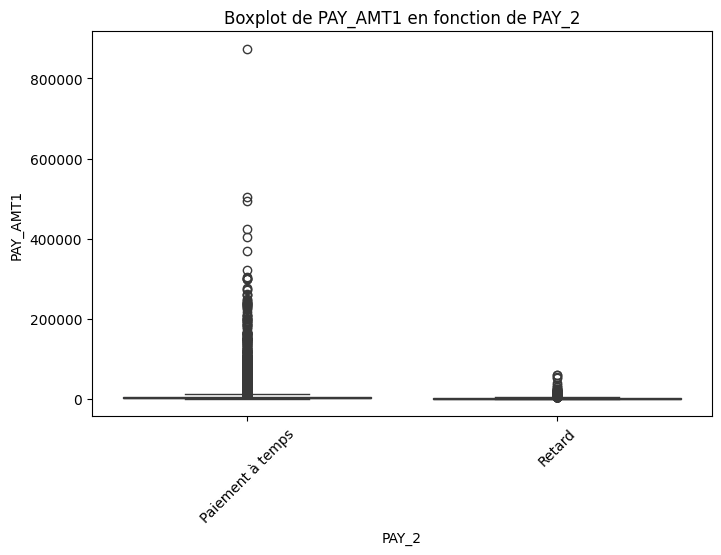

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


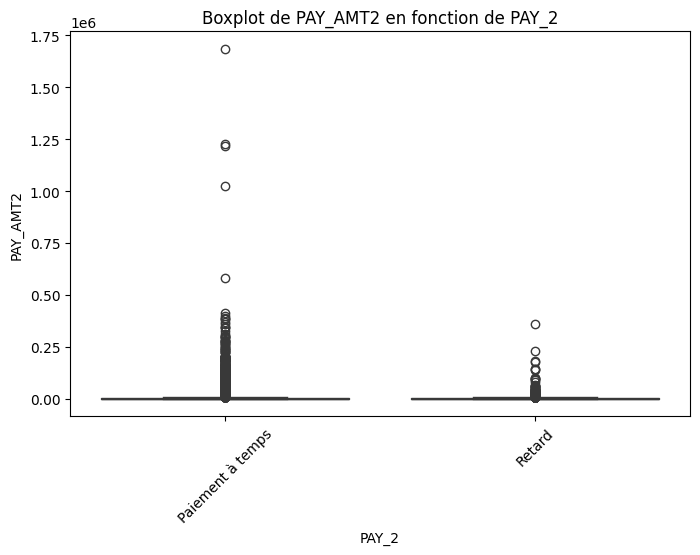

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


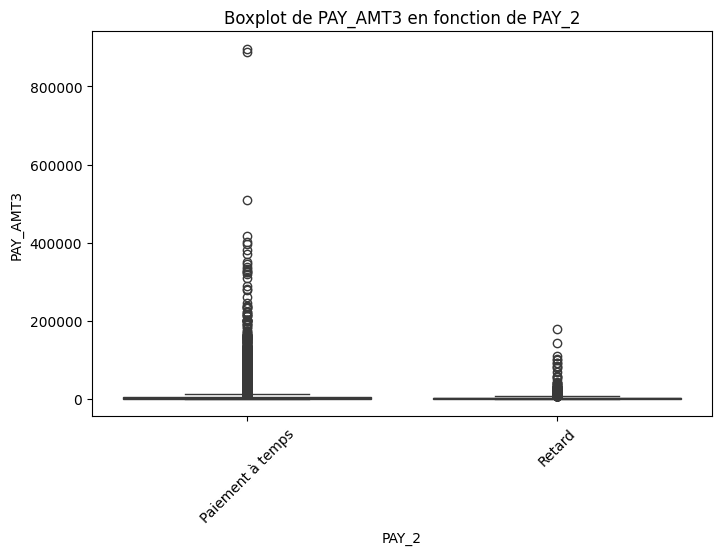

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


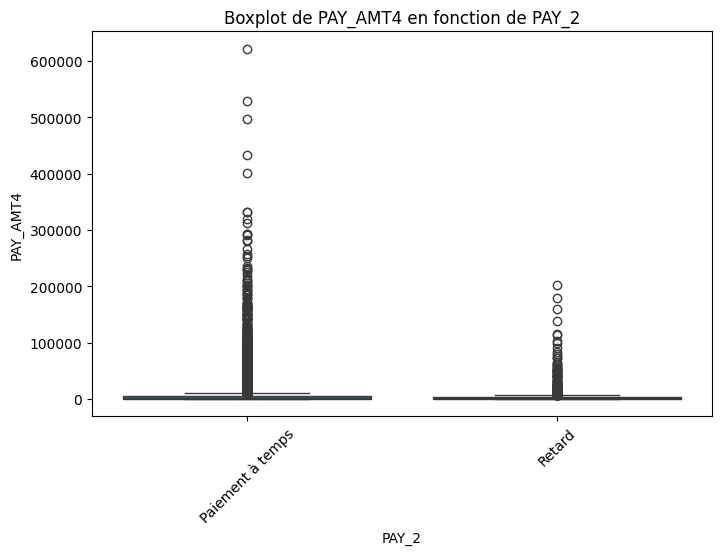

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


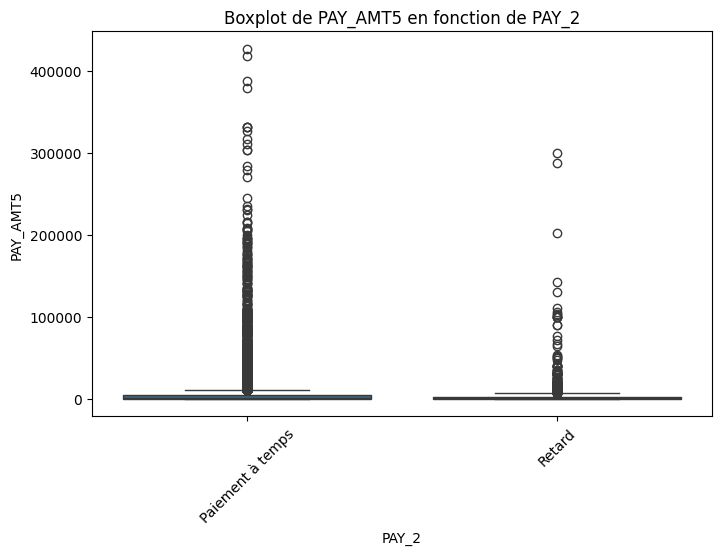

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


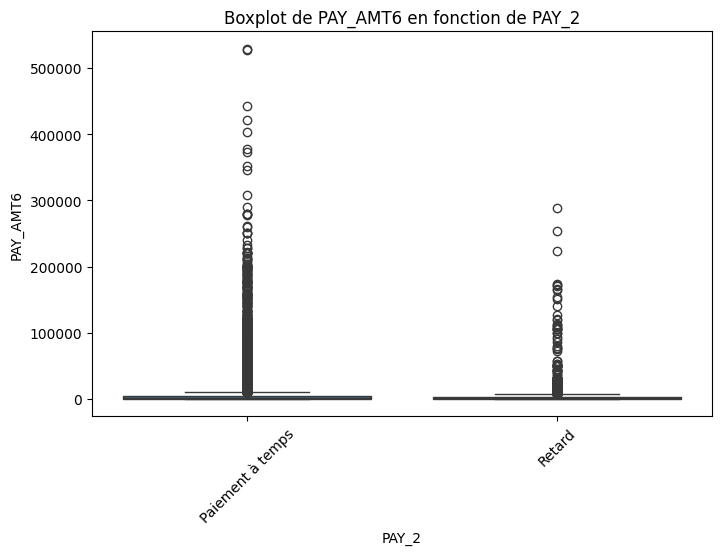

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


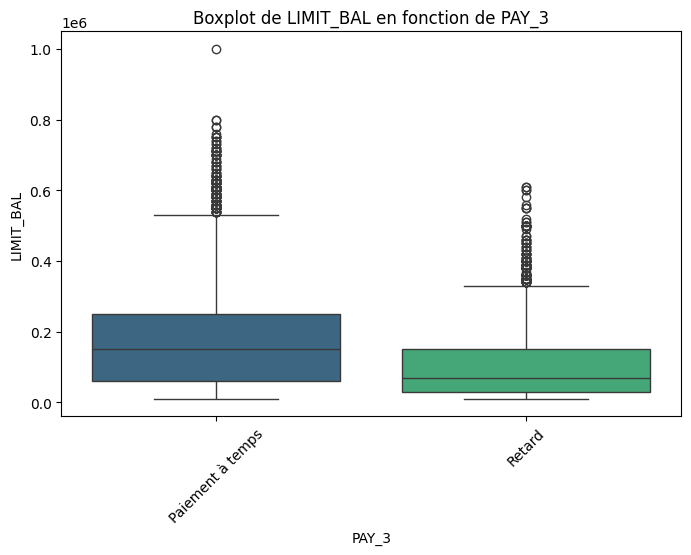

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


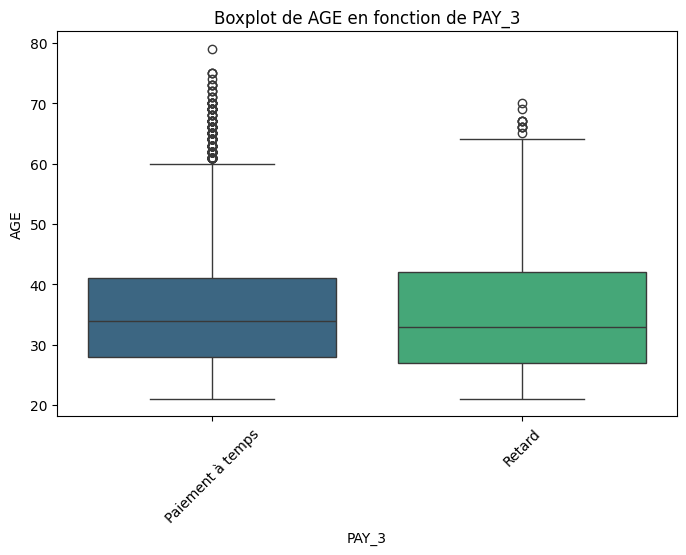

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


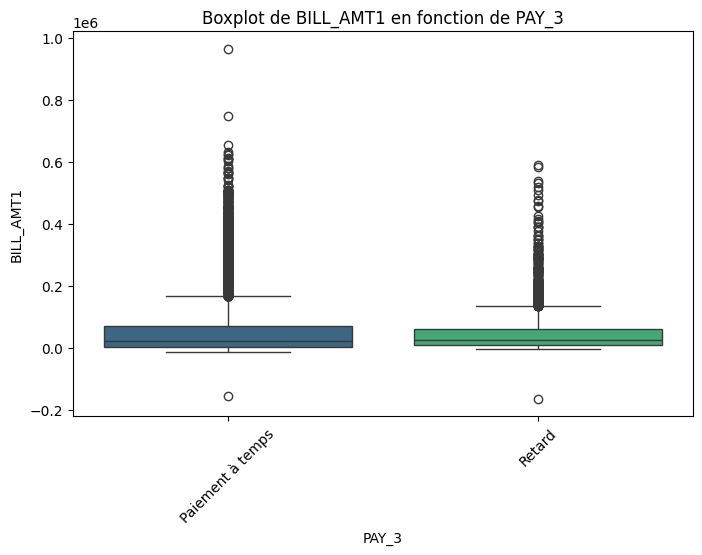

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


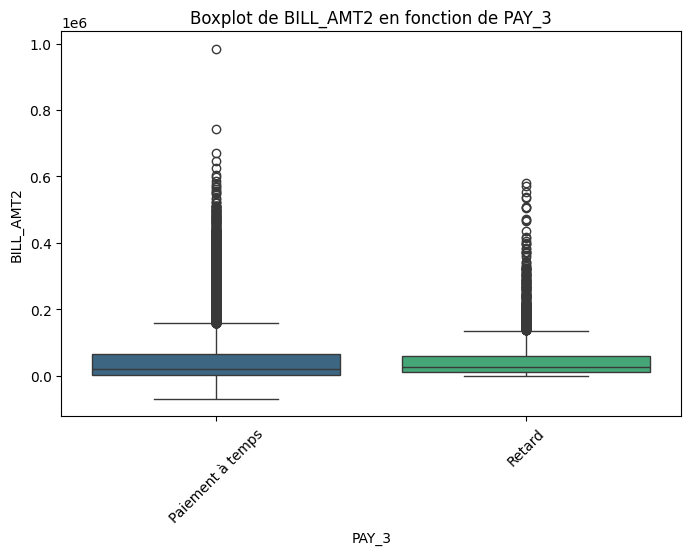

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


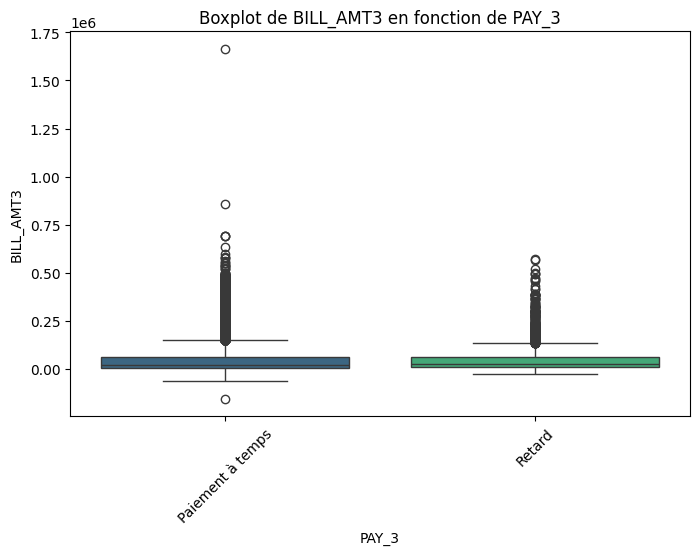

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


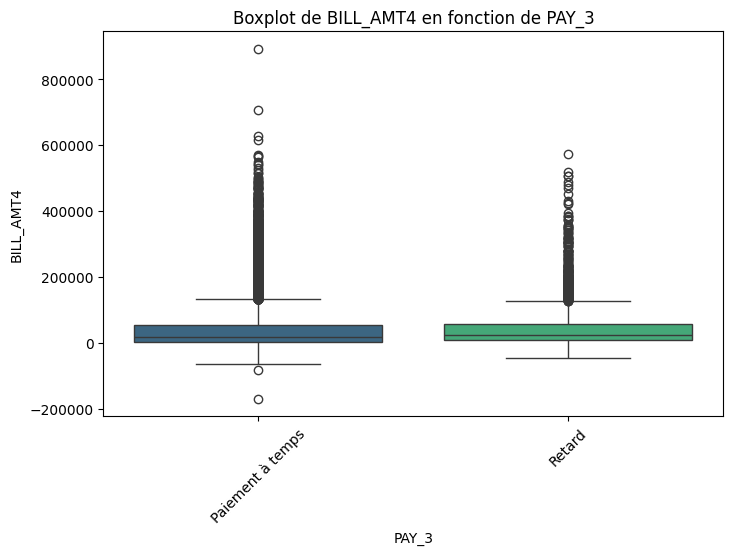

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


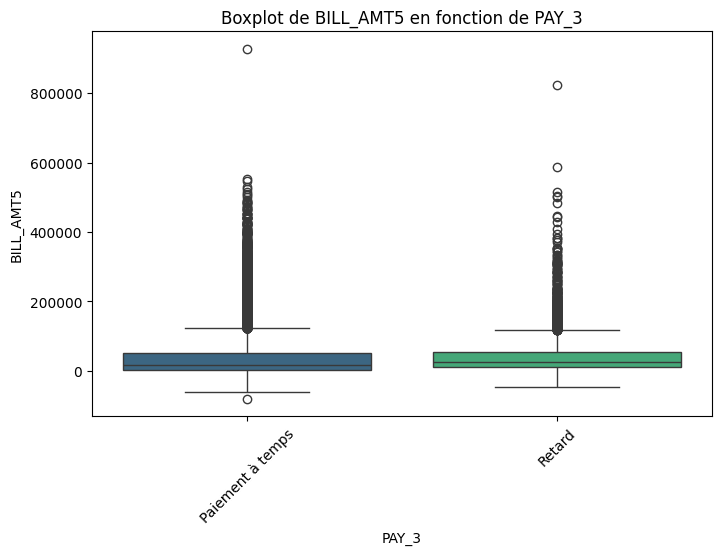

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


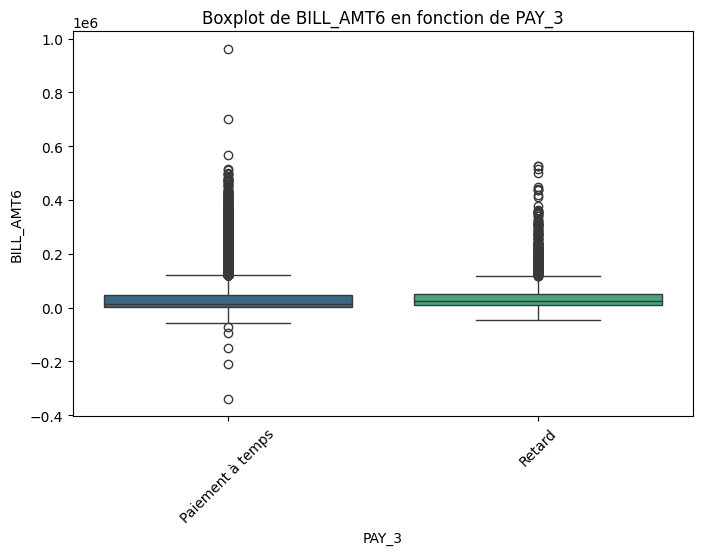

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


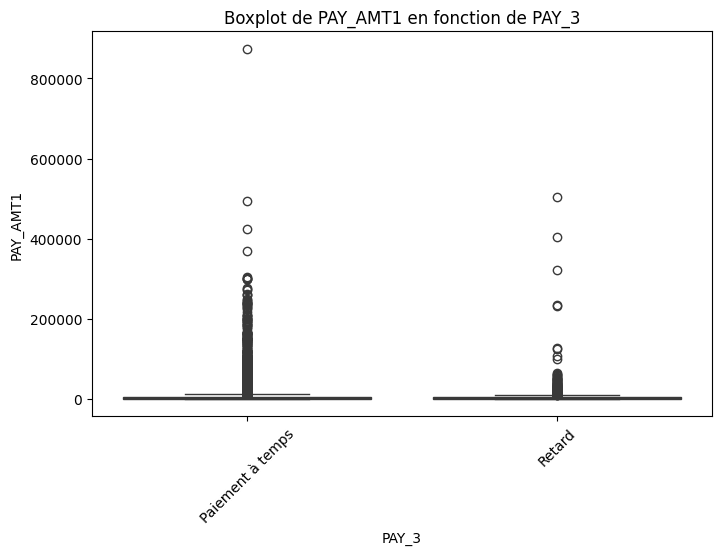

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


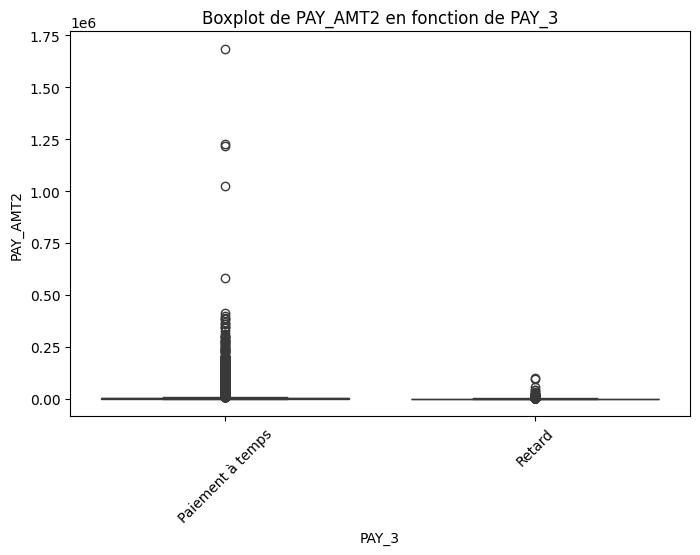

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


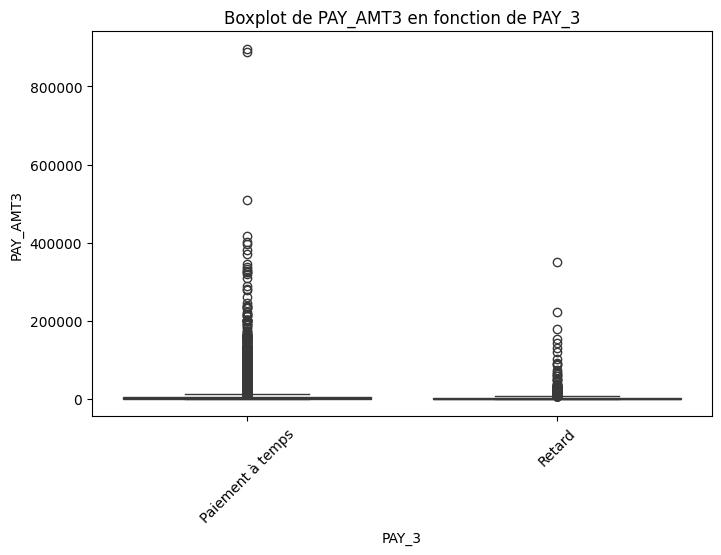

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


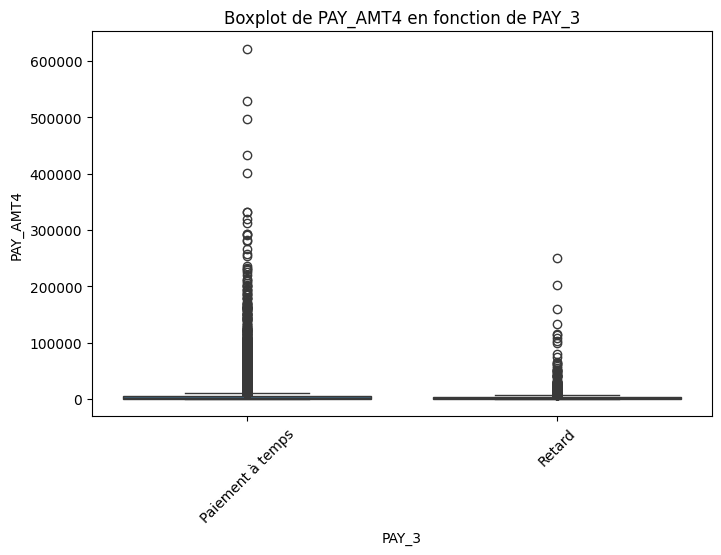

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


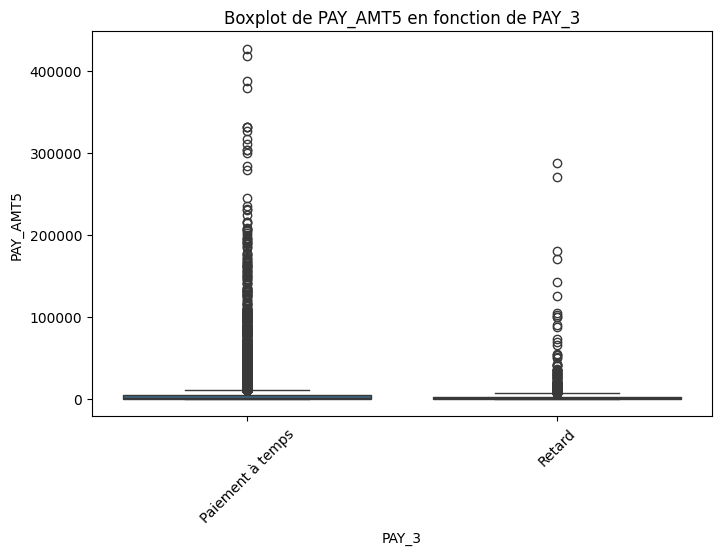

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


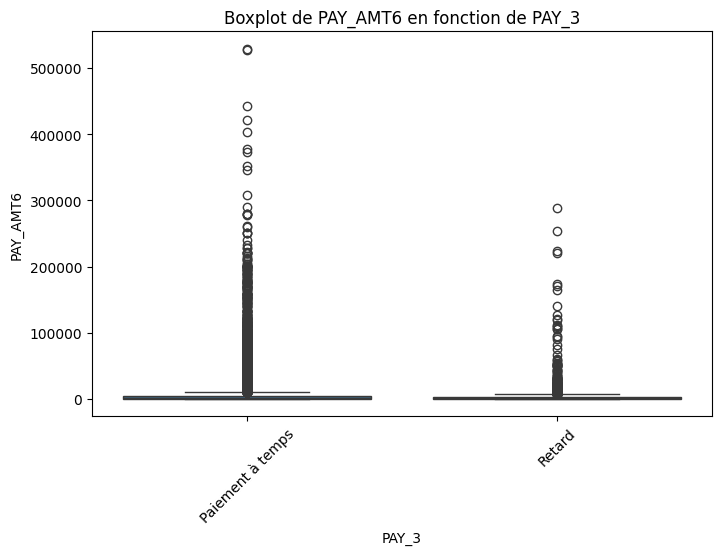

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


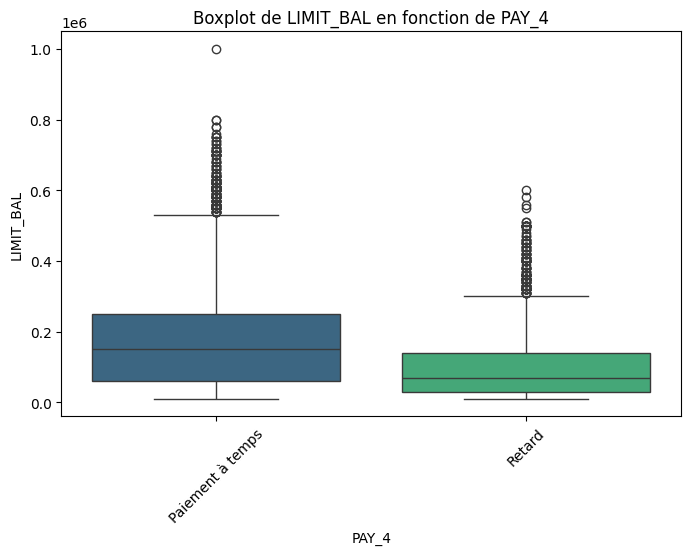

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


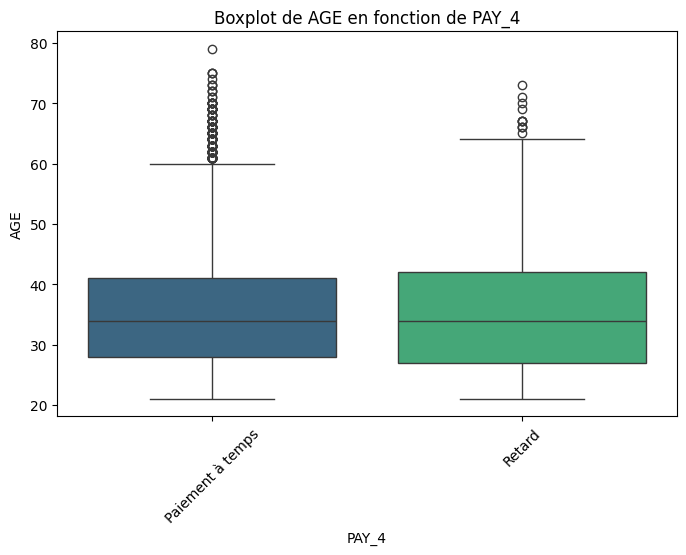

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


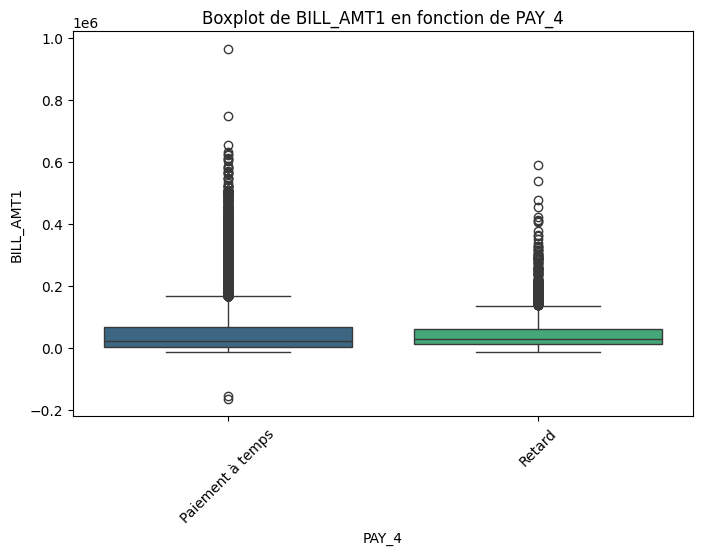

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


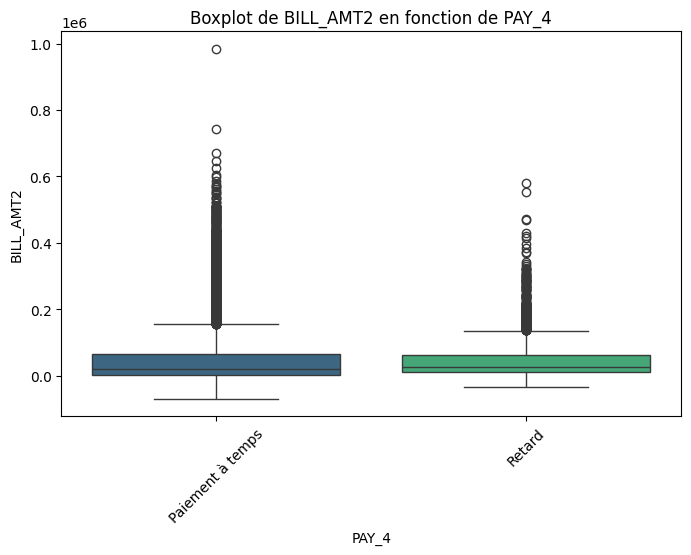

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


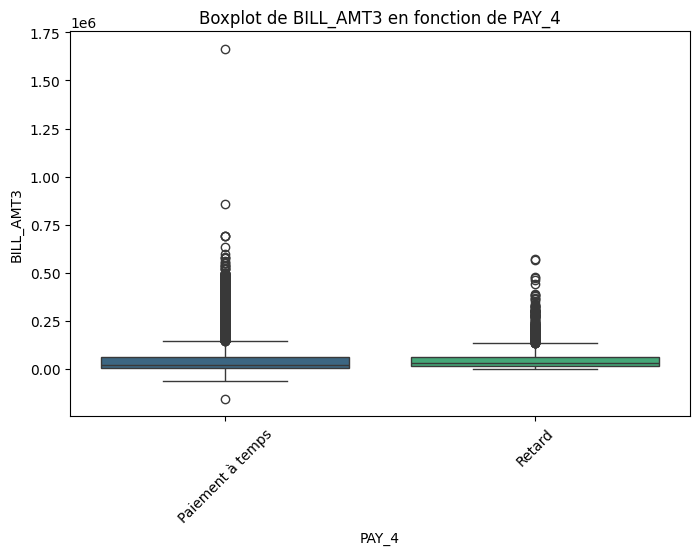

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


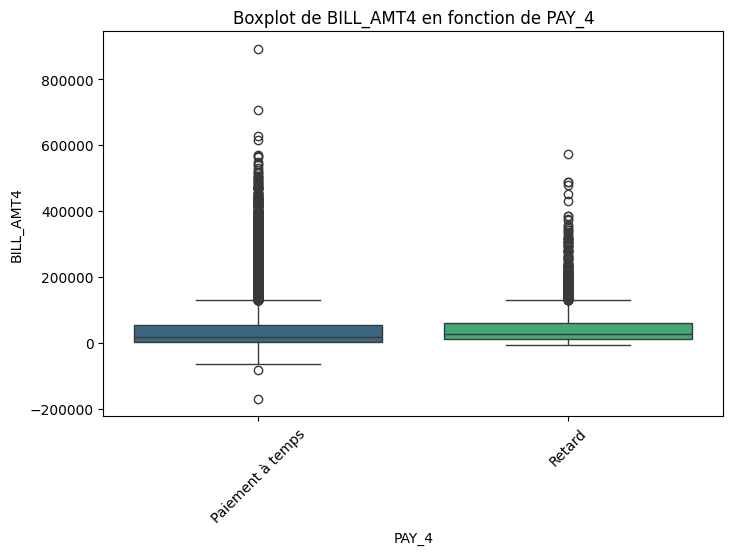

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


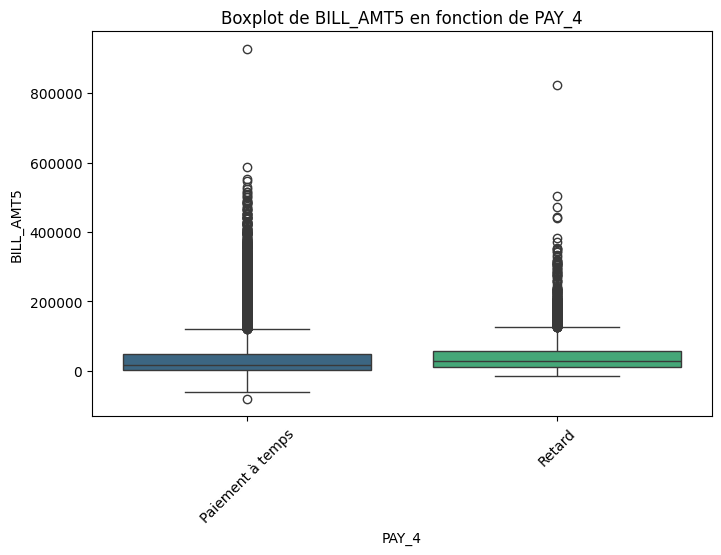

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


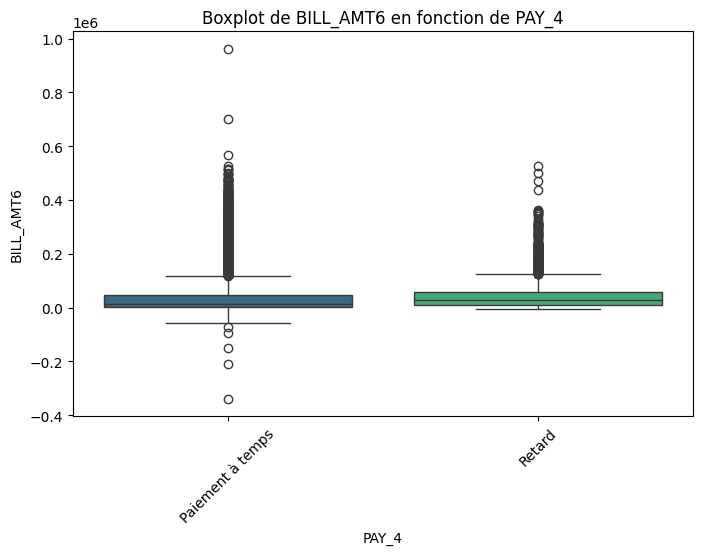

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


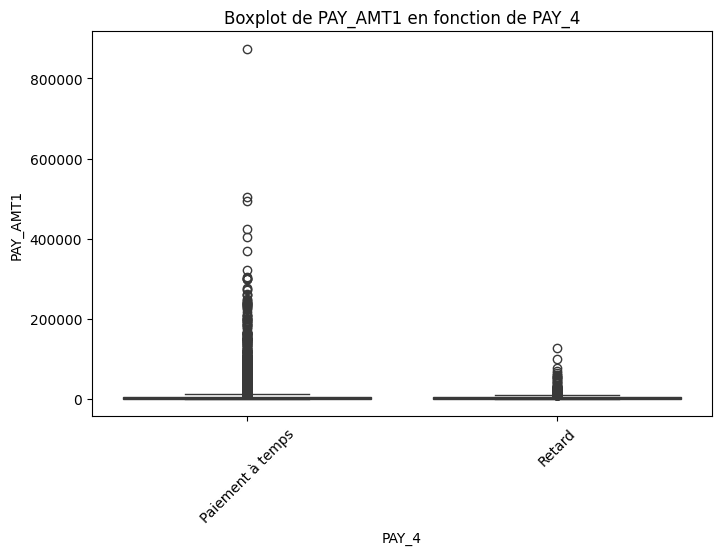

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


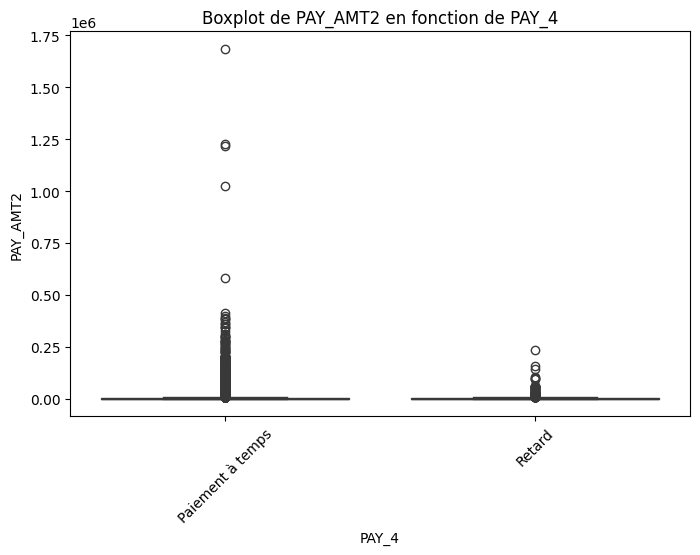

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


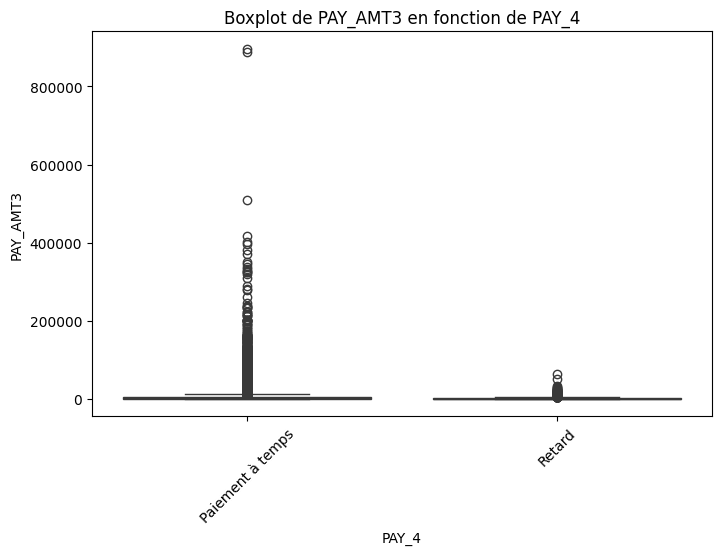

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


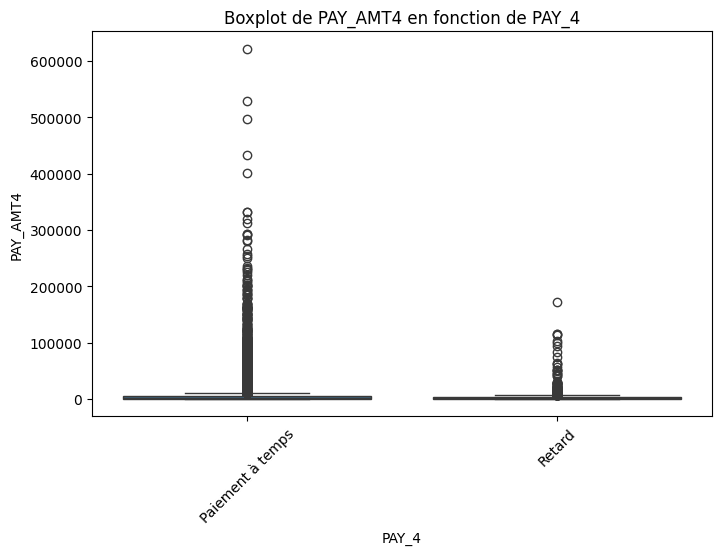

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


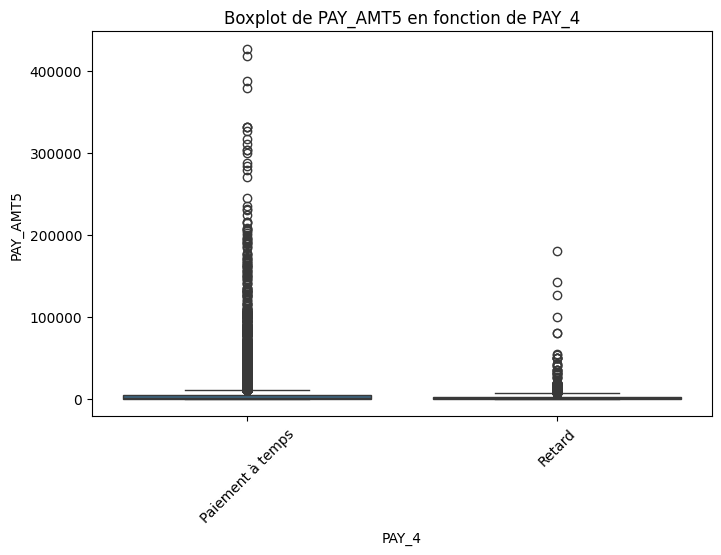

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


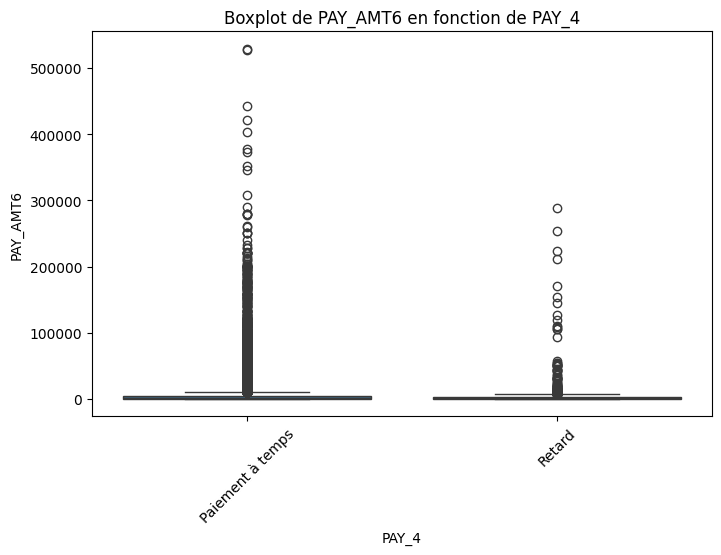

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


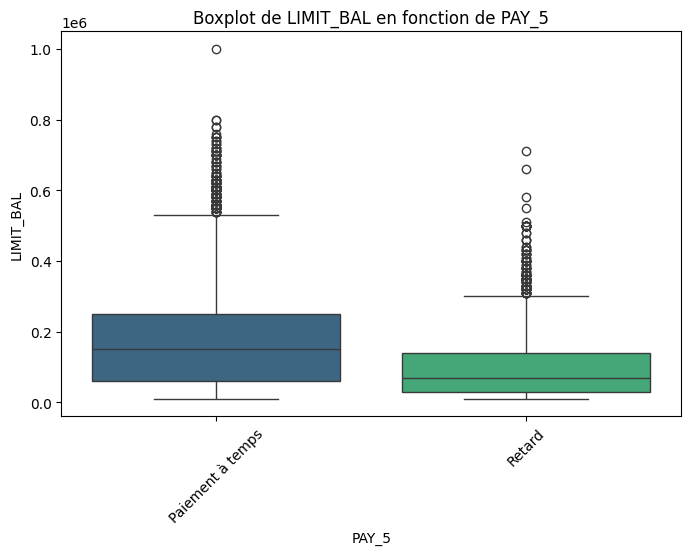

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


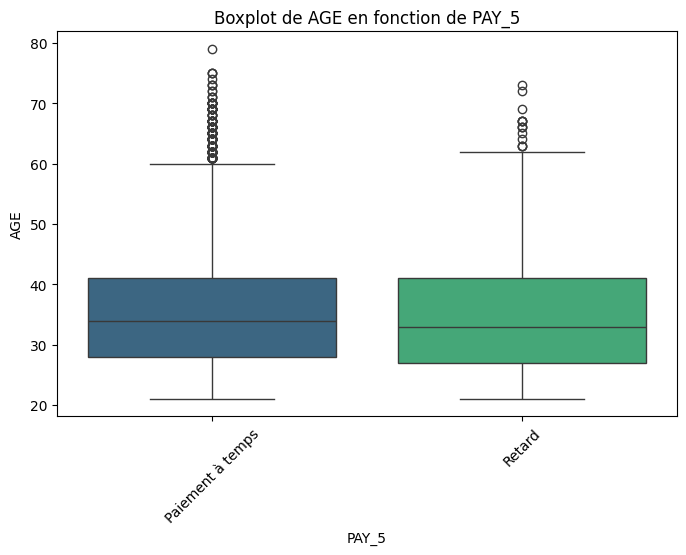

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


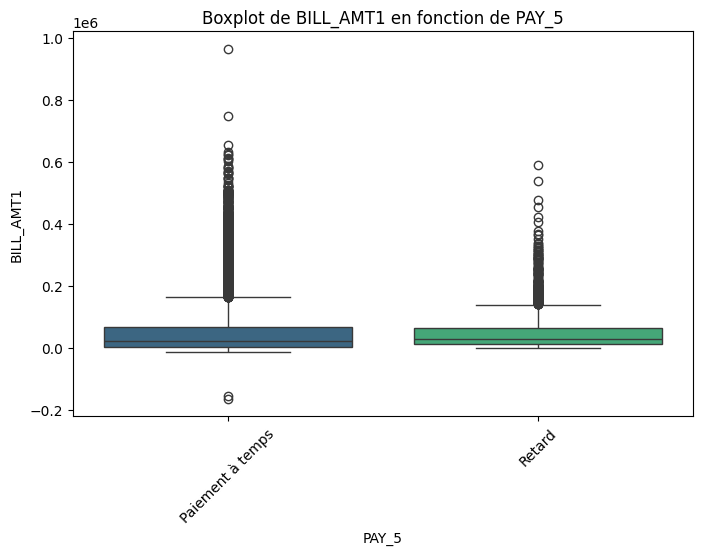

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


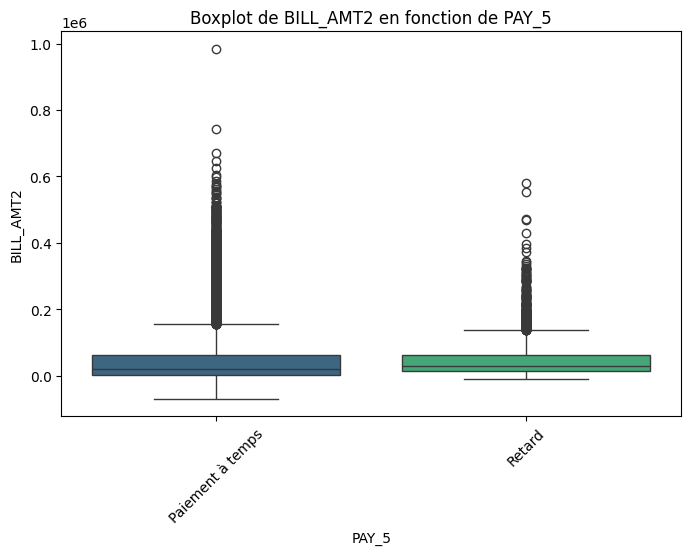

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


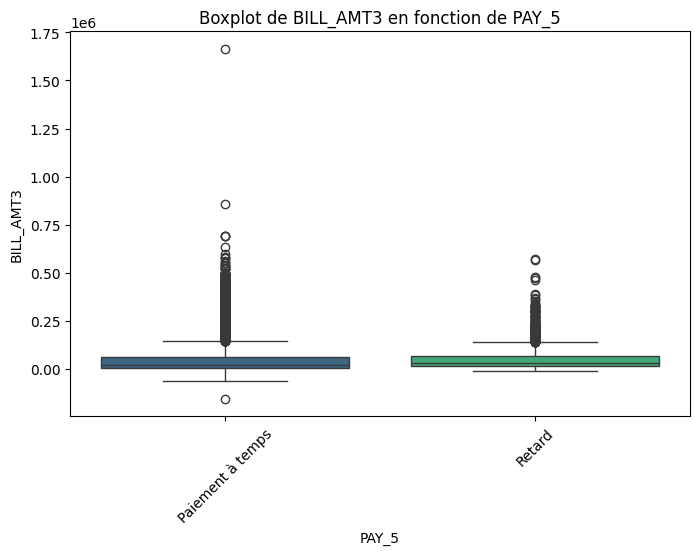

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


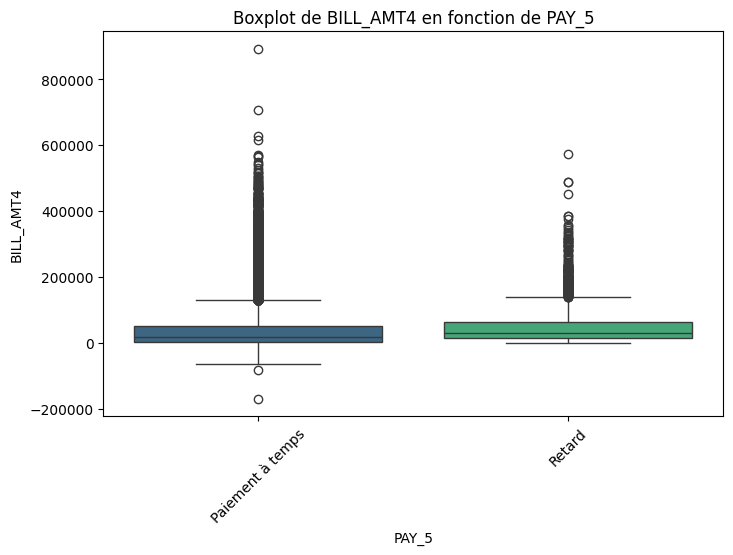

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


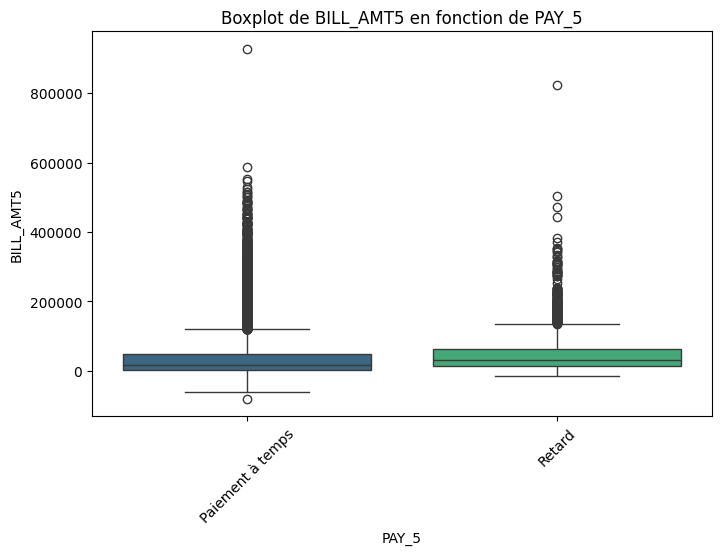

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


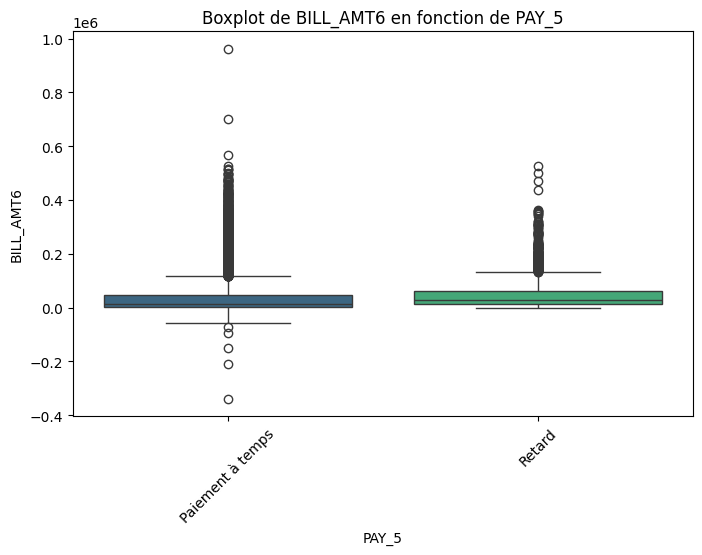

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


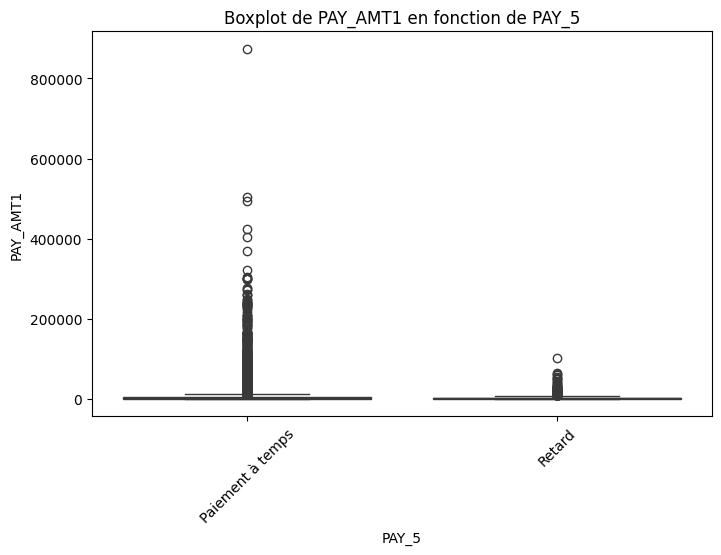

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


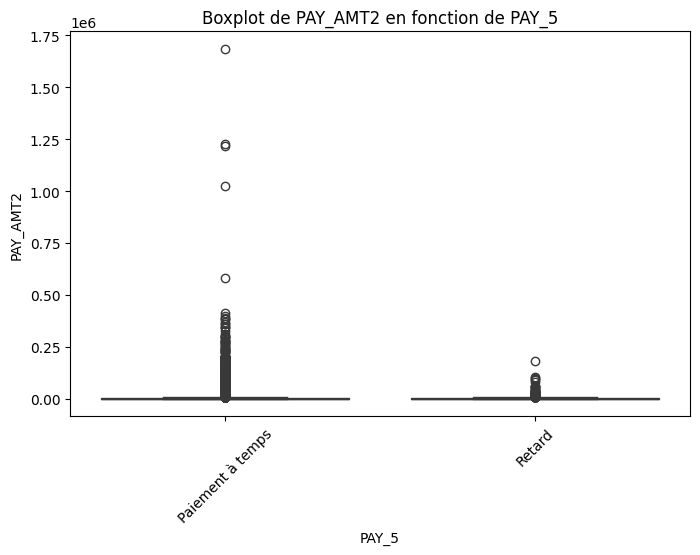

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


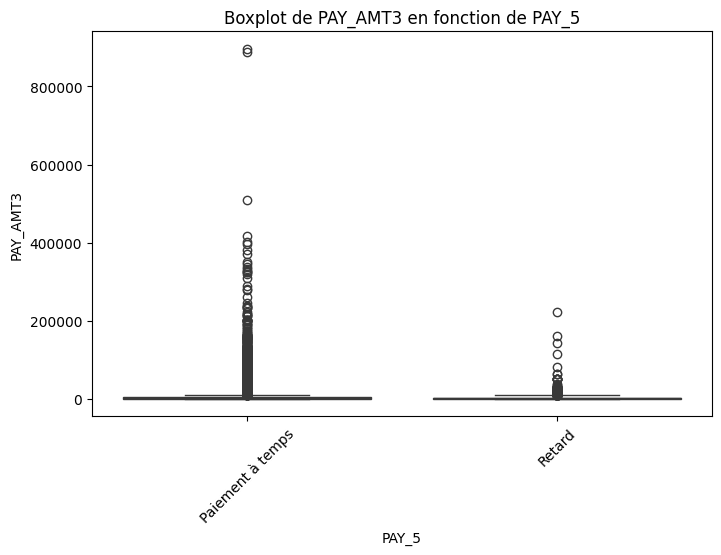

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


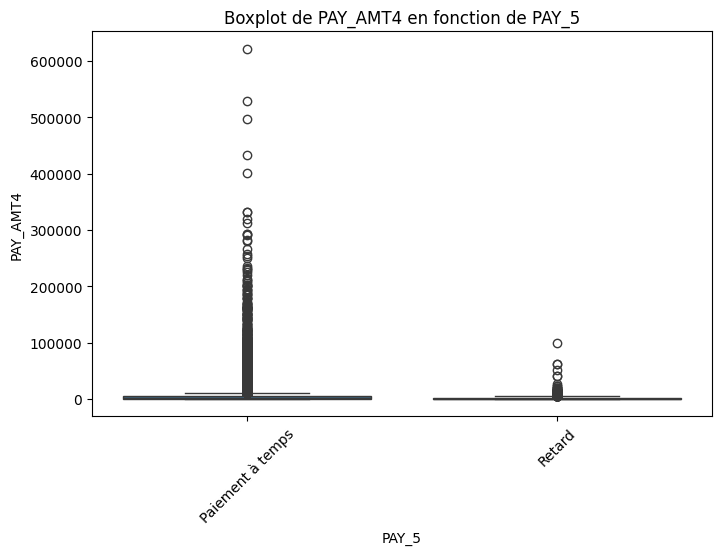

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


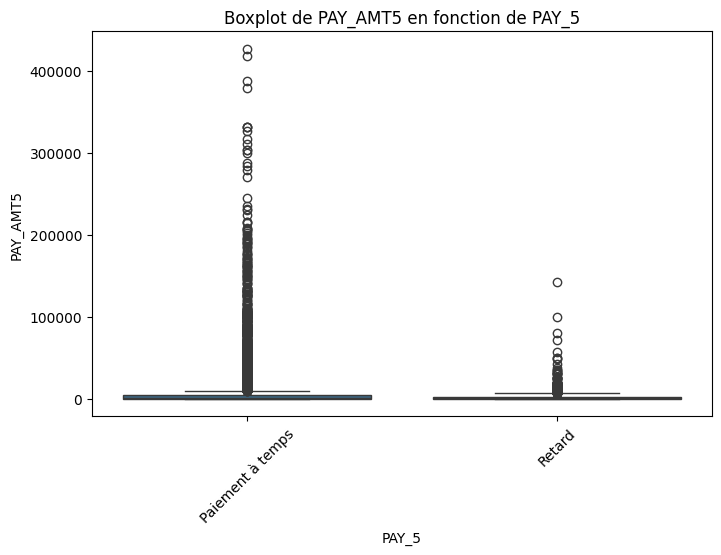

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


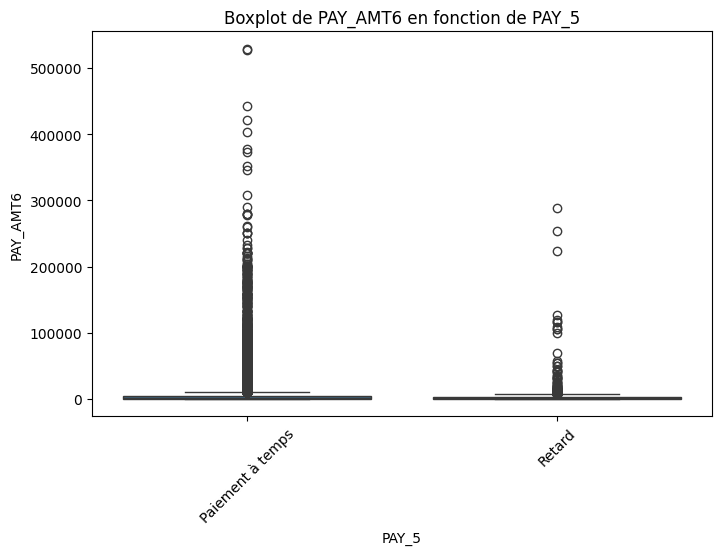

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


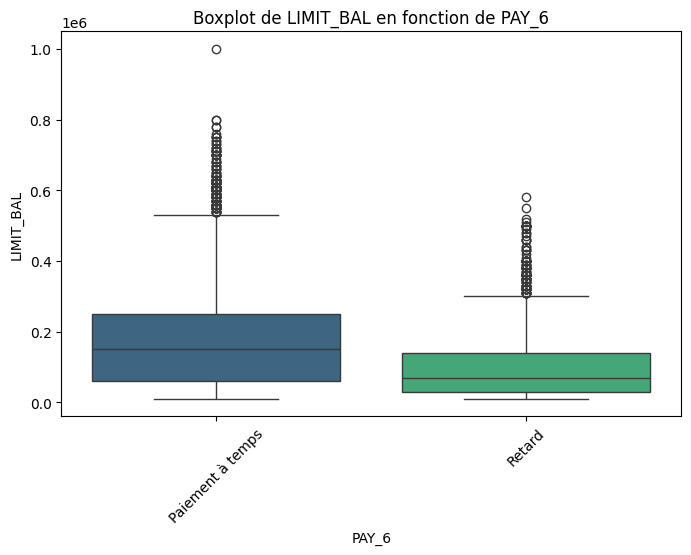

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


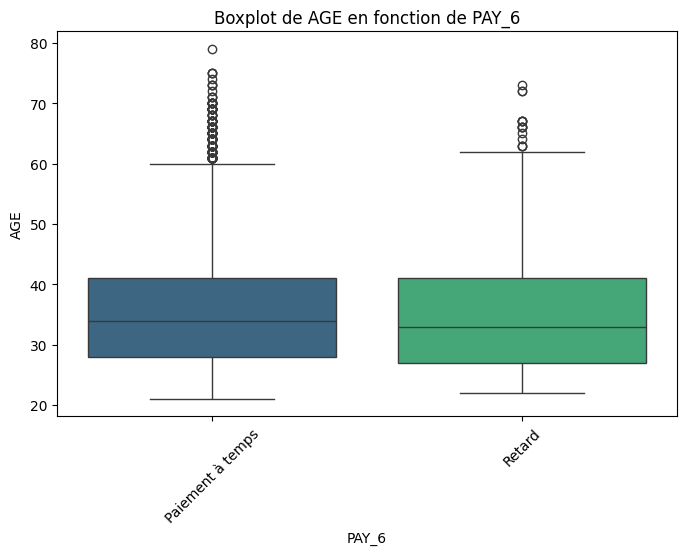

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


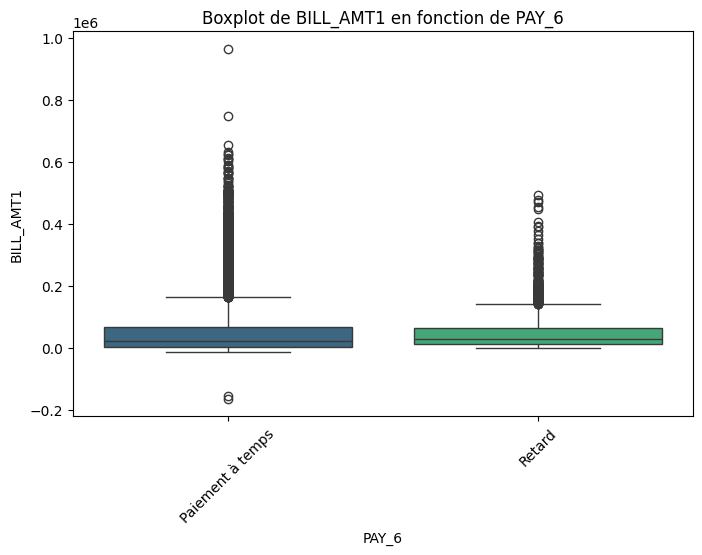

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


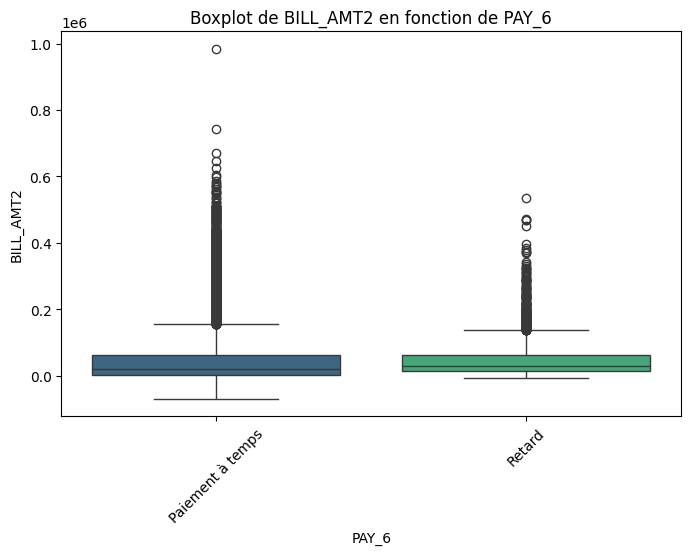

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


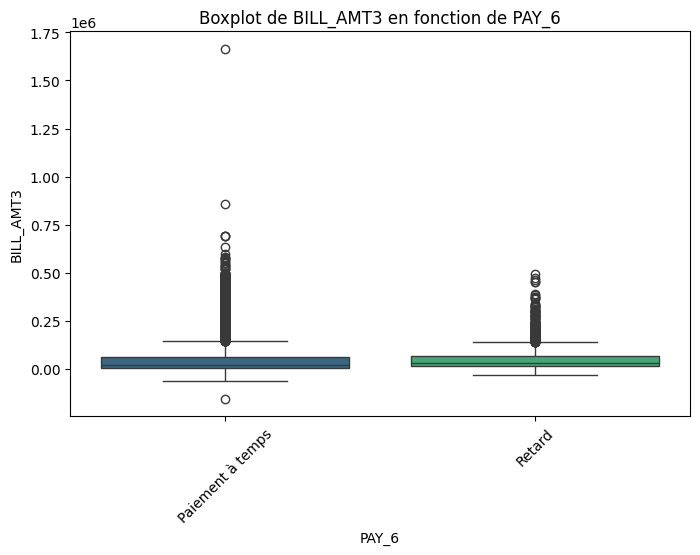

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


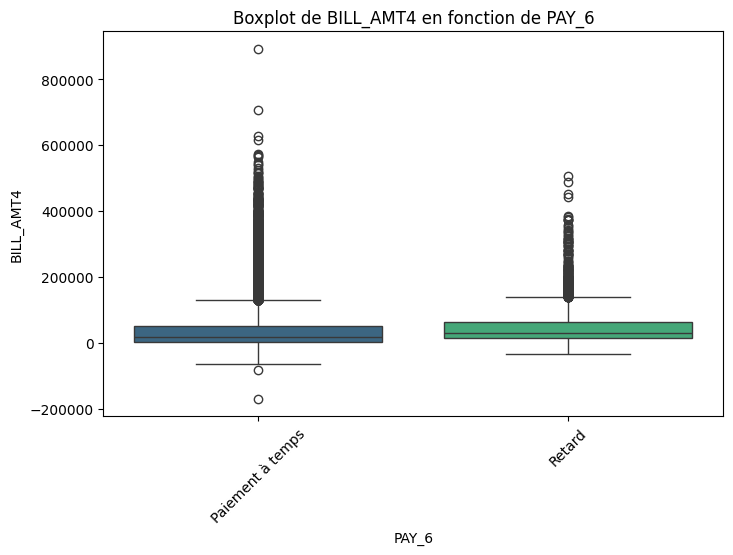

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


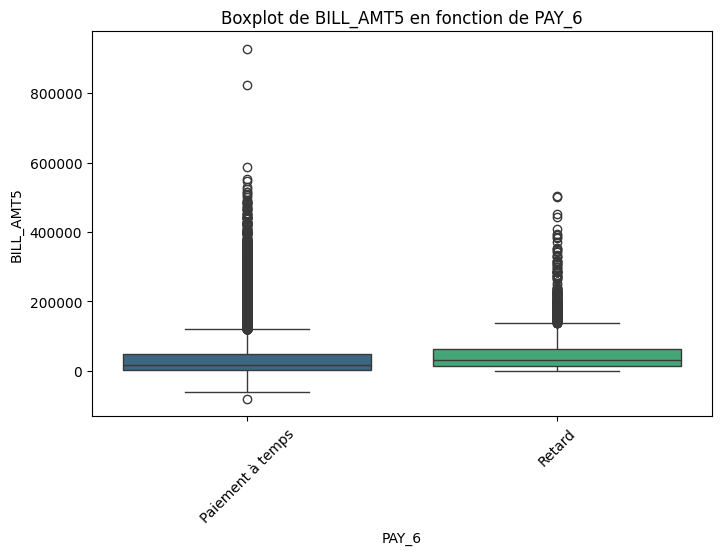

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


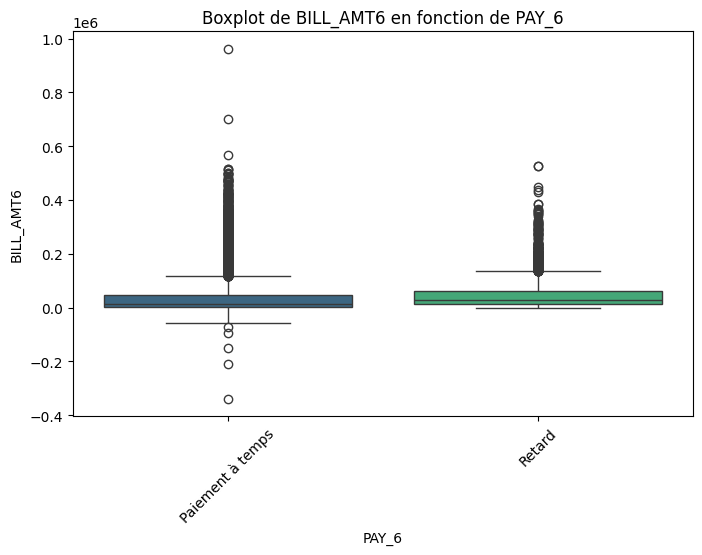

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


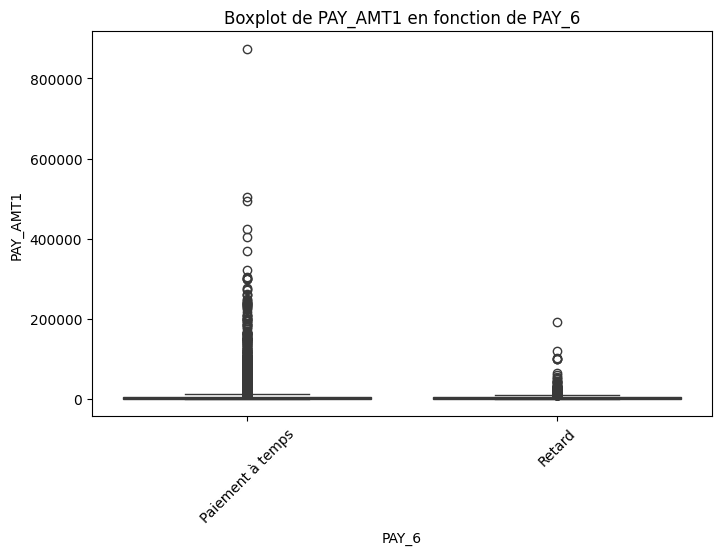

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


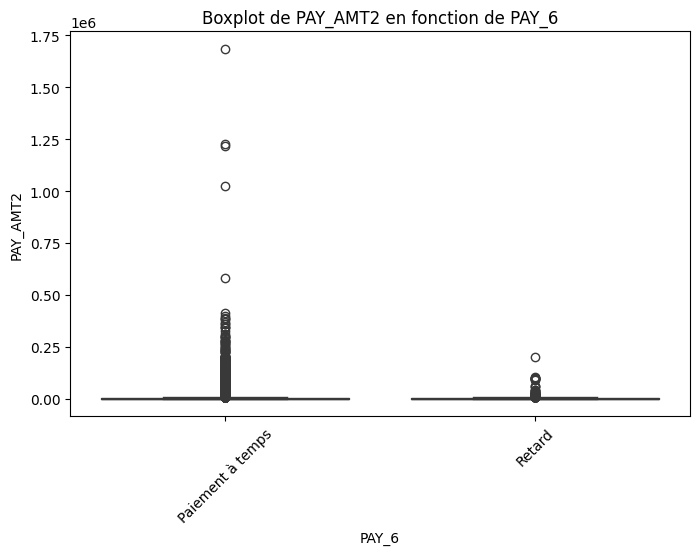

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


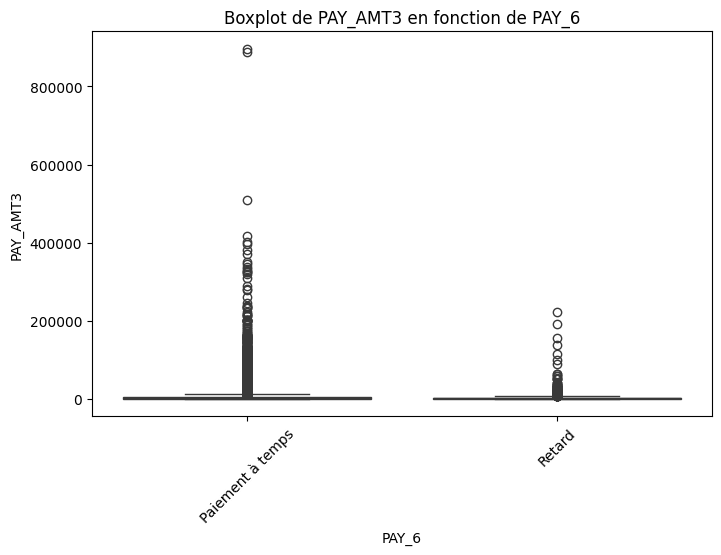

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


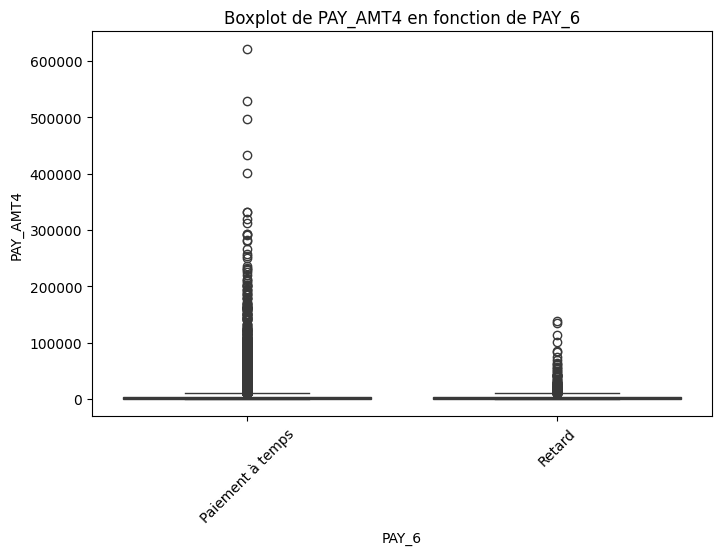

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


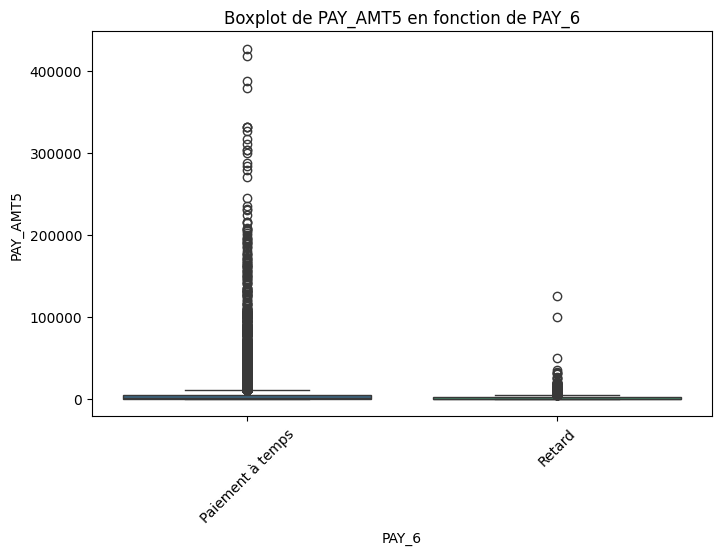

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


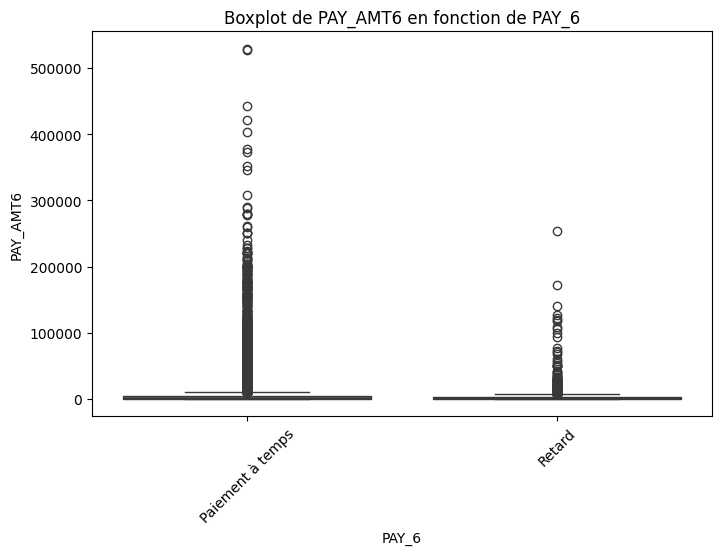

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


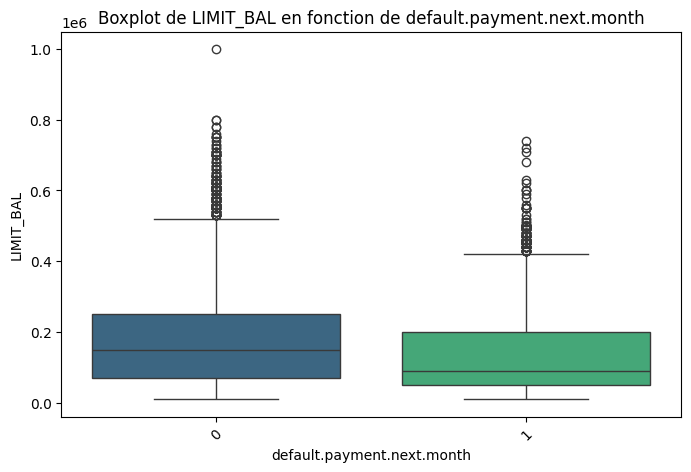

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


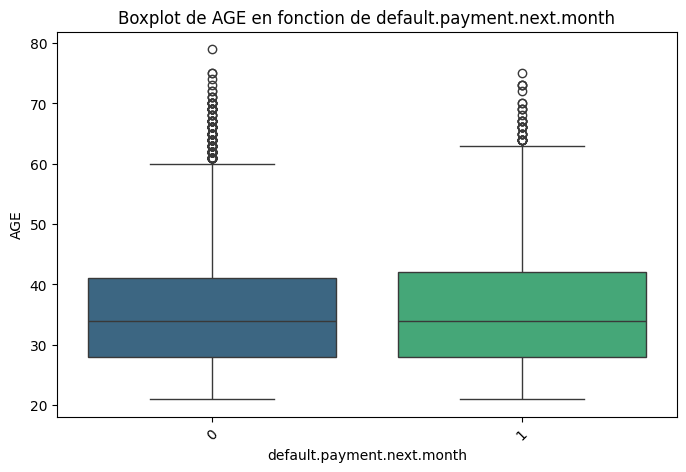

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


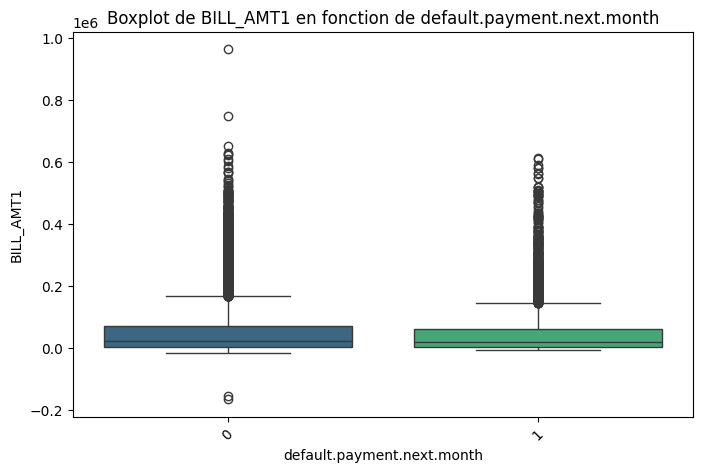

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


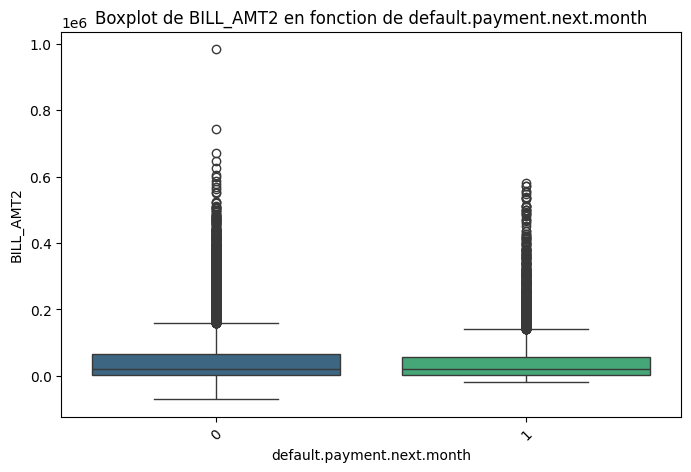

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


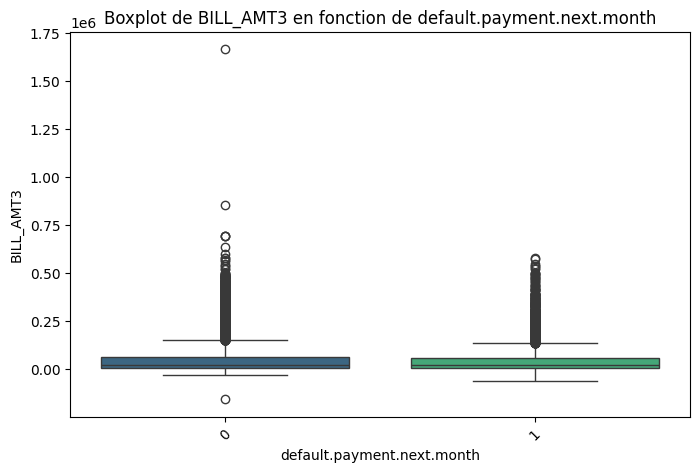

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


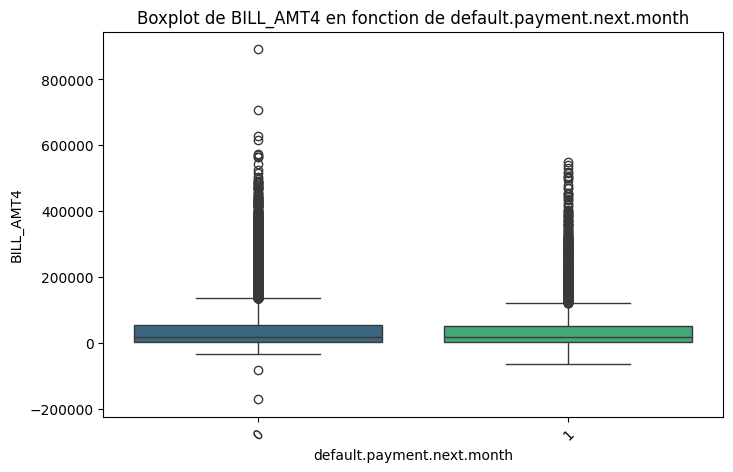

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


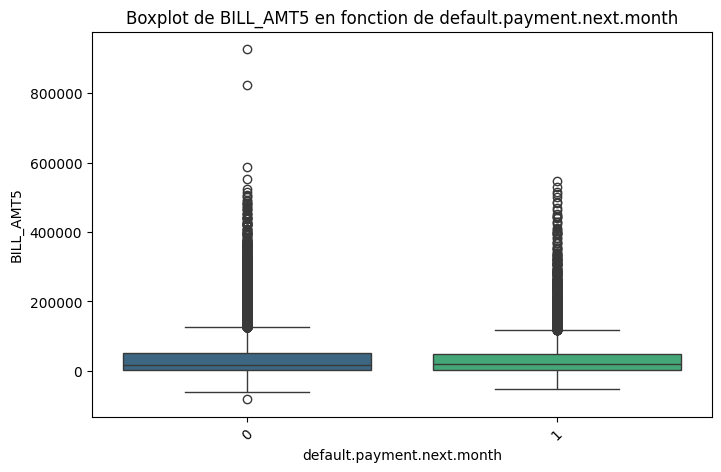

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


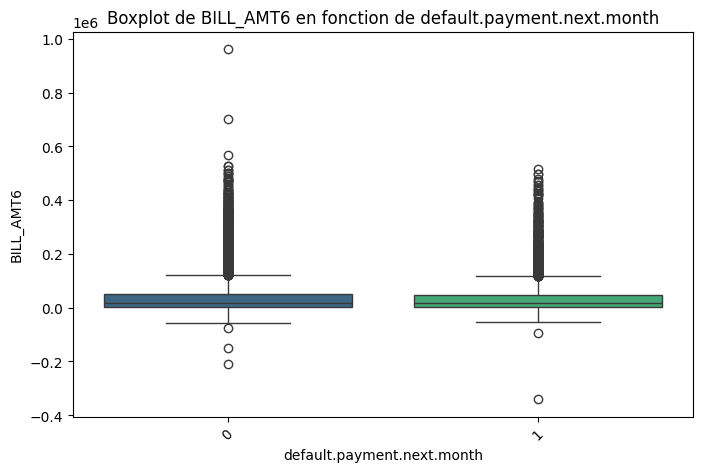

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


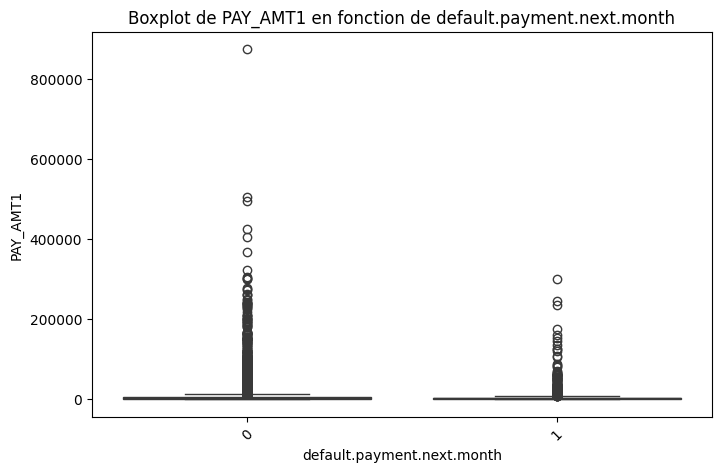

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


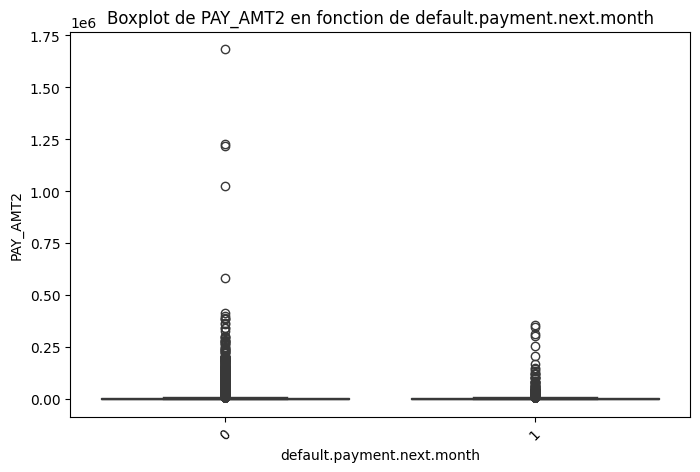

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


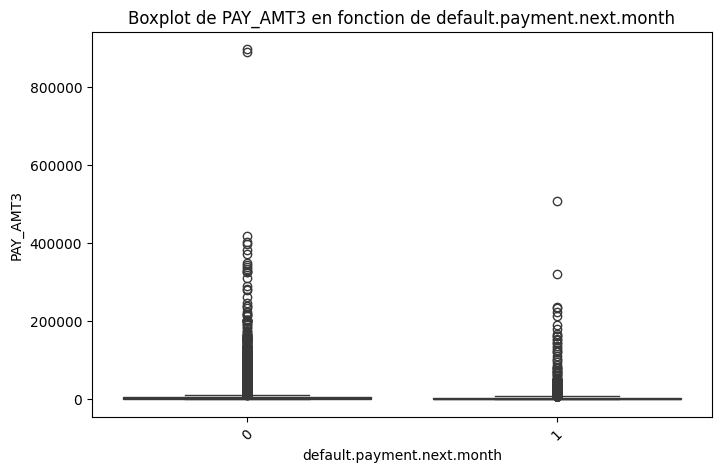

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


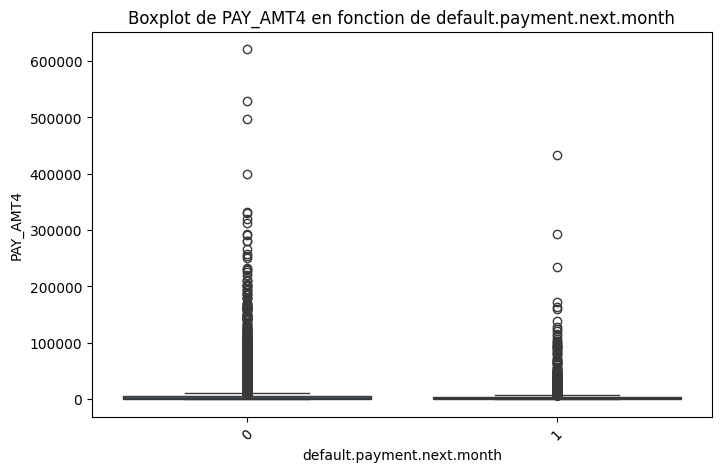

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


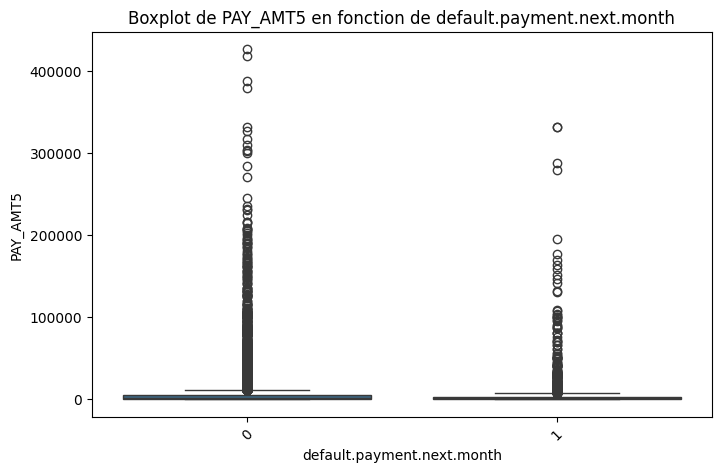

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
C:\Users\Etudiant\AppData\Local\Temp\ipykernel_37436\3587893600.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat], y=data[num], palette='viridis')


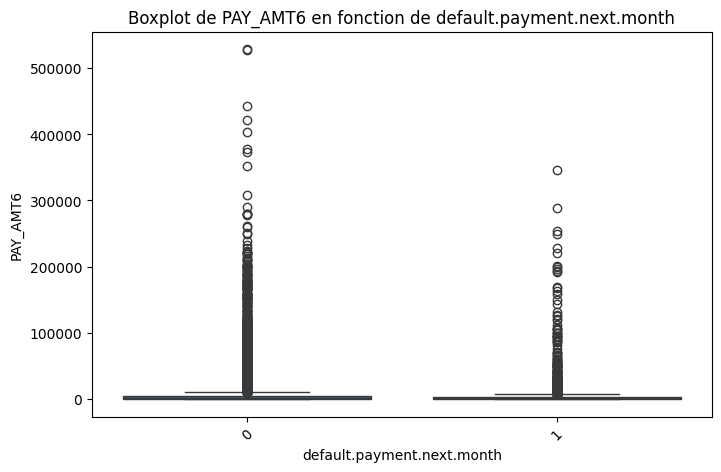

    Variable Catégorielle Variable Quantitative    Test Utilisé  \
29               MARRIAGE                   AGE  Kruskal-Wallis   
14              EDUCATION             LIMIT_BAL  Kruskal-Wallis   
15              EDUCATION                   AGE  Kruskal-Wallis   
56                  PAY_2             LIMIT_BAL          T-test   
70                  PAY_3             LIMIT_BAL          T-test   
..                    ...                   ...             ...   
73                  PAY_3             BILL_AMT2          T-test   
9                     SEX              PAY_AMT2          T-test   
101                 PAY_5             BILL_AMT2          T-test   
115                 PAY_6             BILL_AMT2          T-test   
8                     SEX              PAY_AMT1          T-test   

          p-valeur  p-valeur Normalité  
29    0.000000e+00                 0.0  
14    0.000000e+00                 0.0  
15   9.876770e-290                 0.0  
56   8.498239e-268             

c:\Program Files\Python311\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


In [9]:
tableau_resultats = quali_quanti_analysis(data, target="default.payment.next.month")
print(tableau_resultats)


In [10]:
### **2️ Classement des Variables par Importance (Test Kruskal-Wallis sur la Cible)**
def kruskal_ranking(data, target):
    """
    Classe les variables quantitatives en fonction de leur association avec la cible
    en utilisant le test de Kruskal-Wallis.
    """
    numeric_vars = data.select_dtypes(include=['number'])
    results = []

    for num in numeric_vars.columns:
        test_stat, p_value = kruskal(*[data[num][data[target] == val] for val in data[target].unique()])
        results.append([num, p_value])

    results_df = pd.DataFrame(results, columns=["Variable Quantitative", "p-valeur Kruskal-Wallis"])
    return results_df.sort_values(by="p-valeur Kruskal-Wallis", ascending=True)

In [11]:
# Load the data into a DataFrame
data = pd.read_csv('UCI_Credit_Card.csv')

y = data["default.payment.next.month"]          # variable cible
X = data.drop(columns=["default.payment.next.month"])

# Then call kruskal_ranking with the DataFrame
tableau_kruskal = kruskal_ranking(data, target="default.payment.next.month")
print(tableau_kruskal)

         Variable Quantitative  p-valeur Kruskal-Wallis
24  default.payment.next.month             0.000000e+00
6                        PAY_0             0.000000e+00
7                        PAY_2            6.445798e-309
8                        PAY_3            1.786014e-249
9                        PAY_4            7.987430e-199
1                    LIMIT_BAL            1.225520e-189
18                    PAY_AMT1            4.616556e-170
10                       PAY_5            4.854405e-167
19                    PAY_AMT2            9.954766e-151
11                       PAY_6            1.537135e-134
20                    PAY_AMT3            8.992533e-129
21                    PAY_AMT4            7.284564e-109
23                    PAY_AMT6             3.184062e-98
22                    PAY_AMT5             1.124851e-90
3                    EDUCATION             1.532341e-14
2                          SEX             4.476449e-12
4                     MARRIAGE             4.473

## Feature Selection

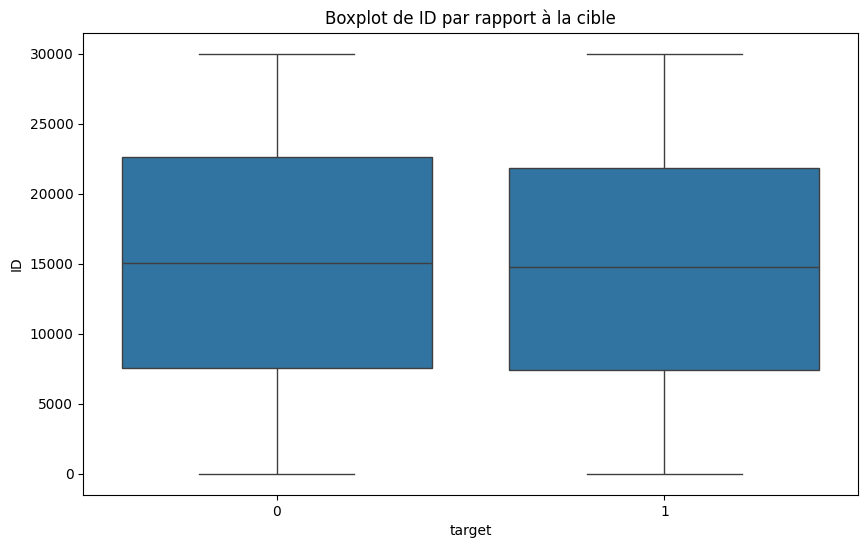

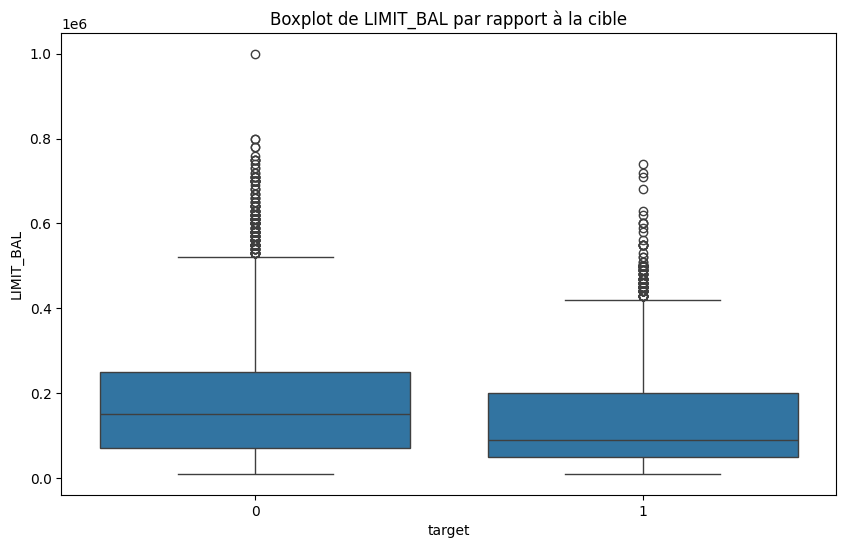

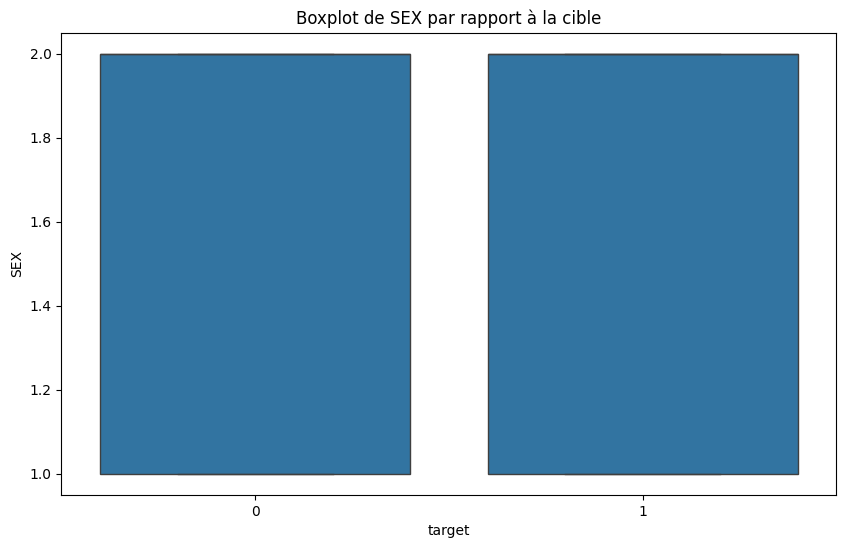

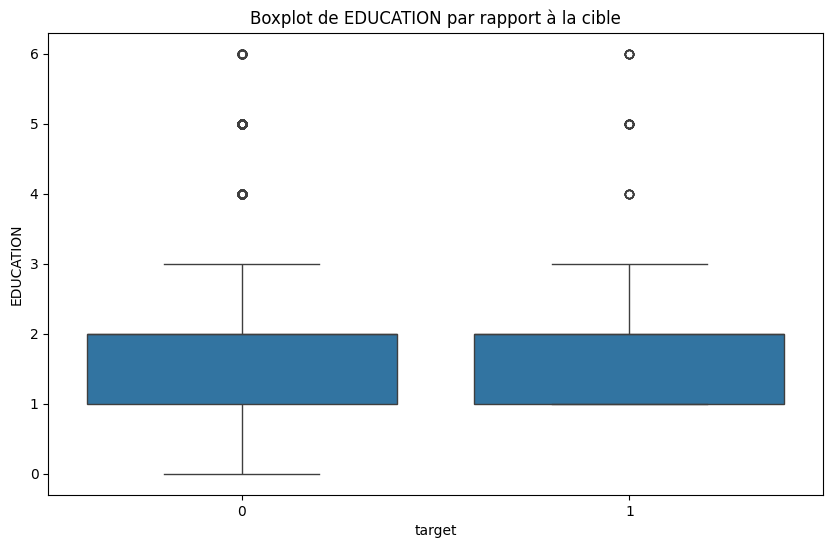

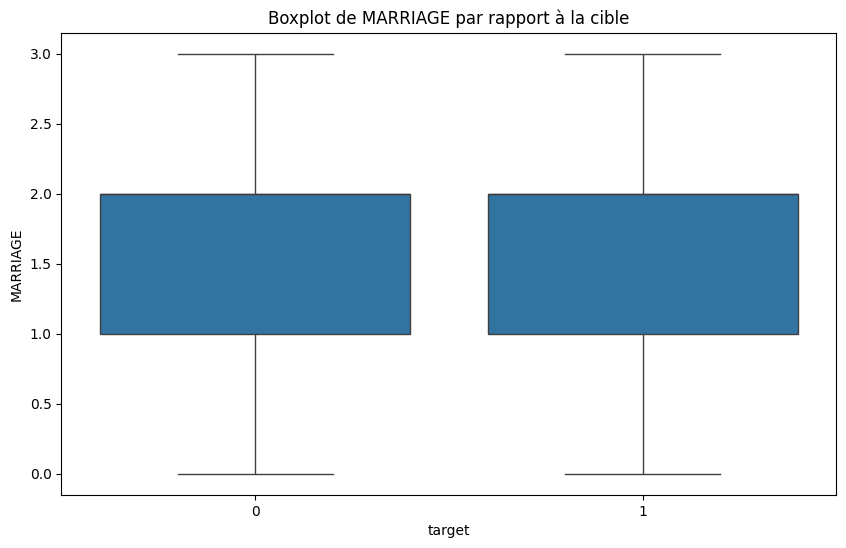

...

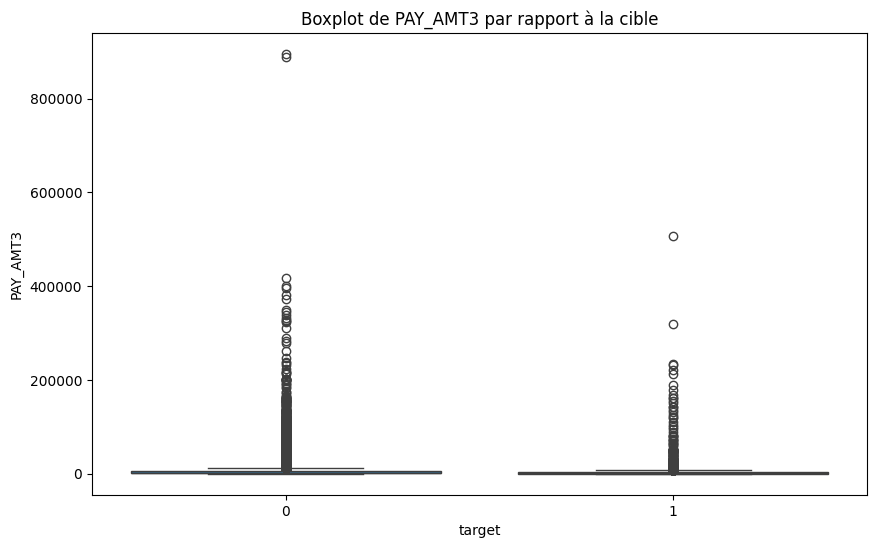

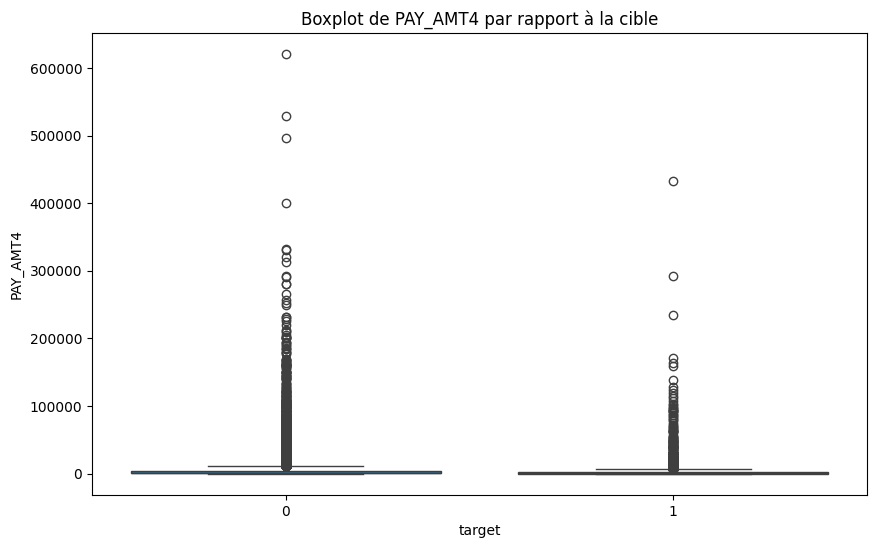

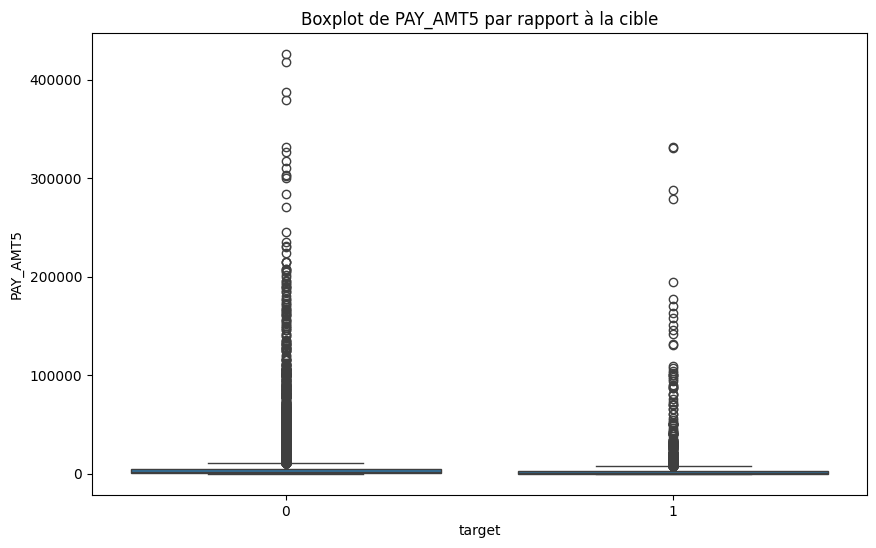

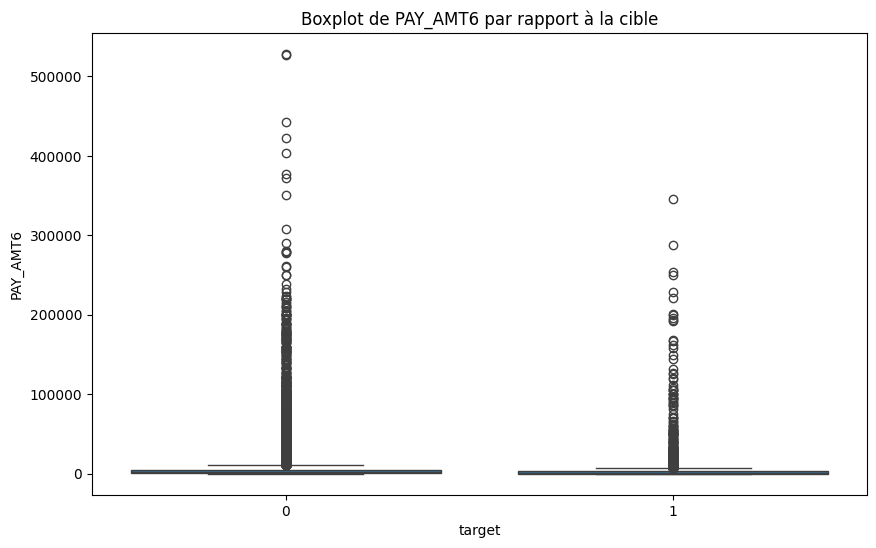

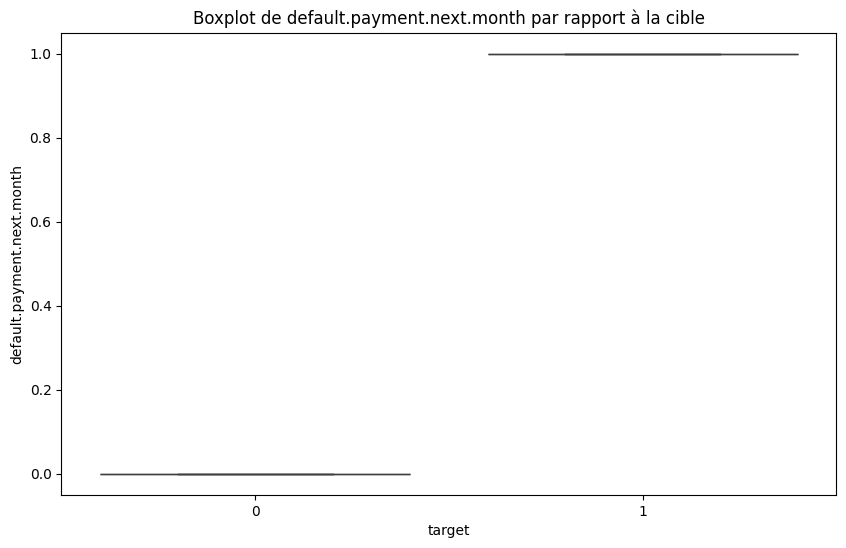

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_boxplots(X, y, figsize=(10, 6)):
    """
    Génère des boxplots pour chaque variable quantitative en fonction de la variable cible.

    Paramètres :
    ------------
    X : pandas.DataFrame
        Le DataFrame contenant les variables explicatives (features).

    y : pandas.Series
        La variable cible (target) avec des classes.

    figsize : tuple, facultatif
        Taille de la figure pour chaque boxplot (largeur, hauteur). Valeur par défaut : (10, 6).

    Retourne :
    ---------
    Aucun. Affiche les boxplots pour chaque variable quantitative.
    """
    # Sélectionner uniquement les variables quantitatives
    numeric_features = X.select_dtypes(include=['float64', 'int64']).columns

    # Fusionner X et y pour faciliter le tracé
    data = X.copy()
    data['target'] = y

    # Générer un boxplot pour chaque variable quantitative
    for feature in numeric_features:
        plt.figure(figsize=figsize)
        sns.boxplot(x='target', y=feature, data=data)
        plt.title(f'Boxplot de {feature} par rapport à la cible')
        plt.show()

y = data['default.payment.next.month']
# Exemple d'utilisation
plot_boxplots(data, y)

### Sélection de variables : Approche Basique (Variance Threshold)

L'approche basique consiste à éliminer les caractéristiques dont la variance est faible, car elles apportent peu d'information au modèle. Cette méthode est simple et rapide à mettre en œuvre.

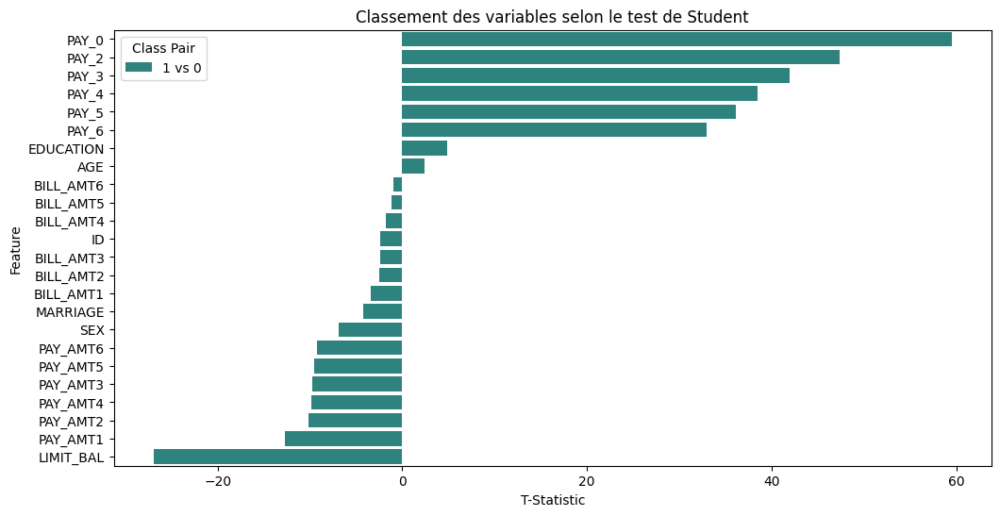

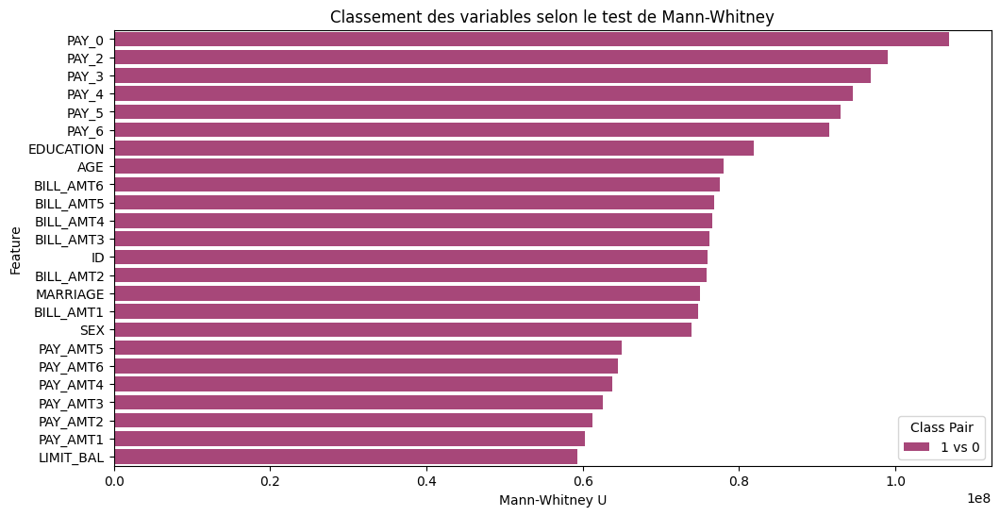

Résultats du test de Student :
      Feature  T-Statistic        P-Value Class Pair
6       PAY_0    59.478693   0.000000e+00     1 vs 0
7       PAY_2    47.319860   0.000000e+00     1 vs 0
8       PAY_3    41.922147   0.000000e+00     1 vs 0
9       PAY_4    38.429754   0.000000e+00     1 vs 0
10      PAY_5    36.119125  1.126608e-279     1 vs 0
11      PAY_6    32.945447  7.296740e-234     1 vs 0
3   EDUCATION     4.852537   1.225038e-06     1 vs 0
5         AGE     2.405942   1.613685e-02     1 vs 0
17  BILL_AMT6    -0.930495   3.521225e-01     1 vs 0
16  BILL_AMT5    -1.170934   2.416344e-01     1 vs 0
15  BILL_AMT4    -1.759189   7.855564e-02     1 vs 0
0          ID    -2.416704   1.566767e-02     1 vs 0
14  BILL_AMT3    -2.438112   1.476998e-02     1 vs 0
13  BILL_AMT2    -2.458503   1.395736e-02     1 vs 0
12  BILL_AMT1    -3.403018   6.673295e-04     1 vs 0
4    MARRIAGE    -4.216784   2.485364e-05     1 vs 0
2         SEX    -6.926677   4.395249e-12     1 vs 0
23   PAY_AMT6  

In [27]:
from scipy.stats import ttest_ind, mannwhitneyu
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations

def test_student_mannwhitney(X, y):
    """
    Effectue un test de Student (t-test) et un test de Mann-Whitney entre toutes les paires
    possibles de groupes dans la variable cible et l'ensemble des variables quantitatives.
    Les résultats des tests sont triés en fonction des valeurs des statistiques de test, et
    des graphiques sont générés pour visualiser le classement des variables.

    Paramètres :
    ------------
    X : pandas.DataFrame
        Le DataFrame contenant les variables explicatives (features).

    y : pandas.Series ou pandas.DataFrame
        La variable cible avec des classes (0, 1, ... ou plus).

    Retours :
    ---------
    ttest_results : pandas.DataFrame
        Un DataFrame contenant les résultats du test de Student pour chaque variable, trié par la statistique de test.

    mannwhitney_results : pandas.DataFrame
        Un DataFrame contenant les résultats du test de Mann-Whitney pour chaque variable, trié par la statistique de test.

    Visualisations :
    ----------------
    Deux graphiques sont générés :
    - Le premier montre le classement des variables selon le test de Student.
    - Le second montre le classement des variables selon le test de Mann-Whitney.
    """

    # Sélectionner uniquement les variables quantitatives
    numeric_features = X.select_dtypes(include=['float64', 'int64']).columns

    # Obtenir toutes les combinaisons possibles de paires dans la variable cible
    unique_classes = y.unique()
    class_pairs = list(combinations(unique_classes, 2))

    # Listes pour stocker les résultats des tests
    ttest_results = []
    mannwhitney_results = []

    # Appliquer les tests de Student et Mann-Whitney à chaque variable quantitative et à chaque paire de classes
    for feature in numeric_features:
        for class1, class2 in class_pairs:
            group1 = X[feature][y == class1]
            group2 = X[feature][y == class2]

            # Test de Student
            t_stat, t_pvalue = ttest_ind(group1, group2)
            ttest_results.append({'Feature': feature, 'T-Statistic': t_stat, 'P-Value': t_pvalue, 'Class Pair': f'{class1} vs {class2}'})

            # Test de Mann-Whitney (pour comparer deux groupes indépendants)
            mw_stat, mw_pvalue = mannwhitneyu(group1, group2, alternative='two-sided')
            mannwhitney_results.append({'Feature': feature, 'Mann-Whitney U': mw_stat, 'P-Value': mw_pvalue, 'Class Pair': f'{class1} vs {class2}'})

    # Convertir les listes en DataFrames
    ttest_results = pd.DataFrame(ttest_results).sort_values(by='T-Statistic', ascending=False)
    mannwhitney_results = pd.DataFrame(mannwhitney_results).sort_values(by='Mann-Whitney U', ascending=False)

    # Classer les statistiques de test du plus grand au plus petit pour la visualisation
    ttest_results['Feature'] = pd.Categorical(ttest_results['Feature'], categories=ttest_results['Feature'].unique(), ordered=True)
    mannwhitney_results['Feature'] = pd.Categorical(mannwhitney_results['Feature'], categories=mannwhitney_results['Feature'].unique(), ordered=True)

    # Visualisation des résultats
    plt.figure(figsize=(12, 6))
    sns.barplot(x='T-Statistic', y='Feature', data=ttest_results, palette='viridis', hue='Class Pair', dodge=False)
    plt.title('Classement des variables selon le test de Student')
    plt.show()

    plt.figure(figsize=(12, 6))
    sns.barplot(x='Mann-Whitney U', y='Feature', data=mannwhitney_results, palette='magma', hue='Class Pair', dodge=False)
    plt.title('Classement des variables selon le test de Mann-Whitney')
    plt.show()

    # Retourner les résultats triés
    return ttest_results, mannwhitney_results

# Utilisation de la fonction
ttest_results, mannwhitney_results = test_student_mannwhitney(X, y)

# Affichage des résultats
print("Résultats du test de Student :")
print(ttest_results)
print("\nRésultats du test de Mann-Whitney :")
print(mannwhitney_results)


## Sélection de Variables avec la Forêt Aléatoire (Random Forest)

In [13]:
# Diviser en train et test
df = data
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler


# Séparation des variables explicatives et cible

y = df['default.payment.next.month']
X = df.drop(columns=['ID','default.payment.next.month'])

from sklearn.model_selection import train_test_split

# Diviser les données en ensembles d'entraînement et de test de manière stratifiée
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

In [14]:
# Prétraitement des données
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

# Identification automatique des colonnes catégorielles
cat_columns = X_train.select_dtypes(include=['object', 'category', 'int64']).columns.tolist()

# Convertir les colonnes catégoriques en type 'str' pour éviter les erreurs
X_train[cat_columns] = X_train[cat_columns].astype(str)
X_test[cat_columns] = X_test[cat_columns].astype(str)

# Transformer les varaibles catégorielles
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(drop='first', handle_unknown='ignore'), cat_columns) #one hot encode categorical variables
    ],
    remainder='passthrough' #laisse les autres colonnes inchangées
)

In [15]:
# Transformer les variables catégorielles avec OneHotEncoder et garder les autres variables inchangées
X_train_transformed = preprocessor.fit_transform(X_train)
X_test_transformed = preprocessor.transform(X_test)
X_train_transformed

c:\Program Files\Python311\Lib\site-packages\sklearn\preprocessing\_encoders.py:227: UserWarning: Found unknown categories in columns [3] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


<24000x135 sparse matrix of type '<class 'numpy.float64'>'
	with 470659 stored elements in Compressed Sparse Row format>

In [ ]:
# Afficher les nouveaux noms de colonnes
new_columns = preprocessor.get_feature_names_out()
new_columns

array(['cat__SEX_2', 'cat__EDUCATION_1', 'cat__EDUCATION_2',
       'cat__EDUCATION_3', 'cat__EDUCATION_4', 'cat__EDUCATION_5',
       'cat__EDUCATION_6', 'cat__MARRIAGE_1', 'cat__MARRIAGE_2',
       'cat__MARRIAGE_3', 'cat__AGE_22', 'cat__AGE_23', 'cat__AGE_24',
       'cat__AGE_25', 'cat__AGE_26', 'cat__AGE_27', 'cat__AGE_28',
       'cat__AGE_29', 'cat__AGE_30', 'cat__AGE_31', 'cat__AGE_32',
       'cat__AGE_33', 'cat__AGE_34', 'cat__AGE_35', 'cat__AGE_36',
       'cat__AGE_37', 'cat__AGE_38', 'cat__AGE_39', 'cat__AGE_40',
       'cat__AGE_41', 'cat__AGE_42', 'cat__AGE_43', 'cat__AGE_44',
       'cat__AGE_45', 'cat__AGE_46', 'cat__AGE_47', 'cat__AGE_48',
       'cat__AGE_49', 'cat__AGE_50', 'cat__AGE_51', 'cat__AGE_52',
       'cat__AGE_53', 'cat__AGE_54', 'cat__AGE_55', 'cat__AGE_56',
       'cat__AGE_57', 'cat__AGE_58', 'cat__AGE_59', 'cat__AGE_60',
       'cat__AGE_61', 'cat__AGE_62', 'cat__AGE_63', 'cat__AGE_64',
       'cat__AGE_65', 'cat__AGE_66', 'cat__AGE_67', 'cat__AGE_68',

In [26]:
new_columns = [c.replace("cat__", "").replace("remainder__", "") for c in new_columns]
new_columns

['SEX_2',
 'EDUCATION_1',
 'EDUCATION_2',
 'EDUCATION_3',
 'EDUCATION_4',
 'EDUCATION_5',
 'EDUCATION_6',
 'MARRIAGE_1',
 'MARRIAGE_2',
 'MARRIAGE_3',
 'AGE_22',
 'AGE_23',
 'AGE_24',
 'AGE_25',
 'AGE_26',
 'AGE_27',
 'AGE_28',
 'AGE_29',
 'AGE_30',
 'AGE_31',
 'AGE_32',
 'AGE_33',
 'AGE_34',
 'AGE_35',
 'AGE_36',
 'AGE_37',
 'AGE_38',
 'AGE_39',
 'AGE_40',
 'AGE_41',
 'AGE_42',
 'AGE_43',
 'AGE_44',
 'AGE_45',
 'AGE_46',
 'AGE_47',
 'AGE_48',
 'AGE_49',
 'AGE_50',
 'AGE_51',
 'AGE_52',
 'AGE_53',
 'AGE_54',
 'AGE_55',
 'AGE_56',
 'AGE_57',
 'AGE_58',
 'AGE_59',
 'AGE_60',
 'AGE_61',
 'AGE_62',
 'AGE_63',
 'AGE_64',
 'AGE_65',
 'AGE_66',
 'AGE_67',
 'AGE_68',
 'AGE_69',
 'AGE_70',
 'AGE_71',
 'AGE_72',
 'AGE_73',
 'AGE_74',
 'AGE_75',
 'PAY_0_-2',
 'PAY_0_0',
 'PAY_0_1',
 'PAY_0_2',
 'PAY_0_3',
 'PAY_0_4',
 'PAY_0_5',
 'PAY_0_6',
 'PAY_0_7',
 'PAY_0_8',
 'PAY_2_-2',
 'PAY_2_0',
 'PAY_2_1',
 'PAY_2_2',
 'PAY_2_3',
 'PAY_2_4',
 'PAY_2_5',
 'PAY_2_6',
 'PAY_2_7',
 'PAY_2_8',
 'PAY_3_-2',


In [ ]:
#Autres techniques mais moins recommandées :
# Récupérer les noms des nouvelles colonnes créées par OneHotEncoder
onehot_columns = preprocessor.named_transformers_['cat'].get_feature_names_out(cat_columns)
# Fusionner avec les colonnes numériques originales
new_columns = list(onehot_columns) + list(X_train.select_dtypes(exclude=['object', 'category']).columns)

# Afficher les nouveaux noms de colonnes
new_columns

In [27]:

# Convertir en DataFrame avec les nouveaux noms de colonnes
X_train_transformed_df = pd.DataFrame(X_train_transformed.toarray(), columns=new_columns, index=X_train.index)
X_test_transformed_df = pd.DataFrame(X_test_transformed.toarray(), columns=new_columns, index=X_test.index)

# Afficher les premières lignes du DataFrame transformé
X_train_transformed_df.head()

,SEX_2,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,EDUCATION_5,EDUCATION_6,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
22788,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,168541.0,164310.0,162681.0,163005.0,15000.0,0.0,0.0,6100.0,12300.0,6100.0
29006,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,53.0,0.0,0.0,0.0,0.0,0.0
16950,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,8446.0,8067.0,8227.0,8400.0,2.0,1281.0,1134.0,294.0,305.0,1000.0
22280,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,215139.0,218513.0,131660.0,134346.0,9100.0,9000.0,7887.0,4800.0,4900.0,6000.0
11346,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,326.0,326.0,-235.0,-235.0,0.0,326.0,0.0,0.0,0.0,1200.0


In [28]:
from sklearn.ensemble import RandomForestClassifier
import numpy as np

# Créer et entraîner une forêt aléatoire
forest = RandomForestClassifier(random_state=42)
forest.fit(X_train_transformed_df, y_train)

# Importance des variables
importances_forest = forest.feature_importances_
selected_features_forest = X_train_transformed_df.columns[importances_forest > np.mean(importances_forest)]
print("Les variables sélectionnées par la Forêt Aléatoire sont :")
print(selected_features_forest)

Les variables sélectionnées par la Forêt Aléatoire sont :
Index(['SEX_2', 'EDUCATION_1', 'EDUCATION_2', 'MARRIAGE_1', 'MARRIAGE_2',
       'PAY_0_0', 'PAY_0_1', 'PAY_0_2', 'PAY_2_2', 'PAY_3_2', 'PAY_4_2',
       'PAY_5_2', 'PAY_6_2', 'LIMIT_BAL', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6'],
      dtype='object')


In [29]:
# Créer un DataFrame pour les importances des variables
feature_importances_forest = pd.DataFrame({'Feature': X_train_transformed_df.columns, 'Importance': importances_forest})

# Trier les importances des variables de la plus importante à la moins importante
feature_importances_forest = feature_importances_forest.sort_values(by='Importance', ascending=False)

In [33]:
top_n = 15
top_features = feature_importances_forest.sort_values(
    by='Importance', ascending=False
).head(top_n)

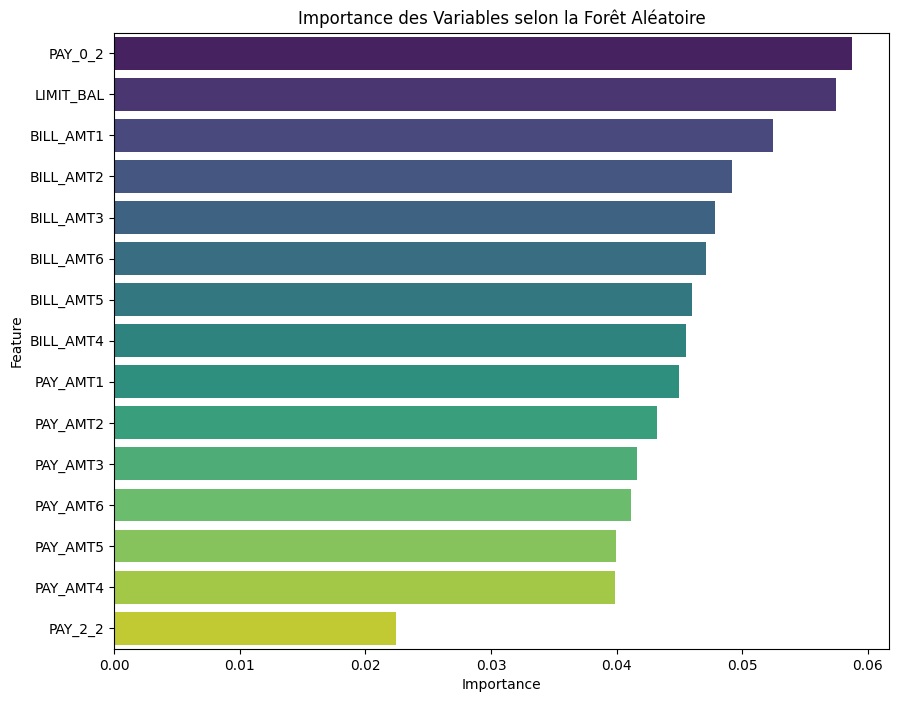

In [34]:
import matplotlib.pyplot as plt
import seaborn as sns

# Créer un graphique en barres pour visualiser les importances
plt.figure(figsize=(10, 8))
sns.barplot(x='Importance', y='Feature', hue= 'Feature', data=top_features, palette='viridis', legend=False)
plt.title('Importance des Variables selon la Forêt Aléatoire')
plt.show()